In [1]:
%load_ext autoreload
%autoreload 2

# SpookyNet


This tutorial gives an example of implementing the [SpookyNet architecture](https://arxiv.org/pdf/2105.00304.pdf). SpookyNet explicitly encodes charge and spin properties of the system. It allows the charge to be delocalized across the system by using an attention mechanism among all pairs of atoms in the system. The attention scales linearly with the system size, even though it incorporates $N^2$ interactions for N atoms. This is thanks to the [FAVOR+ algorithm](https://arxiv.org/pdf/2009.14794.pdf). Further, SpookyNet contains (optional) electrostatic terms that couple atomic partial charges, nuclear-nuclear repulsion terms, and D4 dispersion.

First we import dependencies for the tutorial:

In [1]:
import sys
from pathlib import Path

# change to your NFF path
sys.path.insert(0, "C:/Users/fraja/Documents/prueba/NeuralForceField")

In [1]:
import sys
from pathlib import Path

# change to your NFF path
sys.path.insert(0, "C:/Users/fraja/Documents/prueba/NeuralForceField")

import os
import shutil
import numpy as np
import matplotlib.pyplot as plt
import copy

import torch
from torch.optim import Adam
from torch.utils.data import DataLoader
from torch.utils.data.sampler import RandomSampler


from nff.data import Dataset, split_train_validation_test, collate_dicts, to_tensor
from  nff.train import Trainer, get_trainer, get_model, load_model, loss, hooks, metrics, evaluate

In this tutorial we'll load a carbene chain dataset used as a benchmark in the SpookyNet paper. The dataset contains half C10H2 molecules and half C10H3+ molecules. When one end of the chain is protonated, the electronic structure along the whole chain is modified. 

When making a dataset with dipoles, make sure they're in units of e Angstroms, where e is the charge of the electron (the database dipoles are in units of Debye = 0.2081943 $eA$; when using the dataset export script `neuralnet/utils//dataset/dset_v2.py`, these are converted to $eA$). Here we only train on partial charges, not dipoles (see below), but training on dipoles is also an option for SpookyNet.

In [2]:
DEVICE = "cuda:0"
OUTDIR = './spooky'
# batch size in the original paper
BATCH_SIZE = 10
# cutoff in original paper 
bohr_radius = 0.529
r_cut = 10 * bohr_radius

path = 'data/dataset_prueba.pth.tar'
path = 'data/prueba.pth.tar' 
dataset = Dataset.from_file(path)



In addition to the usual neighbor list, we must also generate a neighbor list that has infinite cutoff (i.e. couples all pairs of atoms in each molecule) so that we can add the electrostatics terms. This neighbor list should be called `mol_nbrs`:

In [3]:
_ = dataset.generate_neighbor_list(cutoff=r_cut,
                                   key='nbr_list',
                                   undirected=False,
                                   offset_key='offsets')

_ = dataset.generate_neighbor_list(cutoff=float('inf'),
                                   key='mol_nbrs',
                                   undirected=True,
                                   offset_key='mol_offsets')

Note also that this dataset has `charge` and `spin` as properties, which are necessary for SpookyNet:

Now we split the dataset:

In [4]:
train, val, test = split_train_validation_test(dataset, 
                                               val_size=0.1, 
                                               test_size=0.01,
                                               seed=0)

Next we make the model. If you set `non_local=True`, make sure to install [PyTorch Performer](https://github.com/lucidrains/performer-pytorch), which computes attention in order N time for N atoms. This can be done with `pip install performer-pytorch`.



In [5]:
modelparams = dict(
        output_key='energy',
        dip_key='dipole',
        #charge_key='q',
        activation="swish",
        num_features=128, # Dimensions of feature space
        num_basis_functions=16, # Number of radial basis functions.
        num_modules=6, # Number of modules (iterations) for constructing atomic features.
        num_residual_electron=1, # Number of residual blocks applied to features encoding the electronic 
                                 # state
        num_residual_pre=1, # Number of residual blocks applied to atomic features in each module
                            # (before other transformations)
        num_residual_local_x=1, # Number of residual blocks (per module) applied to atomic features in 
                                # local interaction
        num_residual_local_s=1, # Number of residual blocks (per module) applied to s-type interaction 
                                # featur esin local interaction
        num_residual_local_p=1, # Number of residual blocks (per module) applied to p-type interaction 
                                # features in local interaction
        num_residual_local_d=1, # Number of residual blocks (per module) applied to d-type interaction 
                                # features in local interaction
        num_residual_local=1,
        num_residual_nonlocal_q=1,
        num_residual_nonlocal_k=1,
        num_residual_nonlocal_v=1,
        num_residual_post=1, # Number of residual blocks applied to atomic features after
                             # interaction with neighbouring atoms (per module)
        num_residual_output=1, # Number of residual blocks applied to atomic features in output
                               # branch (per module)
        basis_functions="exp-bernstein", #  Kind of radial basis functions. Possible values:
                                         # 'exp-bernstein': Exponential Bernstein polynomials.
                                         # 'exp-gaussian': Exponential Gaussian functions.
                                         # 'bernstein': Bernstein polynomials.
                                         # 'gaussian': Gaussian functions.
        exp_weighting=True, # Apply exponentially decaying weights to radial basis functions. Only
                            # used when 'basis_functions' argument is 'exp-bernstein' or
                            # 'exp-gaussian'. Probably has almost no effect unless the weights of
                            # radial functions are regularized.
        cutoff=r_cut, # Cutoff radius for (neural network) interactions.
        lr_cutoff=None, # Cutoff radius for long-range interactions (no cutoff is applied when
                        # this argument is None)
        use_zbl_repulsion=True, # If True, short-range repulsion inspired by the ZBL repulsive
                                # potential is applied to the energy prediction.
        use_electrostatics=True, # If True, point-charge electrostatics for the predicted atomic
                                 # partial charges is applied to the energy prediction
        use_d4_dispersion=True, # If True, Grimme's D4 dispersion correction is applied to the energy
                                # prediction
        use_irreps=True, # For compatibility with older versions of the code
        use_nonlinear_embedding=False, # For compatibility with older versions of the code
        compute_d4_atomic=False, # If True, atomic polarizabilities and C6 coefficients in Grimme's D4
                                 # dispersion correction are computed
        module_keep_prob=1.0, # Probability of keeping the last module during training. Module
                              # dropout can be a useful regularization that encourages
                              # hierarchicacally decaying contributions to the atomic features.
                              # Earlier modules are dropped with an automatically determined lower
                              # probability. Should be between 0.0 and 1.0
        load_from=None, # Load saved parameters from the given path instead of using random
                        # initialization (when 'load_from' is None)
        Zmax=87, # Maximum nuclear charge +1 of atoms. The default is 87, so all
                 # elements up to Rn (Z=86) are supported. Can be kept at the default
                 # value (has minimal memory impact). Note that Grimme's D4 dispersion
                 # can only handle elements up to Rn (Z=86)
        zero_init=True # Initialize parameters with zero whenever possible?
)

In [6]:
modelparams = dict(
        output_key='energy',
        dip_key='dipole',
        #charge_key='q',
        activation="swish",
        num_features=128, # Dimensions of feature space
        num_basis_functions=16, # Number of radial basis functions.
        num_modules=6, # Number of modules (iterations) for constructing atomic features.
        num_residual_electron=1, # Number of residual blocks applied to features encoding the electronic 
                                 # state
        num_residual_pre=1, # Number of residual blocks applied to atomic features in each module
                            # (before other transformations)
        num_residual_local_x=1, # Number of residual blocks (per module) applied to atomic features in 
                                # local interaction
        num_residual_local_s=1, # Number of residual blocks (per module) applied to s-type interaction 
                                # featur esin local interaction
        num_residual_local_p=1, # Number of residual blocks (per module) applied to p-type interaction 
                                # features in local interaction
        num_residual_local_d=1, # Number of residual blocks (per module) applied to d-type interaction 
                                # features in local interaction
        num_residual_local=1,
        num_residual_nonlocal_q=1,
        num_residual_nonlocal_k=1,
        num_residual_nonlocal_v=1,
        num_residual_post=1, # Number of residual blocks applied to atomic features after
                             # interaction with neighbouring atoms (per module)
        num_residual_output=1, # Number of residual blocks applied to atomic features in output
                               # branch (per module)
        basis_functions="exp-bernstein", #  Kind of radial basis functions. Possible values:
                                         # 'exp-bernstein': Exponential Bernstein polynomials.
                                         # 'exp-gaussian': Exponential Gaussian functions.
                                         # 'bernstein': Bernstein polynomials.
                                         # 'gaussian': Gaussian functions.
        exp_weighting=True, # Apply exponentially decaying weights to radial basis functions. Only
                            # used when 'basis_functions' argument is 'exp-bernstein' or
                            # 'exp-gaussian'. Probably has almost no effect unless the weights of
                            # radial functions are regularized.
        cutoff=r_cut, # Cutoff radius for (neural network) interactions.
        lr_cutoff=None, # Cutoff radius for long-range interactions (no cutoff is applied when
                        # this argument is None)
        use_zbl_repulsion=True, # If True, short-range repulsion inspired by the ZBL repulsive
                                # potential is applied to the energy prediction.
        use_electrostatics=True, # If True, point-charge electrostatics for the predicted atomic
                                 # partial charges is applied to the energy prediction
        use_d4_dispersion=True, # If True, Grimme's D4 dispersion correction is applied to the energy
                                # prediction
        use_irreps=True, # For compatibility with older versions of the code
        use_nonlinear_embedding=False, # For compatibility with older versions of the code
        compute_d4_atomic=False, # If True, atomic polarizabilities and C6 coefficients in Grimme's D4
                                 # dispersion correction are computed
        module_keep_prob=1.0, # Probability of keeping the last module during training. Module
                              # dropout can be a useful regularization that encourages
                              # hierarchicacally decaying contributions to the atomic features.
                              # Earlier modules are dropped with an automatically determined lower
                              # probability. Should be between 0.0 and 1.0
        load_from=None, # Load saved parameters from the given path instead of using random
                        # initialization (when 'load_from' is None)
        Zmax=87, # Maximum nuclear charge +1 of atoms. The default is 87, so all
                 # elements up to Rn (Z=86) are supported. Can be kept at the default
                 # value (has minimal memory impact). Note that Grimme's D4 dispersion
                 # can only handle elements up to Rn (Z=86)
        zero_init=True # Initialize parameters with zero whenever possible?
)


model = get_model(modelparams, model_type="RealSpookyNet")

# untrained model to test for equivariant/invariant outputs
original_model = copy.deepcopy(model)

Note that you should probably only use the D4 dispersion term if your ground truth quantum chemistry method contains dispersion

In [7]:
if os.path.exists(OUTDIR):
    newpath = os.path.join(os.path.dirname(OUTDIR), 'backup')
    if os.path.exists(newpath):
        shutil.rmtree(newpath)
        
    shutil.move(OUTDIR, newpath)

Next we make the training splits, loaders, and trainer. A few notes:
- In addition the normal force and energy loss terms, you can add a loss term for the dipole moment, so that the model can learn partial charges to reproduce the dipole. In addition or in place of this loss, you can add a loss term for partial charges. This dataset contains partial charges and not dipoles, so we use the latter.
- Remember to use a random sampler for the train loader, because that makes a big difference in the results (at least for small datasets)


In [8]:
from nff.utils.constants import BOHR_RADIUS, KCAL_TO_AU

grad_conv = KCAL_TO_AU['energy'] * KCAL_TO_AU['_grad']
en_conv = KCAL_TO_AU['energy']

val_loader = DataLoader(val, 
                        batch_size=BATCH_SIZE, 
                        collate_fn=collate_dicts)

In [9]:
from nff.utils.constants import BOHR_RADIUS, KCAL_TO_AU

grad_conv = KCAL_TO_AU['energy'] * KCAL_TO_AU['_grad']
en_conv = KCAL_TO_AU['energy']


train_loader = DataLoader(train, 
                          batch_size=BATCH_SIZE, 
                          collate_fn=collate_dicts,
                          sampler=RandomSampler(train))

val_loader = DataLoader(val, 
                        batch_size=BATCH_SIZE, 
                        collate_fn=collate_dicts)

test_loader = DataLoader(test, 
                         batch_size=BATCH_SIZE, 
                         collate_fn=collate_dicts)

# loss coefficients in the original paper (the paper used AU so
# we convert their 1/1/1 loss from atomic units). They also
# use an RMSE loss

loss_fn = loss.build_rmse_loss(loss_coef={'energy_grad': 1.0 * grad_conv, 
                                          'energy': 1.0 * en_conv
                                          #'q': 1.0
                                          })

trainable_params = filter(lambda p: p.requires_grad, model.parameters())
# Loss rate in original paper was 1e-3 and they used amsgrad
optimizer = Adam(trainable_params, 
                 lr=1e-3,
                 amsgrad=True)


train_metrics = [
    metrics.MeanAbsoluteError('energy'),
    metrics.MeanAbsoluteError('energy_grad'),

]


train_hooks = [
    hooks.MaxEpochHook(5000),
    hooks.CSVHook(
        OUTDIR,
        metrics=train_metrics,
    ),
    hooks.PrintingHook(
        OUTDIR,
        metrics=train_metrics,
        separator = ' | ',
        time_strf='%M:%S'
    ),
    hooks.ReduceLROnPlateauHook(
        optimizer=optimizer,
        patience=25,
        factor=0.5,
        min_lr=1e-5,
        window_length=1,
        stop_after_min=True
    )
]

T = Trainer(
    model_path=OUTDIR,
    modelparam = modelparams,
    model=model,
    loss_fn=loss_fn,
    optimizer=optimizer,
    train_loader=train_loader,
    validation_loader=val_loader,
    checkpoint_interval=1,
    hooks=train_hooks,
    mini_batches=1
)

{'output_key': 'energy', 'dip_key': 'dipole', 'activation': 'swish', 'num_features': 128, 'num_basis_functions': 16, 'num_modules': 6, 'num_residual_electron': 1, 'num_residual_pre': 1, 'num_residual_local_x': 1, 'num_residual_local_s': 1, 'num_residual_local_p': 1, 'num_residual_local_d': 1, 'num_residual_local': 1, 'num_residual_nonlocal_q': 1, 'num_residual_nonlocal_k': 1, 'num_residual_nonlocal_v': 1, 'num_residual_post': 1, 'num_residual_output': 1, 'basis_functions': 'exp-bernstein', 'exp_weighting': True, 'cutoff': 5.29, 'lr_cutoff': None, 'use_zbl_repulsion': True, 'use_electrostatics': True, 'use_d4_dispersion': True, 'use_irreps': True, 'use_nonlinear_embedding': False, 'compute_d4_atomic': False, 'module_keep_prob': 1.0, 'load_from': None, 'Zmax': 87, 'zero_init': True}


In [10]:
T.train(device=DEVICE, n_epochs=2)


 Time | Epoch | Learning rate | Train loss | Validation loss | MAE_energy | MAE_energy_grad | GPU Memory (MB)


100%|█████████▉| 1779/1780 [16:43<00:00,  1.77it/s]


00:14 |     1 |     1.000e-03 |     0.0184 |          0.0104 |     3.4725 |          5.7713 |             427
{'epoch': 1, 'step': 1780, 'best_loss': 0.010400643353350461, 'optimizer': {'state': {0: {'step': tensor(1780.), 'exp_avg': tensor([[ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0652, -0.0065],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0041,  0.0065],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 

100%|█████████▉| 1779/1780 [15:47<00:00,  1.88it/s]


16:53 |     2 |     1.000e-03 |     0.0075 |          0.0063 |     1.2415 |          5.0970 |             427
{'epoch': 2, 'step': 3560, 'best_loss': 0.006276719707529992, 'optimizer': {'state': {0: {'step': tensor(3560.), 'exp_avg': tensor([[ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0496, -0.0044],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0031,  0.0044],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 

#### The reported accuracy in the paper was:
- Energy: 0.10 kcal/mol
- Forces: 0.13 kcal/mol/A
- Charges: 0.00012 $e$

#### The previous best results from 4G-BPNN were:
- Energy: 0.34 kcal/mol
- Forces: 1.8 kcal/mol/A 
- Charges: 0.0066 $e$

If you continue training until convergence you should get the same as in the SpookyNet paper! For now we'll just plot what we got after a few epochs:

In [11]:
from sklearn.metrics import r2_score

best_model = load_model(OUTDIR, modelparams, 'RealSpookyNet')

RealSpookyNet
pase


In [13]:
best_model.save('pruebaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa.pth')

In [16]:
from sklearn.metrics import r2_score

best_model = load_model(OUTDIR, modelparams, 'RealSpookyNet')
results, targets, val_loss = evaluate(best_model,
                                      val_loader, 
                                      loss_fn, 
                                      device=DEVICE)

pase


  0%|          | 0/200 [00:00<?, ?it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3993e+00, -3.5531e-01,  1.7542e+00],
        [ 1.4000e+01, -1.3496e+00, -8.5568e-01,  1.7841e+00],
        [ 1.4000e+01,  1.6606e+00,  1.0393e+00, -6.6949e-01],
        [ 1.4000e+01,  3.9009e+00, -1.4129e+00,  2.7393e+00],
        [ 1.4000e+01,  3.7169e+00,  9.7976e-01,  2.7837e+00],
        [ 1.4000e+01, -1.3779e-01, -1.7257e+00,  3.7073e+00],
        [ 1.4000e+01,  3.1294e-01, -2.4994e+00,  9.6453e-01],
        [ 1.4000e+01, -5.3711e-01,  6.2997e-01,  3.6060e+00],
        [ 1.4000e+01, -1.5076e-01,  1.6589e+00,  1.3319e+00],
        [ 1.4000e+01, -4.3750e-01, -1.1569e-01, -3.7139e-01],
        [ 1.4000e+01,  2.8949e+00, -2.5332e+00,  8.3376e-01],
        [ 1.4000e+01,  2.0544e+00, -5.2476e-01,  4.2855e+00],
        [ 1.4000e+01,  1.4739e+00,  1.8043e+00,  3.4899e+00],
        [ 1.4000e+01,  1.5863e+00, -1.4082e+00, -8.6586e-01],
        [ 1.4000e+01,  2.3305e+00,  2.3008e+00,  1.2878e+00],
        [ 1.4000e+01,  3.5464e+00, -3.0196e-02,  4.5919e-01],

  1%|          | 2/200 [00:04<06:17,  1.91s/it]

{'nxyz': tensor([[ 2.3000e+01,  1.4350e+00, -3.3786e-01,  1.7972e+00],
        [ 1.4000e+01, -1.3859e+00, -6.8328e-01,  1.8629e+00],
        [ 1.4000e+01,  1.6143e+00,  1.0316e+00, -6.9530e-01],
        [ 1.4000e+01,  3.8283e+00, -1.4464e+00,  2.8035e+00],
        [ 1.4000e+01,  3.7718e+00,  1.0240e+00,  2.7082e+00],
        [ 1.4000e+01, -1.6568e-01, -1.7947e+00,  3.5936e+00],
        [ 1.4000e+01,  2.2278e-01, -2.4036e+00,  9.1432e-01],
        [ 1.4000e+01, -4.0574e-01,  6.2537e-01,  3.7235e+00],
        [ 1.4000e+01, -1.2738e-01,  1.6865e+00,  1.4123e+00],
        [ 1.4000e+01, -4.8036e-01, -1.1545e-01, -2.5475e-01],
        [ 1.4000e+01,  2.9028e+00, -2.5077e+00,  7.4234e-01],
        [ 1.4000e+01,  1.9979e+00, -6.1032e-01,  4.3128e+00],
        [ 1.4000e+01,  1.6355e+00,  1.7620e+00,  3.4918e+00],
        [ 1.4000e+01,  1.5433e+00, -1.3847e+00, -8.7479e-01],
        [ 1.4000e+01,  2.3106e+00,  2.2984e+00,  1.2034e+00],
        [ 1.4000e+01,  3.5411e+00, -1.1635e-01,  4.8580e-01],

  2%|▏         | 4/200 [00:04<02:28,  1.32it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4265e+00, -3.3805e-01,  1.7929e+00],
        [ 1.4000e+01, -1.4606e+00, -6.9697e-01,  1.9014e+00],
        [ 1.4000e+01,  1.6225e+00,  1.0381e+00, -6.9867e-01],
        [ 1.4000e+01,  3.8269e+00, -1.5178e+00,  2.8156e+00],
        [ 1.4000e+01,  3.7605e+00,  9.0117e-01,  2.6765e+00],
        [ 1.4000e+01, -9.5411e-02, -1.8164e+00,  3.5790e+00],
        [ 1.4000e+01,  1.6004e-01, -2.3791e+00,  1.0497e+00],
        [ 1.4000e+01, -3.8733e-01,  5.9800e-01,  3.6375e+00],
        [ 1.4000e+01, -9.7706e-02,  1.6757e+00,  1.3762e+00],
        [ 1.4000e+01, -4.8319e-01, -9.0483e-02, -3.0128e-01],
        [ 1.4000e+01,  3.0322e+00, -2.3935e+00,  7.1446e-01],
        [ 1.4000e+01,  1.9385e+00, -5.3356e-01,  4.2381e+00],
        [ 1.4000e+01,  1.6354e+00,  1.8845e+00,  3.6279e+00],
        [ 1.4000e+01,  1.5207e+00, -1.4001e+00, -7.6657e-01],
        [ 1.4000e+01,  2.3308e+00,  2.2081e+00,  1.2287e+00],
        [ 1.4000e+01,  3.5554e+00,  5.3507e-02,  3.8762e-01],

  3%|▎         | 6/200 [00:05<01:20,  2.40it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4346e+00, -3.6801e-01,  1.7439e+00],
        [ 1.4000e+01, -1.4388e+00, -4.7763e-01,  1.8988e+00],
        [ 1.4000e+01,  1.3701e+00,  1.1544e+00, -6.5245e-01],
        [ 1.4000e+01,  3.9616e+00, -1.3708e+00,  2.4421e+00],
        [ 1.4000e+01,  3.6190e+00,  9.1701e-01,  3.0806e+00],
        [ 1.4000e+01, -2.1467e-01, -1.9315e+00,  3.4201e+00],
        [ 1.4000e+01,  1.9166e-01, -2.4405e+00,  9.8221e-01],
        [ 1.4000e+01, -3.4154e-01,  4.6265e-01,  3.9372e+00],
        [ 1.4000e+01, -7.7945e-03,  1.6260e+00,  1.3701e+00],
        [ 1.4000e+01, -5.2066e-01, -2.5715e-01, -3.4545e-01],
        [ 1.4000e+01,  2.6731e+00, -2.6512e+00,  7.9552e-01],
        [ 1.4000e+01,  1.9166e+00, -5.1836e-01,  4.2259e+00],
        [ 1.4000e+01,  1.4727e+00,  1.8806e+00,  3.3541e+00],
        [ 1.4000e+01,  1.7240e+00, -1.2808e+00, -9.2421e-01],
        [ 1.4000e+01,  2.6185e+00,  2.1347e+00,  1.2160e+00],
        [ 1.4000e+01,  3.5819e+00,  2.5390e-02,  4.1009e-01],

  4%|▎         | 7/200 [00:05<01:04,  3.01it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4178e+00, -3.5392e-01,  1.7572e+00],
        [ 1.4000e+01, -1.3998e+00, -3.6133e-01,  1.7384e+00],
        [ 1.4000e+01,  1.2774e+00,  1.2310e+00, -6.5374e-01],
        [ 1.4000e+01,  3.8614e+00, -1.5514e+00,  2.5565e+00],
        [ 1.4000e+01,  3.7308e+00,  8.8142e-01,  2.7852e+00],
        [ 1.4000e+01, -3.4774e-01, -1.8747e+00,  3.3370e+00],
        [ 1.4000e+01,  2.3277e-01, -2.5137e+00,  9.7279e-01],
        [ 1.4000e+01, -3.1089e-01,  4.7858e-01,  3.8298e+00],
        [ 1.4000e+01, -5.1747e-02,  1.6635e+00,  1.5694e+00],
        [ 1.4000e+01, -4.1184e-01, -4.6120e-01, -4.0614e-01],
        [ 1.4000e+01,  2.6719e+00, -2.6976e+00,  8.1929e-01],
        [ 1.4000e+01,  2.0272e+00, -4.6126e-01,  4.2956e+00],
        [ 1.4000e+01,  1.6139e+00,  1.8142e+00,  3.5147e+00],
        [ 1.4000e+01,  1.8687e+00, -1.1415e+00, -8.2114e-01],
        [ 1.4000e+01,  2.4448e+00,  2.1939e+00,  1.1768e+00],
        [ 1.4000e+01,  3.6085e+00,  4.3918e-02,  4.5887e-01],

  4%|▍         | 9/200 [00:05<00:50,  3.78it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4203e+00, -3.6029e-01,  1.7322e+00],
        [ 1.4000e+01, -1.4406e+00, -3.1727e-01,  1.7074e+00],
        [ 1.4000e+01,  1.4267e+00,  1.2058e+00, -5.2733e-01],
        [ 1.4000e+01,  3.7933e+00, -1.5663e+00,  2.7461e+00],
        [ 1.4000e+01,  3.6106e+00,  7.9935e-01,  3.0226e+00],
        [ 1.4000e+01, -3.5324e-01, -1.7608e+00,  3.4528e+00],
        [ 1.4000e+01,  1.5474e-01, -2.4435e+00,  9.6935e-01],
        [ 1.4000e+01, -3.3582e-01,  5.3606e-01,  3.7562e+00],
        [ 1.4000e+01,  2.3725e-02,  1.7539e+00,  1.4059e+00],
        [ 1.4000e+01, -3.4326e-01, -4.6779e-01, -4.4143e-01],
        [ 1.4000e+01,  2.7264e+00, -2.6575e+00,  7.7444e-01],
        [ 1.4000e+01,  1.8240e+00, -6.6722e-01,  4.2669e+00],
        [ 1.4000e+01,  1.5382e+00,  1.9333e+00,  3.4079e+00],
        [ 1.4000e+01,  1.9562e+00, -1.1195e+00, -9.0078e-01],
        [ 1.4000e+01,  2.7106e+00,  2.2306e+00,  1.1779e+00],
        [ 1.4000e+01,  3.6426e+00, -6.5883e-02,  5.5393e-01],

  6%|▌         | 11/200 [00:06<00:41,  4.51it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4758e+00, -3.7523e-01,  1.8033e+00],
        [ 1.4000e+01, -1.5099e+00, -6.5594e-01,  1.9327e+00],
        [ 1.4000e+01,  1.5037e+00,  1.0454e+00, -6.6543e-01],
        [ 1.4000e+01,  3.8547e+00, -1.3689e+00,  2.6809e+00],
        [ 1.4000e+01,  3.5997e+00,  8.9488e-01,  2.9544e+00],
        [ 1.4000e+01, -5.9596e-02, -1.7957e+00,  3.5044e+00],
        [ 1.4000e+01,  2.3625e-01, -2.4529e+00,  9.8051e-01],
        [ 1.4000e+01, -3.9737e-01,  6.1828e-01,  3.7050e+00],
        [ 1.4000e+01, -9.6084e-02,  1.6723e+00,  1.3195e+00],
        [ 1.4000e+01, -4.7464e-01, -3.1484e-01, -2.2733e-01],
        [ 1.4000e+01,  2.9178e+00, -2.4549e+00,  7.1529e-01],
        [ 1.4000e+01,  1.8643e+00, -5.2836e-01,  4.2897e+00],
        [ 1.4000e+01,  1.5223e+00,  1.9860e+00,  3.4165e+00],
        [ 1.4000e+01,  1.6333e+00, -1.3700e+00, -8.9790e-01],
        [ 1.4000e+01,  2.4847e+00,  2.1335e+00,  1.2233e+00],
        [ 1.4000e+01,  3.5794e+00,  4.0430e-05,  3.6735e-01],

  6%|▋         | 13/200 [00:06<00:37,  5.04it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4223e+00, -3.6583e-01,  1.7783e+00],
        [ 1.4000e+01, -1.3228e+00, -7.1985e-01,  1.8784e+00],
        [ 1.4000e+01,  1.5873e+00,  1.0565e+00, -6.4907e-01],
        [ 1.4000e+01,  3.8764e+00, -1.3940e+00,  2.7284e+00],
        [ 1.4000e+01,  3.6994e+00,  9.4051e-01,  2.8806e+00],
        [ 1.4000e+01, -6.6574e-02, -1.8258e+00,  3.6968e+00],
        [ 1.4000e+01,  2.9218e-01, -2.4573e+00,  9.9760e-01],
        [ 1.4000e+01, -5.3695e-01,  6.0884e-01,  3.7062e+00],
        [ 1.4000e+01, -1.6473e-01,  1.6450e+00,  1.3506e+00],
        [ 1.4000e+01, -5.2550e-01, -1.4873e-01, -3.4733e-01],
        [ 1.4000e+01,  2.9095e+00, -2.5058e+00,  7.0831e-01],
        [ 1.4000e+01,  1.9568e+00, -4.1345e-01,  4.2098e+00],
        [ 1.4000e+01,  1.4978e+00,  1.8983e+00,  3.4227e+00],
        [ 1.4000e+01,  1.5669e+00, -1.3450e+00, -9.1306e-01],
        [ 1.4000e+01,  2.4392e+00,  2.2236e+00,  1.2192e+00],
        [ 1.4000e+01,  3.6028e+00, -1.0186e-01,  4.5686e-01],

  8%|▊         | 15/200 [00:06<00:33,  5.59it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4102e+00, -3.8777e-01,  1.7183e+00],
        [ 1.4000e+01, -1.4091e+00, -4.0559e-01,  1.8842e+00],
        [ 1.4000e+01,  1.4403e+00,  1.1377e+00, -6.8851e-01],
        [ 1.4000e+01,  3.9156e+00, -1.4330e+00,  2.6332e+00],
        [ 1.4000e+01,  3.6632e+00,  9.8694e-01,  2.8606e+00],
        [ 1.4000e+01, -2.3612e-01, -1.8470e+00,  3.4528e+00],
        [ 1.4000e+01,  2.9839e-01, -2.4882e+00,  9.2880e-01],
        [ 1.4000e+01, -3.0405e-01,  4.6021e-01,  3.9805e+00],
        [ 1.4000e+01, -1.1358e-01,  1.6237e+00,  1.3892e+00],
        [ 1.4000e+01, -4.8116e-01, -2.8946e-01, -2.6750e-01],
        [ 1.4000e+01,  2.8420e+00, -2.6076e+00,  7.3572e-01],
        [ 1.4000e+01,  2.0419e+00, -4.6766e-01,  4.2197e+00],
        [ 1.4000e+01,  1.4385e+00,  1.9218e+00,  3.4394e+00],
        [ 1.4000e+01,  1.6364e+00, -1.3112e+00, -8.7458e-01],
        [ 1.4000e+01,  2.4451e+00,  2.2294e+00,  1.1686e+00],
        [ 1.4000e+01,  3.6058e+00, -5.3425e-02,  5.0267e-01],

  8%|▊         | 17/200 [00:07<00:30,  5.95it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4145e+00, -3.2835e-01,  1.7614e+00],
        [ 1.4000e+01, -1.4196e+00, -3.4126e-01,  1.7363e+00],
        [ 1.4000e+01,  1.5210e+00,  1.1932e+00, -5.3737e-01],
        [ 1.4000e+01,  3.7789e+00, -1.5628e+00,  2.6591e+00],
        [ 1.4000e+01,  3.7043e+00,  8.0675e-01,  2.9490e+00],
        [ 1.4000e+01, -4.1583e-01, -1.8642e+00,  3.3349e+00],
        [ 1.4000e+01,  2.4270e-01, -2.5229e+00,  1.0001e+00],
        [ 1.4000e+01, -3.7617e-01,  6.0281e-01,  3.7401e+00],
        [ 1.4000e+01,  4.0914e-02,  1.8092e+00,  1.3807e+00],
        [ 1.4000e+01, -3.8627e-01, -4.0536e-01, -3.9339e-01],
        [ 1.4000e+01,  2.7538e+00, -2.6308e+00,  8.1888e-01],
        [ 1.4000e+01,  1.7756e+00, -6.2091e-01,  4.2614e+00],
        [ 1.4000e+01,  1.5197e+00,  1.8990e+00,  3.3898e+00],
        [ 1.4000e+01,  1.8437e+00, -1.1730e+00, -8.6046e-01],
        [ 1.4000e+01,  2.6460e+00,  2.2146e+00,  1.2606e+00],
        [ 1.4000e+01,  3.7242e+00, -5.8688e-02,  5.5441e-01],

 10%|▉         | 19/200 [00:07<00:30,  5.93it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4127e+00, -3.3160e-01,  1.7836e+00],
        [ 1.4000e+01, -1.4473e+00, -4.3495e-01,  1.7453e+00],
        [ 1.4000e+01,  1.5513e+00,  1.1829e+00, -5.8109e-01],
        [ 1.4000e+01,  3.8449e+00, -1.5177e+00,  2.7081e+00],
        [ 1.4000e+01,  3.6002e+00,  8.2448e-01,  3.0821e+00],
        [ 1.4000e+01, -3.0496e-01, -1.8071e+00,  3.3402e+00],
        [ 1.4000e+01,  2.4246e-01, -2.4114e+00,  9.4602e-01],
        [ 1.4000e+01, -4.5535e-01,  5.8713e-01,  3.6927e+00],
        [ 1.4000e+01, -5.9334e-02,  1.7082e+00,  1.4126e+00],
        [ 1.4000e+01, -4.1670e-01, -2.1443e-01, -3.9256e-01],
        [ 1.4000e+01,  2.7521e+00, -2.6643e+00,  7.9396e-01],
        [ 1.4000e+01,  1.8736e+00, -6.1538e-01,  4.3348e+00],
        [ 1.4000e+01,  1.5517e+00,  1.8965e+00,  3.3193e+00],
        [ 1.4000e+01,  1.8264e+00, -1.2350e+00, -8.9290e-01],
        [ 1.4000e+01,  2.7901e+00,  2.1477e+00,  1.2402e+00],
        [ 1.4000e+01,  3.5893e+00, -1.2088e-01,  5.3405e-01],

 10%|█         | 21/200 [00:07<00:29,  6.17it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4482e+00, -3.4652e-01,  1.7606e+00],
        [ 1.4000e+01, -1.3099e+00, -6.4273e-01,  1.7749e+00],
        [ 1.4000e+01,  1.4440e+00,  1.2210e+00, -4.8490e-01],
        [ 1.4000e+01,  3.9584e+00, -1.4993e+00,  2.5581e+00],
        [ 1.4000e+01,  3.7094e+00,  8.9045e-01,  2.9935e+00],
        [ 1.4000e+01, -2.1816e-01, -1.8078e+00,  3.6727e+00],
        [ 1.4000e+01,  2.0981e-01, -2.4838e+00,  1.0173e+00],
        [ 1.4000e+01, -4.7557e-01,  5.7628e-01,  3.7168e+00],
        [ 1.4000e+01, -1.2940e-01,  1.6550e+00,  1.3710e+00],
        [ 1.4000e+01, -4.5537e-01, -2.5588e-01, -4.1314e-01],
        [ 1.4000e+01,  2.7390e+00, -2.5826e+00,  7.1758e-01],
        [ 1.4000e+01,  2.0679e+00, -6.0431e-01,  4.2161e+00],
        [ 1.4000e+01,  1.4471e+00,  1.8563e+00,  3.3516e+00],
        [ 1.4000e+01,  1.6907e+00, -1.2336e+00, -9.3894e-01],
        [ 1.4000e+01,  2.5874e+00,  2.3194e+00,  1.2905e+00],
        [ 1.4000e+01,  3.5693e+00, -6.1306e-02,  4.7822e-01],

 12%|█▏        | 23/200 [00:08<00:28,  6.16it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4282e+00, -3.6613e-01,  1.7435e+00],
        [ 1.4000e+01, -1.3039e+00, -4.0677e-01,  1.7936e+00],
        [ 1.4000e+01,  1.1353e+00,  1.1805e+00, -6.4665e-01],
        [ 1.4000e+01,  3.8350e+00, -1.4789e+00,  2.5669e+00],
        [ 1.4000e+01,  3.6929e+00,  8.8924e-01,  3.0295e+00],
        [ 1.4000e+01, -2.1512e-01, -1.8634e+00,  3.5587e+00],
        [ 1.4000e+01,  2.2088e-01, -2.4830e+00,  1.1193e+00],
        [ 1.4000e+01, -2.7471e-01,  5.2696e-01,  3.7929e+00],
        [ 1.4000e+01, -7.5554e-02,  1.7608e+00,  1.4970e+00],
        [ 1.4000e+01, -4.4790e-01, -6.4782e-01, -3.6744e-01],
        [ 1.4000e+01,  2.8114e+00, -2.6309e+00,  6.7655e-01],
        [ 1.4000e+01,  1.9205e+00, -4.9650e-01,  4.2710e+00],
        [ 1.4000e+01,  1.5355e+00,  2.0431e+00,  3.4290e+00],
        [ 1.4000e+01,  1.8025e+00, -1.0790e+00, -9.1176e-01],
        [ 1.4000e+01,  2.5036e+00,  2.0670e+00,  1.1257e+00],
        [ 1.4000e+01,  3.6100e+00, -2.6665e-02,  4.5686e-01],

 12%|█▎        | 25/200 [00:08<00:27,  6.38it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4361e+00, -3.6069e-01,  1.7634e+00],
        [ 1.4000e+01, -1.4343e+00, -6.0052e-01,  1.8393e+00],
        [ 1.4000e+01,  1.5668e+00,  1.1021e+00, -7.3597e-01],
        [ 1.4000e+01,  3.8863e+00, -1.5585e+00,  2.6729e+00],
        [ 1.4000e+01,  3.7081e+00,  9.4366e-01,  2.9098e+00],
        [ 1.4000e+01, -2.5375e-01, -1.8731e+00,  3.5132e+00],
        [ 1.4000e+01,  1.5920e-01, -2.4287e+00,  1.0114e+00],
        [ 1.4000e+01, -3.2079e-01,  5.0431e-01,  3.6942e+00],
        [ 1.4000e+01, -5.5522e-02,  1.6662e+00,  1.4420e+00],
        [ 1.4000e+01, -4.8469e-01, -1.8589e-01, -3.2447e-01],
        [ 1.4000e+01,  2.8214e+00, -2.5539e+00,  7.0700e-01],
        [ 1.4000e+01,  1.9795e+00, -5.6794e-01,  4.2777e+00],
        [ 1.4000e+01,  1.5779e+00,  1.9269e+00,  3.4930e+00],
        [ 1.4000e+01,  1.6157e+00, -1.2672e+00, -8.7999e-01],
        [ 1.4000e+01,  2.4404e+00,  2.2188e+00,  1.2552e+00],
        [ 1.4000e+01,  3.5767e+00,  3.8378e-02,  4.4644e-01],

 14%|█▎        | 27/200 [00:08<00:26,  6.55it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4019e+00, -3.4751e-01,  1.7347e+00],
        [ 1.4000e+01, -1.4481e+00, -6.5141e-01,  1.8085e+00],
        [ 1.4000e+01,  1.3800e+00,  1.2119e+00, -6.2683e-01],
        [ 1.4000e+01,  3.8121e+00, -1.4042e+00,  2.6028e+00],
        [ 1.4000e+01,  3.6522e+00,  8.6712e-01,  3.1139e+00],
        [ 1.4000e+01, -1.9234e-01, -1.8498e+00,  3.5559e+00],
        [ 1.4000e+01,  2.1980e-01, -2.4116e+00,  1.0652e+00],
        [ 1.4000e+01, -3.0046e-01,  5.4083e-01,  3.6593e+00],
        [ 1.4000e+01, -8.2620e-02,  1.6259e+00,  1.3883e+00],
        [ 1.4000e+01, -4.6569e-01, -2.9114e-01, -2.7887e-01],
        [ 1.4000e+01,  2.8335e+00, -2.5065e+00,  6.8175e-01],
        [ 1.4000e+01,  1.9404e+00, -5.9014e-01,  4.2409e+00],
        [ 1.4000e+01,  1.5753e+00,  1.9778e+00,  3.3811e+00],
        [ 1.4000e+01,  1.7229e+00, -1.1769e+00, -9.9098e-01],
        [ 1.4000e+01,  2.6256e+00,  2.1218e+00,  1.2656e+00],
        [ 1.4000e+01,  3.5674e+00, -5.2037e-02,  4.8331e-01],

 14%|█▍        | 29/200 [00:09<00:26,  6.52it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3974e+00, -3.3926e-01,  1.8168e+00],
        [ 1.4000e+01, -1.4143e+00, -3.6651e-01,  1.7534e+00],
        [ 1.4000e+01,  1.4680e+00,  1.2062e+00, -6.5923e-01],
        [ 1.4000e+01,  3.8842e+00, -1.4666e+00,  2.6957e+00],
        [ 1.4000e+01,  3.7126e+00,  9.1171e-01,  2.9152e+00],
        [ 1.4000e+01, -3.3326e-01, -1.8231e+00,  3.3906e+00],
        [ 1.4000e+01,  1.8357e-01, -2.4488e+00,  9.6713e-01],
        [ 1.4000e+01, -3.2383e-01,  5.2282e-01,  3.7739e+00],
        [ 1.4000e+01, -6.9737e-02,  1.7303e+00,  1.4041e+00],
        [ 1.4000e+01, -3.5949e-01, -2.8788e-01, -3.6731e-01],
        [ 1.4000e+01,  2.8367e+00, -2.6482e+00,  7.9879e-01],
        [ 1.4000e+01,  1.9642e+00, -6.7461e-01,  4.2732e+00],
        [ 1.4000e+01,  1.5276e+00,  1.9204e+00,  3.4160e+00],
        [ 1.4000e+01,  1.7758e+00, -1.2460e+00, -8.8160e-01],
        [ 1.4000e+01,  2.5254e+00,  2.1438e+00,  1.2455e+00],
        [ 1.4000e+01,  3.6137e+00, -9.0247e-02,  4.8915e-01],

 16%|█▌        | 31/200 [00:09<00:27,  6.18it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4093e+00, -3.5649e-01,  1.7765e+00],
        [ 1.4000e+01, -1.4164e+00, -4.8626e-01,  1.9335e+00],
        [ 1.4000e+01,  1.4796e+00,  1.1175e+00, -6.1404e-01],
        [ 1.4000e+01,  3.8601e+00, -1.4069e+00,  2.5265e+00],
        [ 1.4000e+01,  3.6503e+00,  1.0036e+00,  2.9662e+00],
        [ 1.4000e+01, -2.1159e-01, -1.9085e+00,  3.4530e+00],
        [ 1.4000e+01,  2.8082e-01, -2.4239e+00,  9.0095e-01],
        [ 1.4000e+01, -2.6446e-01,  4.1639e-01,  3.8832e+00],
        [ 1.4000e+01, -1.2547e-01,  1.6252e+00,  1.3389e+00],
        [ 1.4000e+01, -4.7393e-01, -3.0165e-01, -2.3947e-01],
        [ 1.4000e+01,  2.7359e+00, -2.6462e+00,  7.8490e-01],
        [ 1.4000e+01,  2.0597e+00, -5.2168e-01,  4.2149e+00],
        [ 1.4000e+01,  1.4089e+00,  2.0157e+00,  3.3552e+00],
        [ 1.4000e+01,  1.7007e+00, -1.2705e+00, -8.8184e-01],
        [ 1.4000e+01,  2.5384e+00,  2.2142e+00,  1.1703e+00],
        [ 1.4000e+01,  3.5576e+00, -4.6427e-02,  3.8000e-01],

 16%|█▋        | 33/200 [00:09<00:28,  5.82it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4596e+00, -3.0427e-01,  1.7870e+00],
        [ 1.4000e+01, -1.4625e+00, -7.7578e-01,  1.8330e+00],
        [ 1.4000e+01,  1.5879e+00,  1.0020e+00, -6.9386e-01],
        [ 1.4000e+01,  3.6722e+00, -1.3702e+00,  2.8872e+00],
        [ 1.4000e+01,  3.7057e+00,  9.5179e-01,  2.8650e+00],
        [ 1.4000e+01, -3.5302e-02, -1.7623e+00,  3.6147e+00],
        [ 1.4000e+01,  3.1707e-01, -2.4704e+00,  9.6656e-01],
        [ 1.4000e+01, -3.9265e-01,  6.1826e-01,  3.5781e+00],
        [ 1.4000e+01, -1.5753e-01,  1.6360e+00,  1.3005e+00],
        [ 1.4000e+01, -4.7261e-01, -2.4250e-01, -2.4908e-01],
        [ 1.4000e+01,  3.0745e+00, -2.3918e+00,  7.5552e-01],
        [ 1.4000e+01,  1.8982e+00, -4.5911e-01,  4.2768e+00],
        [ 1.4000e+01,  1.5646e+00,  1.9232e+00,  3.5719e+00],
        [ 1.4000e+01,  1.5552e+00, -1.4685e+00, -8.6173e-01],
        [ 1.4000e+01,  2.3762e+00,  2.2576e+00,  1.2029e+00],
        [ 1.4000e+01,  3.5706e+00,  3.4634e-03,  3.9563e-01],

 18%|█▊        | 35/200 [00:10<00:28,  5.81it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4064e+00, -3.5950e-01,  1.8088e+00],
        [ 1.4000e+01, -1.4132e+00, -4.0457e-01,  1.8046e+00],
        [ 1.4000e+01,  1.4914e+00,  1.1828e+00, -6.2222e-01],
        [ 1.4000e+01,  3.8781e+00, -1.3978e+00,  2.5481e+00],
        [ 1.4000e+01,  3.6489e+00,  9.2736e-01,  3.0664e+00],
        [ 1.4000e+01, -3.0799e-01, -1.9836e+00,  3.3578e+00],
        [ 1.4000e+01,  1.9094e-01, -2.4313e+00,  9.2903e-01],
        [ 1.4000e+01, -2.9932e-01,  4.6635e-01,  3.7784e+00],
        [ 1.4000e+01, -7.0463e-02,  1.7292e+00,  1.4495e+00],
        [ 1.4000e+01, -3.5251e-01, -3.8481e-01, -3.3357e-01],
        [ 1.4000e+01,  2.6627e+00, -2.7064e+00,  7.9478e-01],
        [ 1.4000e+01,  2.0036e+00, -5.7069e-01,  4.2459e+00],
        [ 1.4000e+01,  1.4461e+00,  2.0506e+00,  3.4215e+00],
        [ 1.4000e+01,  1.7824e+00, -1.2339e+00, -9.3560e-01],
        [ 1.4000e+01,  2.5651e+00,  2.1257e+00,  1.2525e+00],
        [ 1.4000e+01,  3.6018e+00, -3.9259e-02,  4.1342e-01],

 18%|█▊        | 37/200 [00:10<00:28,  5.80it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4259e+00, -3.5509e-01,  1.7597e+00],
        [ 1.4000e+01, -1.3508e+00, -3.9808e-01,  1.7531e+00],
        [ 1.4000e+01,  1.6235e+00,  1.2739e+00, -6.1582e-01],
        [ 1.4000e+01,  3.8513e+00, -1.4271e+00,  2.6110e+00],
        [ 1.4000e+01,  3.5294e+00,  8.4795e-01,  3.2659e+00],
        [ 1.4000e+01, -3.0252e-01, -1.8858e+00,  3.3541e+00],
        [ 1.4000e+01,  1.8934e-01, -2.4623e+00,  9.5741e-01],
        [ 1.4000e+01, -3.4165e-01,  5.2758e-01,  3.7651e+00],
        [ 1.4000e+01, -2.4703e-02,  1.7140e+00,  1.3586e+00],
        [ 1.4000e+01, -4.0908e-01, -1.1603e-01, -4.0682e-01],
        [ 1.4000e+01,  2.7121e+00, -2.6431e+00,  7.8184e-01],
        [ 1.4000e+01,  1.8221e+00, -6.4352e-01,  4.3714e+00],
        [ 1.4000e+01,  1.4188e+00,  2.0562e+00,  3.2986e+00],
        [ 1.4000e+01,  1.7070e+00, -1.2476e+00, -9.1816e-01],
        [ 1.4000e+01,  2.7444e+00,  1.9704e+00,  1.2722e+00],
        [ 1.4000e+01,  3.6342e+00, -2.6827e-01,  4.3582e-01],

 20%|█▉        | 39/200 [00:10<00:27,  5.84it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3998e+00, -3.5107e-01,  1.7575e+00],
        [ 1.4000e+01, -1.3968e+00, -7.2250e-01,  1.7861e+00],
        [ 1.4000e+01,  1.6938e+00,  9.8552e-01, -7.4615e-01],
        [ 1.4000e+01,  3.8866e+00, -1.4582e+00,  2.7787e+00],
        [ 1.4000e+01,  3.7038e+00,  9.0638e-01,  2.7842e+00],
        [ 1.4000e+01, -8.8471e-02, -1.8101e+00,  3.5524e+00],
        [ 1.4000e+01,  1.9395e-01, -2.4995e+00,  1.0391e+00],
        [ 1.4000e+01, -4.4542e-01,  6.6549e-01,  3.6727e+00],
        [ 1.4000e+01, -1.6440e-01,  1.6278e+00,  1.4871e+00],
        [ 1.4000e+01, -4.6146e-01, -6.8221e-02, -3.1927e-01],
        [ 1.4000e+01,  2.8740e+00, -2.3770e+00,  7.9667e-01],
        [ 1.4000e+01,  1.9798e+00, -5.3616e-01,  4.2411e+00],
        [ 1.4000e+01,  1.6031e+00,  1.8570e+00,  3.4632e+00],
        [ 1.4000e+01,  1.4327e+00, -1.4046e+00, -8.1750e-01],
        [ 1.4000e+01,  2.2699e+00,  2.2558e+00,  1.1865e+00],
        [ 1.4000e+01,  3.6443e+00,  4.9993e-02,  4.3957e-01],

 20%|██        | 41/200 [00:11<00:27,  5.83it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3997e+00, -3.4338e-01,  1.7584e+00],
        [ 1.4000e+01, -1.3542e+00, -6.0054e-01,  1.8370e+00],
        [ 1.4000e+01,  1.2429e+00,  1.2077e+00, -5.2712e-01],
        [ 1.4000e+01,  3.9211e+00, -1.4929e+00,  2.5825e+00],
        [ 1.4000e+01,  3.6397e+00,  8.7588e-01,  2.9590e+00],
        [ 1.4000e+01, -1.6141e-01, -1.8649e+00,  3.4996e+00],
        [ 1.4000e+01,  2.5578e-01, -2.4844e+00,  1.0607e+00],
        [ 1.4000e+01, -3.8250e-01,  5.7075e-01,  3.7681e+00],
        [ 1.4000e+01, -1.7008e-01,  1.6370e+00,  1.5120e+00],
        [ 1.4000e+01, -4.4162e-01, -5.4130e-01, -3.5168e-01],
        [ 1.4000e+01,  2.6910e+00, -2.5595e+00,  6.9549e-01],
        [ 1.4000e+01,  1.9746e+00, -4.6107e-01,  4.2627e+00],
        [ 1.4000e+01,  1.5595e+00,  2.0603e+00,  3.3687e+00],
        [ 1.4000e+01,  1.8166e+00, -1.0602e+00, -9.3675e-01],
        [ 1.4000e+01,  2.6410e+00,  2.1085e+00,  1.1672e+00],
        [ 1.4000e+01,  3.5717e+00, -7.2882e-02,  4.0796e-01],

 22%|██▏       | 43/200 [00:11<00:25,  6.09it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4316e+00, -3.3568e-01,  1.7558e+00],
        [ 1.4000e+01, -1.3288e+00, -7.1925e-01,  1.8485e+00],
        [ 1.4000e+01,  1.6325e+00,  9.5154e-01, -7.1572e-01],
        [ 1.4000e+01,  3.8402e+00, -1.5432e+00,  2.8309e+00],
        [ 1.4000e+01,  3.7169e+00,  8.9653e-01,  2.8005e+00],
        [ 1.4000e+01, -1.1189e-01, -1.8312e+00,  3.6549e+00],
        [ 1.4000e+01,  1.6802e-01, -2.5190e+00,  9.8982e-01],
        [ 1.4000e+01, -4.6958e-01,  6.4040e-01,  3.7159e+00],
        [ 1.4000e+01, -1.0783e-01,  1.6963e+00,  1.5098e+00],
        [ 1.4000e+01, -4.9275e-01, -1.3404e-01, -3.0181e-01],
        [ 1.4000e+01,  2.9370e+00, -2.3788e+00,  7.0248e-01],
        [ 1.4000e+01,  2.0435e+00, -5.2141e-01,  4.1605e+00],
        [ 1.4000e+01,  1.5588e+00,  1.8460e+00,  3.4806e+00],
        [ 1.4000e+01,  1.4521e+00, -1.4222e+00, -9.1453e-01],
        [ 1.4000e+01,  2.3115e+00,  2.3001e+00,  1.1977e+00],
        [ 1.4000e+01,  3.6208e+00,  1.0025e-01,  5.0818e-01],

 22%|██▎       | 45/200 [00:11<00:25,  6.00it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3878e+00, -3.2303e-01,  1.7731e+00],
        [ 1.4000e+01, -1.3984e+00, -3.9287e-01,  1.8126e+00],
        [ 1.4000e+01,  1.6068e+00,  1.1914e+00, -5.4466e-01],
        [ 1.4000e+01,  3.7694e+00, -1.3917e+00,  2.6662e+00],
        [ 1.4000e+01,  3.5620e+00,  9.1548e-01,  3.2963e+00],
        [ 1.4000e+01, -2.9527e-01, -1.9199e+00,  3.2899e+00],
        [ 1.4000e+01,  1.7407e-01, -2.3546e+00,  8.6985e-01],
        [ 1.4000e+01, -2.6014e-01,  4.6865e-01,  3.7722e+00],
        [ 1.4000e+01, -2.7526e-02,  1.7790e+00,  1.2761e+00],
        [ 1.4000e+01, -4.4612e-01, -2.2815e-01, -3.5141e-01],
        [ 1.4000e+01,  2.7094e+00, -2.6678e+00,  7.8997e-01],
        [ 1.4000e+01,  1.8439e+00, -6.8606e-01,  4.3144e+00],
        [ 1.4000e+01,  1.4668e+00,  1.9518e+00,  3.2715e+00],
        [ 1.4000e+01,  1.7558e+00, -1.2497e+00, -9.3908e-01],
        [ 1.4000e+01,  2.8152e+00,  2.0605e+00,  1.2314e+00],
        [ 1.4000e+01,  3.6436e+00, -1.9931e-01,  5.0363e-01],

 24%|██▎       | 47/200 [00:12<00:25,  6.06it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4250e+00, -3.2550e-01,  1.7851e+00],
        [ 1.4000e+01, -1.3705e+00, -5.1343e-01,  1.8898e+00],
        [ 1.4000e+01,  1.1735e+00,  1.2379e+00, -6.2159e-01],
        [ 1.4000e+01,  3.8662e+00, -1.5046e+00,  2.6198e+00],
        [ 1.4000e+01,  3.6920e+00,  8.6956e-01,  2.9148e+00],
        [ 1.4000e+01, -2.4085e-01, -1.8581e+00,  3.4986e+00],
        [ 1.4000e+01,  3.1860e-01, -2.5666e+00,  9.6851e-01],
        [ 1.4000e+01, -3.8145e-01,  5.7323e-01,  3.7893e+00],
        [ 1.4000e+01, -7.0936e-02,  1.7102e+00,  1.4352e+00],
        [ 1.4000e+01, -5.0608e-01, -5.1969e-01, -3.6592e-01],
        [ 1.4000e+01,  2.8130e+00, -2.5851e+00,  7.5501e-01],
        [ 1.4000e+01,  2.0140e+00, -5.0624e-01,  4.2512e+00],
        [ 1.4000e+01,  1.5696e+00,  1.8813e+00,  3.3549e+00],
        [ 1.4000e+01,  1.7755e+00, -1.2068e+00, -9.4531e-01],
        [ 1.4000e+01,  2.5936e+00,  2.2134e+00,  1.2150e+00],
        [ 1.4000e+01,  3.5158e+00,  1.0194e-03,  4.1423e-01],

 24%|██▍       | 49/200 [00:12<00:24,  6.13it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4121e+00, -3.4229e-01,  1.7573e+00],
        [ 1.4000e+01, -1.3771e+00, -4.3475e-01,  1.7464e+00],
        [ 1.4000e+01,  1.7796e+00,  1.0816e+00, -6.4347e-01],
        [ 1.4000e+01,  3.8525e+00, -1.5251e+00,  2.7095e+00],
        [ 1.4000e+01,  3.6906e+00,  8.6885e-01,  3.0285e+00],
        [ 1.4000e+01, -3.7552e-01, -1.9165e+00,  3.4384e+00],
        [ 1.4000e+01,  2.1375e-01, -2.4328e+00,  9.5701e-01],
        [ 1.4000e+01, -4.5773e-01,  5.2593e-01,  3.7438e+00],
        [ 1.4000e+01, -1.7323e-03,  1.7148e+00,  1.3672e+00],
        [ 1.4000e+01, -3.8570e-01, -7.2602e-02, -4.3894e-01],
        [ 1.4000e+01,  2.7632e+00, -2.6412e+00,  7.5160e-01],
        [ 1.4000e+01,  1.8783e+00, -5.9841e-01,  4.1978e+00],
        [ 1.4000e+01,  1.5489e+00,  1.8637e+00,  3.4825e+00],
        [ 1.4000e+01,  1.6093e+00, -1.3210e+00, -8.4735e-01],
        [ 1.4000e+01,  2.5806e+00,  2.2610e+00,  1.3195e+00],
        [ 1.4000e+01,  3.6098e+00, -9.9295e-02,  5.3512e-01],

 26%|██▌       | 51/200 [00:12<00:25,  5.89it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4139e+00, -3.4220e-01,  1.7517e+00],
        [ 1.4000e+01, -1.3793e+00, -6.5302e-01,  1.8371e+00],
        [ 1.4000e+01,  1.5882e+00,  1.1065e+00, -6.8267e-01],
        [ 1.4000e+01,  3.7313e+00, -1.4389e+00,  2.8731e+00],
        [ 1.4000e+01,  3.7559e+00,  9.1111e-01,  2.8364e+00],
        [ 1.4000e+01, -9.9064e-02, -1.8939e+00,  3.6315e+00],
        [ 1.4000e+01,  1.8186e-01, -2.4845e+00,  9.2857e-01],
        [ 1.4000e+01, -3.6450e-01,  6.1186e-01,  3.7211e+00],
        [ 1.4000e+01, -1.3800e-01,  1.6566e+00,  1.4150e+00],
        [ 1.4000e+01, -5.1500e-01, -9.1159e-02, -3.1823e-01],
        [ 1.4000e+01,  2.9631e+00, -2.4092e+00,  7.4291e-01],
        [ 1.4000e+01,  1.9135e+00, -5.9093e-01,  4.2759e+00],
        [ 1.4000e+01,  1.5927e+00,  1.8519e+00,  3.4631e+00],
        [ 1.4000e+01,  1.5883e+00, -1.3077e+00, -8.3551e-01],
        [ 1.4000e+01,  2.4439e+00,  2.1675e+00,  1.2046e+00],
        [ 1.4000e+01,  3.6341e+00, -4.0862e-03,  4.5921e-01],

 26%|██▋       | 53/200 [00:13<00:24,  6.02it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4296e+00, -3.4502e-01,  1.7398e+00],
        [ 1.4000e+01, -1.3965e+00, -3.8844e-01,  1.8810e+00],
        [ 1.4000e+01,  1.3806e+00,  1.1943e+00, -7.0007e-01],
        [ 1.4000e+01,  3.9607e+00, -1.3546e+00,  2.4751e+00],
        [ 1.4000e+01,  3.6125e+00,  9.5215e-01,  3.0253e+00],
        [ 1.4000e+01, -1.9423e-01, -1.8988e+00,  3.3875e+00],
        [ 1.4000e+01,  2.1505e-01, -2.5037e+00,  1.0227e+00],
        [ 1.4000e+01, -3.0027e-01,  4.8844e-01,  3.9230e+00],
        [ 1.4000e+01, -4.6161e-02,  1.6672e+00,  1.3419e+00],
        [ 1.4000e+01, -5.2318e-01, -3.3373e-01, -3.3993e-01],
        [ 1.4000e+01,  2.7644e+00, -2.6816e+00,  8.7066e-01],
        [ 1.4000e+01,  1.9906e+00, -5.7511e-01,  4.2027e+00],
        [ 1.4000e+01,  1.4447e+00,  1.8914e+00,  3.3930e+00],
        [ 1.4000e+01,  1.6591e+00, -1.2925e+00, -8.5134e-01],
        [ 1.4000e+01,  2.5068e+00,  2.1353e+00,  1.2000e+00],
        [ 1.4000e+01,  3.5753e+00, -6.4169e-03,  3.9321e-01],

 28%|██▊       | 55/200 [00:13<00:24,  5.86it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3873e+00, -3.5816e-01,  1.7657e+00],
        [ 1.4000e+01, -1.3998e+00, -4.9448e-01,  1.8004e+00],
        [ 1.4000e+01,  1.5191e+00,  1.1161e+00, -5.8621e-01],
        [ 1.4000e+01,  3.8555e+00, -1.4734e+00,  2.6124e+00],
        [ 1.4000e+01,  3.8789e+00,  9.5041e-01,  2.8174e+00],
        [ 1.4000e+01, -1.6630e-01, -1.8757e+00,  3.4702e+00],
        [ 1.4000e+01,  2.2333e-01, -2.4884e+00,  1.0077e+00],
        [ 1.4000e+01, -4.1146e-01,  5.7630e-01,  3.7862e+00],
        [ 1.4000e+01, -6.0858e-02,  1.6784e+00,  1.4564e+00],
        [ 1.4000e+01, -5.0515e-01, -2.6368e-01, -3.5043e-01],
        [ 1.4000e+01,  2.8532e+00, -2.5648e+00,  7.1522e-01],
        [ 1.4000e+01,  1.8370e+00, -5.7223e-01,  4.2649e+00],
        [ 1.4000e+01,  1.6263e+00,  1.8503e+00,  3.4918e+00],
        [ 1.4000e+01,  1.6259e+00, -1.3789e+00, -8.5819e-01],
        [ 1.4000e+01,  2.4499e+00,  2.2887e+00,  1.2375e+00],
        [ 1.4000e+01,  3.5788e+00,  6.1903e-02,  5.0365e-01],

 28%|██▊       | 57/200 [00:13<00:24,  5.77it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4160e+00, -3.0801e-01,  1.7909e+00],
        [ 1.4000e+01, -1.4076e+00, -5.3598e-01,  1.7462e+00],
        [ 1.4000e+01,  1.6438e+00,  1.1130e+00, -4.9655e-01],
        [ 1.4000e+01,  3.7154e+00, -1.4586e+00,  2.7810e+00],
        [ 1.4000e+01,  3.6218e+00,  8.5692e-01,  3.0590e+00],
        [ 1.4000e+01, -2.9647e-01, -1.8169e+00,  3.4118e+00],
        [ 1.4000e+01,  2.3587e-01, -2.2961e+00,  8.6069e-01],
        [ 1.4000e+01, -4.6981e-01,  5.9762e-01,  3.7115e+00],
        [ 1.4000e+01,  3.7255e-02,  1.7052e+00,  1.3288e+00],
        [ 1.4000e+01, -4.9333e-01, -2.3523e-01, -4.2220e-01],
        [ 1.4000e+01,  2.8823e+00, -2.6385e+00,  7.5352e-01],
        [ 1.4000e+01,  1.8422e+00, -5.6190e-01,  4.2772e+00],
        [ 1.4000e+01,  1.5001e+00,  1.8739e+00,  3.4438e+00],
        [ 1.4000e+01,  1.7176e+00, -1.2404e+00, -9.3236e-01],
        [ 1.4000e+01,  2.7535e+00,  2.2073e+00,  1.3127e+00],
        [ 1.4000e+01,  3.6042e+00, -2.4758e-01,  4.7808e-01],

 30%|██▉       | 59/200 [00:14<00:23,  5.91it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3924e+00, -3.0645e-01,  1.7731e+00],
        [ 1.4000e+01, -1.3965e+00, -4.6796e-01,  1.8403e+00],
        [ 1.4000e+01,  1.3447e+00,  1.1536e+00, -6.0790e-01],
        [ 1.4000e+01,  3.9306e+00, -1.4208e+00,  2.5280e+00],
        [ 1.4000e+01,  3.6533e+00,  9.3964e-01,  2.9948e+00],
        [ 1.4000e+01, -2.5696e-01, -1.9923e+00,  3.4381e+00],
        [ 1.4000e+01,  2.8972e-01, -2.4702e+00,  1.0209e+00],
        [ 1.4000e+01, -3.1557e-01,  4.6983e-01,  3.8163e+00],
        [ 1.4000e+01, -1.0744e-01,  1.6672e+00,  1.3861e+00],
        [ 1.4000e+01, -4.3988e-01, -3.8236e-01, -3.4069e-01],
        [ 1.4000e+01,  2.8053e+00, -2.6861e+00,  8.4973e-01],
        [ 1.4000e+01,  1.9607e+00, -4.8442e-01,  4.2522e+00],
        [ 1.4000e+01,  1.4885e+00,  1.9528e+00,  3.3050e+00],
        [ 1.4000e+01,  1.7860e+00, -1.2687e+00, -8.3374e-01],
        [ 1.4000e+01,  2.5222e+00,  2.2220e+00,  1.0883e+00],
        [ 1.4000e+01,  3.5362e+00,  9.8609e-03,  4.3868e-01],

 30%|███       | 61/200 [00:14<00:22,  6.05it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4058e+00, -3.5944e-01,  1.7635e+00],
        [ 1.4000e+01, -1.3254e+00, -5.2134e-01,  1.8769e+00],
        [ 1.4000e+01,  1.5485e+00,  1.1053e+00, -5.9141e-01],
        [ 1.4000e+01,  3.9298e+00, -1.3398e+00,  2.3811e+00],
        [ 1.4000e+01,  3.6092e+00,  8.7346e-01,  3.0803e+00],
        [ 1.4000e+01, -2.0056e-01, -1.9332e+00,  3.4131e+00],
        [ 1.4000e+01,  1.7560e-01, -2.4642e+00,  1.0143e+00],
        [ 1.4000e+01, -3.2348e-01,  4.8147e-01,  3.9004e+00],
        [ 1.4000e+01, -1.5808e-01,  1.6909e+00,  1.3553e+00],
        [ 1.4000e+01, -4.7673e-01, -2.6048e-01, -2.8227e-01],
        [ 1.4000e+01,  2.7568e+00, -2.7477e+00,  7.7266e-01],
        [ 1.4000e+01,  2.0045e+00, -5.5942e-01,  4.3458e+00],
        [ 1.4000e+01,  1.4555e+00,  2.0430e+00,  3.2573e+00],
        [ 1.4000e+01,  1.6665e+00, -1.3517e+00, -8.5009e-01],
        [ 1.4000e+01,  2.5455e+00,  2.2107e+00,  1.1923e+00],
        [ 1.4000e+01,  3.5111e+00,  3.9414e-02,  3.8767e-01],

 32%|███▏      | 63/200 [00:14<00:23,  5.91it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4297e+00, -3.3608e-01,  1.7909e+00],
        [ 1.4000e+01, -1.4057e+00, -6.2313e-01,  1.8419e+00],
        [ 1.4000e+01,  1.5149e+00,  1.1635e+00, -6.8035e-01],
        [ 1.4000e+01,  3.8448e+00, -1.4586e+00,  2.6125e+00],
        [ 1.4000e+01,  3.7116e+00,  9.0474e-01,  2.8019e+00],
        [ 1.4000e+01, -1.6206e-01, -1.8764e+00,  3.4349e+00],
        [ 1.4000e+01,  1.8065e-01, -2.4537e+00,  8.9578e-01],
        [ 1.4000e+01, -3.7065e-01,  5.7528e-01,  3.6498e+00],
        [ 1.4000e+01, -6.1914e-02,  1.7124e+00,  1.3978e+00],
        [ 1.4000e+01, -4.0378e-01, -2.2064e-01, -3.1399e-01],
        [ 1.4000e+01,  2.7870e+00, -2.5919e+00,  7.9114e-01],
        [ 1.4000e+01,  1.8922e+00, -5.9037e-01,  4.3190e+00],
        [ 1.4000e+01,  1.6258e+00,  1.9066e+00,  3.5553e+00],
        [ 1.4000e+01,  1.7019e+00, -1.2307e+00, -8.1651e-01],
        [ 1.4000e+01,  2.3328e+00,  2.2040e+00,  1.3227e+00],
        [ 1.4000e+01,  3.5666e+00, -6.4565e-02,  4.1237e-01],

 32%|███▎      | 65/200 [00:15<00:22,  6.06it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4404e+00, -3.7368e-01,  1.7938e+00],
        [ 1.4000e+01, -1.3508e+00, -3.3159e-01,  1.6858e+00],
        [ 1.4000e+01,  1.3916e+00,  1.2597e+00, -5.7439e-01],
        [ 1.4000e+01,  3.9019e+00, -1.5084e+00,  2.5176e+00],
        [ 1.4000e+01,  3.6289e+00,  8.0889e-01,  3.2244e+00],
        [ 1.4000e+01, -3.7916e-01, -1.8156e+00,  3.3638e+00],
        [ 1.4000e+01,  1.6914e-01, -2.4145e+00,  9.3645e-01],
        [ 1.4000e+01, -4.1786e-01,  5.4435e-01,  3.7066e+00],
        [ 1.4000e+01, -1.1752e-02,  1.7481e+00,  1.3220e+00],
        [ 1.4000e+01, -3.0473e-01, -4.2516e-01, -4.1389e-01],
        [ 1.4000e+01,  2.6375e+00, -2.7345e+00,  7.8992e-01],
        [ 1.4000e+01,  1.8533e+00, -5.6947e-01,  4.1890e+00],
        [ 1.4000e+01,  1.4771e+00,  1.8486e+00,  3.3282e+00],
        [ 1.4000e+01,  1.9473e+00, -1.0529e+00, -8.1147e-01],
        [ 1.4000e+01,  2.6998e+00,  2.0791e+00,  1.2722e+00],
        [ 1.4000e+01,  3.5894e+00, -9.1153e-02,  5.6725e-01],

 34%|███▎      | 67/200 [00:15<00:22,  6.04it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4248e+00, -3.7810e-01,  1.7547e+00],
        [ 1.4000e+01, -1.4128e+00, -6.7587e-01,  1.9157e+00],
        [ 1.4000e+01,  1.6345e+00,  1.0289e+00, -7.3323e-01],
        [ 1.4000e+01,  3.7214e+00, -1.5228e+00,  2.9314e+00],
        [ 1.4000e+01,  3.7371e+00,  8.9664e-01,  2.7461e+00],
        [ 1.4000e+01, -1.8645e-01, -1.8396e+00,  3.6065e+00],
        [ 1.4000e+01,  2.5567e-01, -2.3927e+00,  9.5809e-01],
        [ 1.4000e+01, -3.7485e-01,  5.7637e-01,  3.7364e+00],
        [ 1.4000e+01, -7.7745e-02,  1.6838e+00,  1.5402e+00],
        [ 1.4000e+01, -4.4046e-01, -8.0453e-02, -2.8182e-01],
        [ 1.4000e+01,  3.0776e+00, -2.3482e+00,  6.7168e-01],
        [ 1.4000e+01,  1.9389e+00, -5.4111e-01,  4.2197e+00],
        [ 1.4000e+01,  1.6042e+00,  1.9942e+00,  3.5539e+00],
        [ 1.4000e+01,  1.4829e+00, -1.4737e+00, -9.1954e-01],
        [ 1.4000e+01,  2.3157e+00,  2.2229e+00,  1.1546e+00],
        [ 1.4000e+01,  3.6587e+00,  4.1669e-04,  4.7522e-01],

 34%|███▍      | 69/200 [00:15<00:22,  5.92it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4462e+00, -3.4294e-01,  1.7580e+00],
        [ 1.4000e+01, -1.3265e+00, -3.8011e-01,  1.8438e+00],
        [ 1.4000e+01,  1.1911e+00,  1.1706e+00, -7.0635e-01],
        [ 1.4000e+01,  3.8784e+00, -1.4125e+00,  2.6335e+00],
        [ 1.4000e+01,  3.6246e+00,  1.0175e+00,  3.0341e+00],
        [ 1.4000e+01, -3.2938e-01, -1.9284e+00,  3.3753e+00],
        [ 1.4000e+01,  2.6693e-01, -2.5004e+00,  1.1053e+00],
        [ 1.4000e+01, -2.6488e-01,  4.4459e-01,  3.9375e+00],
        [ 1.4000e+01, -1.2185e-01,  1.7551e+00,  1.3875e+00],
        [ 1.4000e+01, -4.2763e-01, -6.3139e-01, -2.4534e-01],
        [ 1.4000e+01,  2.7226e+00, -2.5020e+00,  7.6359e-01],
        [ 1.4000e+01,  1.9860e+00, -5.6834e-01,  4.1477e+00],
        [ 1.4000e+01,  1.4647e+00,  1.9910e+00,  3.2768e+00],
        [ 1.4000e+01,  1.9051e+00, -1.1863e+00, -9.6184e-01],
        [ 1.4000e+01,  2.5829e+00,  2.1213e+00,  1.0994e+00],
        [ 1.4000e+01,  3.5659e+00, -4.1800e-02,  5.4046e-01],

 36%|███▌      | 71/200 [00:16<00:22,  5.79it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4422e+00, -3.7149e-01,  1.7772e+00],
        [ 1.4000e+01, -1.3818e+00, -4.2980e-01,  1.8854e+00],
        [ 1.4000e+01,  1.4363e+00,  1.1916e+00, -6.0359e-01],
        [ 1.4000e+01,  3.8949e+00, -1.4866e+00,  2.6630e+00],
        [ 1.4000e+01,  3.6625e+00,  9.2663e-01,  2.8949e+00],
        [ 1.4000e+01, -2.8295e-01, -1.9257e+00,  3.4160e+00],
        [ 1.4000e+01,  2.3089e-01, -2.4987e+00,  9.3615e-01],
        [ 1.4000e+01, -2.4468e-01,  5.3060e-01,  3.8499e+00],
        [ 1.4000e+01, -1.4218e-01,  1.6544e+00,  1.4414e+00],
        [ 1.4000e+01, -4.7625e-01, -3.7683e-01, -2.9204e-01],
        [ 1.4000e+01,  2.7557e+00, -2.5612e+00,  7.9930e-01],
        [ 1.4000e+01,  1.9622e+00, -5.5423e-01,  4.2478e+00],
        [ 1.4000e+01,  1.5990e+00,  1.9686e+00,  3.4013e+00],
        [ 1.4000e+01,  1.7159e+00, -1.2069e+00, -8.8157e-01],
        [ 1.4000e+01,  2.4948e+00,  2.2022e+00,  1.1875e+00],
        [ 1.4000e+01,  3.5264e+00, -2.7771e-02,  3.1946e-01],

 36%|███▋      | 73/200 [00:16<00:23,  5.44it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4060e+00, -3.6640e-01,  1.8059e+00],
        [ 1.4000e+01, -1.3890e+00, -6.2278e-01,  1.8373e+00],
        [ 1.4000e+01,  1.5670e+00,  1.1513e+00, -6.3074e-01],
        [ 1.4000e+01,  3.7573e+00, -1.5660e+00,  2.9254e+00],
        [ 1.4000e+01,  3.7056e+00,  8.3297e-01,  2.6939e+00],
        [ 1.4000e+01, -1.4365e-01, -1.7278e+00,  3.5733e+00],
        [ 1.4000e+01,  1.7586e-01, -2.3203e+00,  8.9702e-01],
        [ 1.4000e+01, -4.6789e-01,  6.6842e-01,  3.5680e+00],
        [ 1.4000e+01,  1.1134e-02,  1.6807e+00,  1.3197e+00],
        [ 1.4000e+01, -4.5926e-01, -2.8033e-01, -2.7345e-01],
        [ 1.4000e+01,  3.0071e+00, -2.5050e+00,  7.7455e-01],
        [ 1.4000e+01,  1.8566e+00, -5.7999e-01,  4.3437e+00],
        [ 1.4000e+01,  1.6695e+00,  1.8029e+00,  3.5529e+00],
        [ 1.4000e+01,  1.6973e+00, -1.3113e+00, -8.4670e-01],
        [ 1.4000e+01,  2.4435e+00,  2.3219e+00,  1.3446e+00],
        [ 1.4000e+01,  3.5910e+00, -1.0452e-02,  4.1597e-01],

 38%|███▊      | 75/200 [00:16<00:22,  5.64it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4247e+00, -3.2797e-01,  1.7554e+00],
        [ 1.4000e+01, -1.5239e+00, -3.9728e-01,  1.8224e+00],
        [ 1.4000e+01,  1.5748e+00,  1.1155e+00, -6.0651e-01],
        [ 1.4000e+01,  3.7301e+00, -1.4742e+00,  2.7475e+00],
        [ 1.4000e+01,  3.6546e+00,  8.0283e-01,  3.0526e+00],
        [ 1.4000e+01, -3.3642e-01, -1.8479e+00,  3.3409e+00],
        [ 1.4000e+01,  2.4147e-01, -2.3465e+00,  8.0442e-01],
        [ 1.4000e+01, -3.7778e-01,  5.5327e-01,  3.7500e+00],
        [ 1.4000e+01,  2.4349e-02,  1.6638e+00,  1.4082e+00],
        [ 1.4000e+01, -3.9304e-01, -3.0283e-01, -3.3088e-01],
        [ 1.4000e+01,  2.8501e+00, -2.6743e+00,  8.0950e-01],
        [ 1.4000e+01,  1.8363e+00, -6.2976e-01,  4.2213e+00],
        [ 1.4000e+01,  1.5842e+00,  1.9749e+00,  3.4272e+00],
        [ 1.4000e+01,  1.8604e+00, -1.2233e+00, -8.7865e-01],
        [ 1.4000e+01,  2.6059e+00,  2.1580e+00,  1.2665e+00],
        [ 1.4000e+01,  3.6443e+00, -6.2525e-02,  5.2194e-01],

 38%|███▊      | 77/200 [00:17<00:23,  5.33it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4189e+00, -3.3710e-01,  1.7884e+00],
        [ 1.4000e+01, -1.3598e+00, -4.7098e-01,  1.8517e+00],
        [ 1.4000e+01,  1.4557e+00,  1.1194e+00, -6.6468e-01],
        [ 1.4000e+01,  3.9096e+00, -1.3964e+00,  2.4950e+00],
        [ 1.4000e+01,  3.6569e+00,  9.4898e-01,  2.9167e+00],
        [ 1.4000e+01, -2.0745e-01, -1.8936e+00,  3.5529e+00],
        [ 1.4000e+01,  1.6144e-01, -2.4409e+00,  1.0480e+00],
        [ 1.4000e+01, -2.9299e-01,  5.2157e-01,  3.8301e+00],
        [ 1.4000e+01, -9.9262e-02,  1.6429e+00,  1.4084e+00],
        [ 1.4000e+01, -4.3311e-01, -4.1872e-01, -3.8133e-01],
        [ 1.4000e+01,  2.7821e+00, -2.6577e+00,  7.6009e-01],
        [ 1.4000e+01,  2.0614e+00, -5.7852e-01,  4.2106e+00],
        [ 1.4000e+01,  1.4460e+00,  2.0694e+00,  3.4455e+00],
        [ 1.4000e+01,  1.6939e+00, -1.2781e+00, -8.8556e-01],
        [ 1.4000e+01,  2.4383e+00,  2.1732e+00,  1.2472e+00],
        [ 1.4000e+01,  3.5715e+00, -2.2849e-02,  4.4362e-01],

 39%|███▉      | 78/200 [00:17<00:22,  5.41it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3981e+00, -3.1012e-01,  1.7623e+00],
        [ 1.4000e+01, -1.3926e+00, -6.5908e-01,  1.7922e+00],
        [ 1.4000e+01,  1.6387e+00,  1.1554e+00, -6.5806e-01],
        [ 1.4000e+01,  3.7089e+00, -1.5348e+00,  2.8059e+00],
        [ 1.4000e+01,  3.7837e+00,  8.1139e-01,  2.8333e+00],
        [ 1.4000e+01, -2.2090e-01, -1.7500e+00,  3.6039e+00],
        [ 1.4000e+01,  1.8394e-01, -2.3946e+00,  8.6496e-01],
        [ 1.4000e+01, -4.2400e-01,  6.4051e-01,  3.5826e+00],
        [ 1.4000e+01, -3.4218e-02,  1.7041e+00,  1.3176e+00],
        [ 1.4000e+01, -3.7890e-01, -1.5494e-01, -3.7470e-01],
        [ 1.4000e+01,  2.9245e+00, -2.4464e+00,  7.5457e-01],
        [ 1.4000e+01,  1.8799e+00, -5.9692e-01,  4.3048e+00],
        [ 1.4000e+01,  1.7170e+00,  1.7743e+00,  3.6325e+00],
        [ 1.4000e+01,  1.6638e+00, -1.3355e+00, -9.3477e-01],
        [ 1.4000e+01,  2.4454e+00,  2.1653e+00,  1.4035e+00],
        [ 1.4000e+01,  3.5689e+00, -7.9722e-02,  5.1596e-01],

 40%|████      | 80/200 [00:17<00:21,  5.54it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4196e+00, -3.8478e-01,  1.7650e+00],
        [ 1.4000e+01, -1.3846e+00, -5.2003e-01,  1.8166e+00],
        [ 1.4000e+01,  1.4065e+00,  1.1604e+00, -6.4974e-01],
        [ 1.4000e+01,  3.9212e+00, -1.4507e+00,  2.5990e+00],
        [ 1.4000e+01,  3.7451e+00,  9.2388e-01,  2.8013e+00],
        [ 1.4000e+01, -2.2955e-01, -1.8811e+00,  3.5087e+00],
        [ 1.4000e+01,  1.9462e-01, -2.4563e+00,  1.0403e+00],
        [ 1.4000e+01, -4.0474e-01,  4.9963e-01,  3.7734e+00],
        [ 1.4000e+01, -9.6399e-02,  1.6199e+00,  1.4665e+00],
        [ 1.4000e+01, -4.1558e-01, -3.5482e-01, -2.7084e-01],
        [ 1.4000e+01,  2.7716e+00, -2.5945e+00,  7.6261e-01],
        [ 1.4000e+01,  2.1027e+00, -4.5876e-01,  4.2210e+00],
        [ 1.4000e+01,  1.4815e+00,  1.8723e+00,  3.4596e+00],
        [ 1.4000e+01,  1.7875e+00, -1.1951e+00, -8.9468e-01],
        [ 1.4000e+01,  2.4095e+00,  2.2872e+00,  1.2180e+00],
        [ 1.4000e+01,  3.5439e+00, -4.7024e-02,  3.9978e-01],

 41%|████      | 82/200 [00:18<00:21,  5.54it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4018e+00, -3.3028e-01,  1.7803e+00],
        [ 1.4000e+01, -1.3647e+00, -6.5997e-01,  1.7156e+00],
        [ 1.4000e+01,  1.7615e+00,  1.1274e+00, -6.2397e-01],
        [ 1.4000e+01,  3.6524e+00, -1.5471e+00,  2.7913e+00],
        [ 1.4000e+01,  3.7857e+00,  8.2151e-01,  2.8508e+00],
        [ 1.4000e+01, -2.0968e-01, -1.8659e+00,  3.5583e+00],
        [ 1.4000e+01,  1.9767e-01, -2.5076e+00,  1.0012e+00],
        [ 1.4000e+01, -4.3731e-01,  6.5996e-01,  3.6332e+00],
        [ 1.4000e+01, -4.9308e-02,  1.7258e+00,  1.4329e+00],
        [ 1.4000e+01, -3.8784e-01, -5.6108e-04, -3.6492e-01],
        [ 1.4000e+01,  2.9305e+00, -2.5092e+00,  6.9347e-01],
        [ 1.4000e+01,  1.8256e+00, -4.9983e-01,  4.2163e+00],
        [ 1.4000e+01,  1.6038e+00,  1.9167e+00,  3.5666e+00],
        [ 1.4000e+01,  1.5137e+00, -1.3556e+00, -8.6712e-01],
        [ 1.4000e+01,  2.4958e+00,  2.2305e+00,  1.3165e+00],
        [ 1.4000e+01,  3.6255e+00, -9.8385e-02,  5.2195e-01],

 42%|████▏     | 84/200 [00:18<00:19,  5.87it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4109e+00, -3.4000e-01,  1.7256e+00],
        [ 1.4000e+01, -1.4268e+00, -2.4144e-01,  1.7382e+00],
        [ 1.4000e+01,  1.4750e+00,  1.1477e+00, -5.8099e-01],
        [ 1.4000e+01,  3.8562e+00, -1.4931e+00,  2.5174e+00],
        [ 1.4000e+01,  3.6489e+00,  8.4857e-01,  3.1475e+00],
        [ 1.4000e+01, -4.5787e-01, -1.9410e+00,  3.2754e+00],
        [ 1.4000e+01,  1.9515e-01, -2.4003e+00,  9.4914e-01],
        [ 1.4000e+01, -2.8686e-01,  3.8014e-01,  3.8012e+00],
        [ 1.4000e+01, -1.8827e-02,  1.7721e+00,  1.3840e+00],
        [ 1.4000e+01, -4.2312e-01, -3.7771e-01, -3.9706e-01],
        [ 1.4000e+01,  2.6804e+00, -2.7456e+00,  8.0887e-01],
        [ 1.4000e+01,  2.0312e+00, -5.1988e-01,  4.3375e+00],
        [ 1.4000e+01,  1.4800e+00,  1.8929e+00,  3.4189e+00],
        [ 1.4000e+01,  1.8471e+00, -1.2237e+00, -8.3628e-01],
        [ 1.4000e+01,  2.6633e+00,  2.1381e+00,  1.2860e+00],
        [ 1.4000e+01,  3.6148e+00, -8.5308e-02,  4.6795e-01],

 43%|████▎     | 86/200 [00:18<00:20,  5.70it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4428e+00, -3.5014e-01,  1.7344e+00],
        [ 1.4000e+01, -1.4315e+00, -6.4604e-01,  1.8133e+00],
        [ 1.4000e+01,  1.5578e+00,  1.0576e+00, -7.1328e-01],
        [ 1.4000e+01,  3.8554e+00, -1.4809e+00,  2.7318e+00],
        [ 1.4000e+01,  3.6541e+00,  9.5011e-01,  2.9123e+00],
        [ 1.4000e+01, -1.4607e-01, -1.8172e+00,  3.5880e+00],
        [ 1.4000e+01,  1.6459e-01, -2.4019e+00,  9.9013e-01],
        [ 1.4000e+01, -4.4456e-01,  5.9701e-01,  3.6815e+00],
        [ 1.4000e+01,  1.6989e-03,  1.6249e+00,  1.4075e+00],
        [ 1.4000e+01, -5.1696e-01, -1.3269e-01, -3.7970e-01],
        [ 1.4000e+01,  2.8961e+00, -2.5019e+00,  7.3686e-01],
        [ 1.4000e+01,  2.0224e+00, -5.7387e-01,  4.2166e+00],
        [ 1.4000e+01,  1.5683e+00,  1.8602e+00,  3.5547e+00],
        [ 1.4000e+01,  1.6679e+00, -1.2591e+00, -8.8017e-01],
        [ 1.4000e+01,  2.3708e+00,  2.1644e+00,  1.3136e+00],
        [ 1.4000e+01,  3.6073e+00, -3.1622e-02,  4.7419e-01],

 44%|████▍     | 88/200 [00:19<00:19,  5.86it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4037e+00, -3.6917e-01,  1.7774e+00],
        [ 1.4000e+01, -1.4650e+00, -3.5534e-01,  1.8116e+00],
        [ 1.4000e+01,  1.5268e+00,  1.1685e+00, -6.0400e-01],
        [ 1.4000e+01,  3.8762e+00, -1.4782e+00,  2.6454e+00],
        [ 1.4000e+01,  3.7011e+00,  7.9373e-01,  3.1438e+00],
        [ 1.4000e+01, -3.2102e-01, -1.9214e+00,  3.3061e+00],
        [ 1.4000e+01,  1.3502e-01, -2.3533e+00,  7.6246e-01],
        [ 1.4000e+01, -4.4089e-01,  5.7799e-01,  3.7593e+00],
        [ 1.4000e+01, -8.6893e-02,  1.7167e+00,  1.3288e+00],
        [ 1.4000e+01, -3.5178e-01, -2.4056e-01, -3.2549e-01],
        [ 1.4000e+01,  2.6540e+00, -2.6802e+00,  8.3412e-01],
        [ 1.4000e+01,  1.8377e+00, -5.8602e-01,  4.2457e+00],
        [ 1.4000e+01,  1.5307e+00,  1.9206e+00,  3.3691e+00],
        [ 1.4000e+01,  1.8764e+00, -1.2626e+00, -8.8802e-01],
        [ 1.4000e+01,  2.7923e+00,  2.1558e+00,  1.2956e+00],
        [ 1.4000e+01,  3.5898e+00, -8.4375e-02,  4.8734e-01],

 45%|████▌     | 90/200 [00:19<00:18,  6.06it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4210e+00, -3.6503e-01,  1.7369e+00],
        [ 1.4000e+01, -1.3646e+00, -5.9627e-01,  1.7309e+00],
        [ 1.4000e+01,  1.7434e+00,  1.1089e+00, -6.9808e-01],
        [ 1.4000e+01,  3.7502e+00, -1.5121e+00,  2.8111e+00],
        [ 1.4000e+01,  3.6807e+00,  8.5641e-01,  2.8866e+00],
        [ 1.4000e+01, -1.7240e-01, -1.7010e+00,  3.4367e+00],
        [ 1.4000e+01,  2.6888e-01, -2.4584e+00,  9.0996e-01],
        [ 1.4000e+01, -5.1185e-01,  6.1603e-01,  3.7430e+00],
        [ 1.4000e+01, -5.3169e-02,  1.6718e+00,  1.4439e+00],
        [ 1.4000e+01, -4.5181e-01,  6.5413e-02, -3.8076e-01],
        [ 1.4000e+01,  2.9130e+00, -2.5420e+00,  7.4616e-01],
        [ 1.4000e+01,  1.8973e+00, -5.4587e-01,  4.3213e+00],
        [ 1.4000e+01,  1.6143e+00,  1.8494e+00,  3.5490e+00],
        [ 1.4000e+01,  1.5592e+00, -1.3036e+00, -8.3095e-01],
        [ 1.4000e+01,  2.4727e+00,  2.1931e+00,  1.2980e+00],
        [ 1.4000e+01,  3.5936e+00, -1.5328e-01,  4.4622e-01],

 46%|████▌     | 92/200 [00:19<00:18,  5.96it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3904e+00, -3.5511e-01,  1.7208e+00],
        [ 1.4000e+01, -1.4760e+00, -6.1416e-01,  1.8497e+00],
        [ 1.4000e+01,  1.4254e+00,  1.1678e+00, -6.3615e-01],
        [ 1.4000e+01,  3.8494e+00, -1.4089e+00,  2.5618e+00],
        [ 1.4000e+01,  3.6274e+00,  8.8545e-01,  3.1490e+00],
        [ 1.4000e+01, -1.6990e-01, -1.8070e+00,  3.5322e+00],
        [ 1.4000e+01,  2.0471e-01, -2.4376e+00,  1.0903e+00],
        [ 1.4000e+01, -3.1770e-01,  5.4984e-01,  3.7043e+00],
        [ 1.4000e+01, -1.1825e-01,  1.6270e+00,  1.3889e+00],
        [ 1.4000e+01, -4.3270e-01, -2.8138e-01, -2.9715e-01],
        [ 1.4000e+01,  2.8025e+00, -2.5177e+00,  7.1068e-01],
        [ 1.4000e+01,  1.9388e+00, -6.1626e-01,  4.2395e+00],
        [ 1.4000e+01,  1.5627e+00,  1.9756e+00,  3.3975e+00],
        [ 1.4000e+01,  1.7511e+00, -1.1940e+00, -1.0172e+00],
        [ 1.4000e+01,  2.6266e+00,  2.1041e+00,  1.2696e+00],
        [ 1.4000e+01,  3.5714e+00, -1.9308e-04,  4.5632e-01],

 47%|████▋     | 94/200 [00:20<00:17,  5.93it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4191e+00, -3.4738e-01,  1.8133e+00],
        [ 1.4000e+01, -1.3558e+00, -7.3081e-01,  1.8306e+00],
        [ 1.4000e+01,  1.5207e+00,  1.1515e+00, -6.8548e-01],
        [ 1.4000e+01,  3.8534e+00, -1.3896e+00,  2.6853e+00],
        [ 1.4000e+01,  3.7947e+00,  9.5973e-01,  2.7533e+00],
        [ 1.4000e+01, -1.8641e-01, -1.8046e+00,  3.6175e+00],
        [ 1.4000e+01,  2.7003e-01, -2.5416e+00,  9.4550e-01],
        [ 1.4000e+01, -4.9004e-01,  6.4982e-01,  3.6743e+00],
        [ 1.4000e+01, -1.3696e-01,  1.6694e+00,  1.4312e+00],
        [ 1.4000e+01, -4.7883e-01, -2.4030e-01, -2.7512e-01],
        [ 1.4000e+01,  2.8823e+00, -2.4619e+00,  7.4939e-01],
        [ 1.4000e+01,  2.0517e+00, -5.5192e-01,  4.1850e+00],
        [ 1.4000e+01,  1.6035e+00,  1.8640e+00,  3.5390e+00],
        [ 1.4000e+01,  1.6062e+00, -1.2851e+00, -9.0575e-01],
        [ 1.4000e+01,  2.3710e+00,  2.2402e+00,  1.2918e+00],
        [ 1.4000e+01,  3.5432e+00, -9.5335e-02,  3.7691e-01],

 48%|████▊     | 96/200 [00:20<00:17,  5.89it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4357e+00, -3.2302e-01,  1.7638e+00],
        [ 1.4000e+01, -1.3593e+00, -5.7898e-01,  1.8656e+00],
        [ 1.4000e+01,  1.5172e+00,  1.0798e+00, -6.8012e-01],
        [ 1.4000e+01,  3.7698e+00, -1.4528e+00,  2.7496e+00],
        [ 1.4000e+01,  3.7323e+00,  9.8398e-01,  2.7517e+00],
        [ 1.4000e+01, -1.4088e-01, -1.8555e+00,  3.6234e+00],
        [ 1.4000e+01,  1.6626e-01, -2.4153e+00,  1.0566e+00],
        [ 1.4000e+01, -3.2495e-01,  5.1668e-01,  3.7083e+00],
        [ 1.4000e+01, -1.5094e-01,  1.6683e+00,  1.3874e+00],
        [ 1.4000e+01, -5.2207e-01, -2.0326e-01, -3.4923e-01],
        [ 1.4000e+01,  2.9529e+00, -2.4905e+00,  7.6662e-01],
        [ 1.4000e+01,  2.0022e+00, -5.4095e-01,  4.2635e+00],
        [ 1.4000e+01,  1.6150e+00,  1.8896e+00,  3.4390e+00],
        [ 1.4000e+01,  1.5611e+00, -1.4381e+00, -8.1006e-01],
        [ 1.4000e+01,  2.3535e+00,  2.2475e+00,  1.1897e+00],
        [ 1.4000e+01,  3.6220e+00, -2.1217e-02,  4.8965e-01],

 49%|████▉     | 98/200 [00:20<00:16,  6.17it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4123e+00, -3.2226e-01,  1.8086e+00],
        [ 1.4000e+01, -1.4238e+00, -8.1212e-01,  1.8411e+00],
        [ 1.4000e+01,  1.6564e+00,  1.0293e+00, -7.2371e-01],
        [ 1.4000e+01,  3.8219e+00, -1.4277e+00,  2.7127e+00],
        [ 1.4000e+01,  3.7966e+00,  9.4127e-01,  2.7585e+00],
        [ 1.4000e+01, -1.4656e-01, -1.7316e+00,  3.6558e+00],
        [ 1.4000e+01,  2.2778e-01, -2.5072e+00,  9.8568e-01],
        [ 1.4000e+01, -5.1613e-01,  7.5602e-01,  3.5345e+00],
        [ 1.4000e+01, -1.1491e-01,  1.7636e+00,  1.3563e+00],
        [ 1.4000e+01, -4.1080e-01, -6.5819e-02, -1.9048e-01],
        [ 1.4000e+01,  2.9386e+00, -2.4810e+00,  7.1230e-01],
        [ 1.4000e+01,  1.9983e+00, -6.7983e-01,  4.2150e+00],
        [ 1.4000e+01,  1.7086e+00,  1.7528e+00,  3.6943e+00],
        [ 1.4000e+01,  1.5286e+00, -1.4007e+00, -9.1377e-01],
        [ 1.4000e+01,  2.2780e+00,  2.3018e+00,  1.3483e+00],
        [ 1.4000e+01,  3.5693e+00, -7.7384e-02,  4.4940e-01],

 50%|█████     | 100/200 [00:21<00:17,  5.87it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4193e+00, -3.3712e-01,  1.7934e+00],
        [ 1.4000e+01, -1.3835e+00, -8.0798e-01,  1.8089e+00],
        [ 1.4000e+01,  1.6112e+00,  1.0612e+00, -6.8876e-01],
        [ 1.4000e+01,  3.9589e+00, -1.3854e+00,  2.7570e+00],
        [ 1.4000e+01,  3.6543e+00,  9.6713e-01,  2.8952e+00],
        [ 1.4000e+01, -1.3411e-01, -1.7249e+00,  3.6484e+00],
        [ 1.4000e+01,  2.2693e-01, -2.5431e+00,  1.0000e+00],
        [ 1.4000e+01, -5.6326e-01,  6.8180e-01,  3.5099e+00],
        [ 1.4000e+01, -6.8818e-02,  1.6203e+00,  1.3037e+00],
        [ 1.4000e+01, -4.4914e-01, -2.1378e-01, -2.6568e-01],
        [ 1.4000e+01,  2.9263e+00, -2.4419e+00,  8.1041e-01],
        [ 1.4000e+01,  2.0417e+00, -5.6727e-01,  4.2622e+00],
        [ 1.4000e+01,  1.5180e+00,  1.7727e+00,  3.5034e+00],
        [ 1.4000e+01,  1.5740e+00, -1.3621e+00, -8.8514e-01],
        [ 1.4000e+01,  2.3309e+00,  2.2553e+00,  1.1960e+00],
        [ 1.4000e+01,  3.5645e+00, -4.3097e-03,  4.5214e-01],

 51%|█████     | 102/200 [00:21<00:17,  5.64it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4331e+00, -3.3865e-01,  1.7466e+00],
        [ 1.4000e+01, -1.3858e+00, -5.6528e-01,  1.7237e+00],
        [ 1.4000e+01,  1.7722e+00,  1.0613e+00, -6.3309e-01],
        [ 1.4000e+01,  3.8462e+00, -1.5409e+00,  2.8155e+00],
        [ 1.4000e+01,  3.5455e+00,  7.6706e-01,  2.9388e+00],
        [ 1.4000e+01, -3.0465e-01, -1.8669e+00,  3.4102e+00],
        [ 1.4000e+01,  2.3796e-01, -2.3286e+00,  9.1307e-01],
        [ 1.4000e+01, -4.2844e-01,  5.7817e-01,  3.6092e+00],
        [ 1.4000e+01,  6.6416e-02,  1.6307e+00,  1.4306e+00],
        [ 1.4000e+01, -4.2056e-01, -8.6236e-02, -3.9367e-01],
        [ 1.4000e+01,  2.7598e+00, -2.4757e+00,  8.4386e-01],
        [ 1.4000e+01,  1.8680e+00, -6.0917e-01,  4.2491e+00],
        [ 1.4000e+01,  1.4952e+00,  1.9281e+00,  3.4508e+00],
        [ 1.4000e+01,  1.6144e+00, -1.3486e+00, -8.5497e-01],
        [ 1.4000e+01,  2.5789e+00,  2.2976e+00,  1.3029e+00],
        [ 1.4000e+01,  3.6548e+00, -1.0025e-01,  5.4961e-01],

 52%|█████▏    | 104/200 [00:21<00:16,  5.83it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4056e+00, -3.3054e-01,  1.7712e+00],
        [ 1.4000e+01, -1.4013e+00, -3.9329e-01,  1.7779e+00],
        [ 1.4000e+01,  1.3966e+00,  1.2520e+00, -6.1961e-01],
        [ 1.4000e+01,  3.8278e+00, -1.4581e+00,  2.5803e+00],
        [ 1.4000e+01,  3.7417e+00,  8.4163e-01,  3.1780e+00],
        [ 1.4000e+01, -2.7362e-01, -1.8483e+00,  3.3458e+00],
        [ 1.4000e+01,  9.1496e-02, -2.3967e+00,  9.4979e-01],
        [ 1.4000e+01, -4.0817e-01,  4.9654e-01,  3.7627e+00],
        [ 1.4000e+01, -1.7936e-03,  1.7638e+00,  1.3988e+00],
        [ 1.4000e+01, -4.5673e-01, -4.1290e-01, -4.1358e-01],
        [ 1.4000e+01,  2.6834e+00, -2.6959e+00,  8.1141e-01],
        [ 1.4000e+01,  1.8269e+00, -6.2783e-01,  4.2133e+00],
        [ 1.4000e+01,  1.5946e+00,  1.8994e+00,  3.3334e+00],
        [ 1.4000e+01,  1.8498e+00, -1.2185e+00, -8.2134e-01],
        [ 1.4000e+01,  2.7338e+00,  2.1493e+00,  1.2088e+00],
        [ 1.4000e+01,  3.6216e+00, -4.6563e-02,  5.2708e-01],

 52%|█████▎    | 105/200 [00:22<00:16,  5.87it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4195e+00, -3.6183e-01,  1.7835e+00],
        [ 1.4000e+01, -1.4284e+00, -6.4625e-01,  1.7904e+00],
        [ 1.4000e+01,  1.6201e+00,  1.1720e+00, -6.3637e-01],
        [ 1.4000e+01,  3.8591e+00, -1.6345e+00,  2.7760e+00],
        [ 1.4000e+01,  3.6331e+00,  7.5578e-01,  2.9475e+00],
        [ 1.4000e+01, -2.0786e-01, -1.7829e+00,  3.5829e+00],
        [ 1.4000e+01,  1.6014e-01, -2.4090e+00,  9.5176e-01],
        [ 1.4000e+01, -4.8883e-01,  6.8288e-01,  3.5526e+00],
        [ 1.4000e+01,  2.3993e-02,  1.7379e+00,  1.3612e+00],
        [ 1.4000e+01, -4.3318e-01, -1.8033e-01, -4.0171e-01],
        [ 1.4000e+01,  2.8491e+00, -2.5624e+00,  6.8234e-01],
        [ 1.4000e+01,  1.9380e+00, -5.8577e-01,  4.2787e+00],
        [ 1.4000e+01,  1.5752e+00,  1.8988e+00,  3.5862e+00],
        [ 1.4000e+01,  1.6724e+00, -1.1927e+00, -7.9350e-01],
        [ 1.4000e+01,  2.5449e+00,  2.2396e+00,  1.3018e+00],
        [ 1.4000e+01,  3.6303e+00, -2.5359e-02,  4.4895e-01],

 54%|█████▎    | 107/200 [00:22<00:17,  5.44it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4154e+00, -3.3249e-01,  1.7439e+00],
        [ 1.4000e+01, -1.3767e+00, -5.8200e-01,  1.7857e+00],
        [ 1.4000e+01,  1.7104e+00,  1.0892e+00, -7.2468e-01],
        [ 1.4000e+01,  3.7159e+00, -1.5569e+00,  2.8852e+00],
        [ 1.4000e+01,  3.7509e+00,  8.5122e-01,  2.9232e+00],
        [ 1.4000e+01, -2.1904e-01, -1.7155e+00,  3.5375e+00],
        [ 1.4000e+01,  2.3874e-01, -2.4130e+00,  8.7735e-01],
        [ 1.4000e+01, -4.2492e-01,  6.5852e-01,  3.6963e+00],
        [ 1.4000e+01, -7.3351e-02,  1.7692e+00,  1.3413e+00],
        [ 1.4000e+01, -4.4527e-01, -7.0554e-02, -3.6059e-01],
        [ 1.4000e+01,  2.9436e+00, -2.5216e+00,  7.7257e-01],
        [ 1.4000e+01,  1.9021e+00, -6.4572e-01,  4.2224e+00],
        [ 1.4000e+01,  1.6317e+00,  1.7829e+00,  3.5617e+00],
        [ 1.4000e+01,  1.6315e+00, -1.3815e+00, -8.4782e-01],
        [ 1.4000e+01,  2.4069e+00,  2.2175e+00,  1.2871e+00],
        [ 1.4000e+01,  3.6362e+00, -1.3327e-02,  5.2964e-01],

 55%|█████▍    | 109/200 [00:22<00:16,  5.54it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4212e+00, -3.2875e-01,  1.7527e+00],
        [ 1.4000e+01, -1.4129e+00, -7.1773e-01,  1.8610e+00],
        [ 1.4000e+01,  1.4896e+00,  1.1017e+00, -5.9434e-01],
        [ 1.4000e+01,  3.8889e+00, -1.3978e+00,  2.6939e+00],
        [ 1.4000e+01,  3.6971e+00,  9.4953e-01,  2.8308e+00],
        [ 1.4000e+01, -1.1678e-01, -1.8246e+00,  3.5137e+00],
        [ 1.4000e+01,  2.0850e-01, -2.4754e+00,  9.9293e-01],
        [ 1.4000e+01, -4.4724e-01,  5.7344e-01,  3.6715e+00],
        [ 1.4000e+01, -3.3257e-02,  1.6466e+00,  1.3127e+00],
        [ 1.4000e+01, -4.8507e-01, -2.7718e-01, -2.4670e-01],
        [ 1.4000e+01,  2.7432e+00, -2.4886e+00,  7.8127e-01],
        [ 1.4000e+01,  2.0261e+00, -4.6450e-01,  4.3256e+00],
        [ 1.4000e+01,  1.4852e+00,  1.8955e+00,  3.4004e+00],
        [ 1.4000e+01,  1.6630e+00, -1.3195e+00, -9.2612e-01],
        [ 1.4000e+01,  2.4510e+00,  2.2993e+00,  1.2518e+00],
        [ 1.4000e+01,  3.5820e+00, -1.2193e-01,  4.4098e-01],

 56%|█████▌    | 111/200 [00:23<00:16,  5.55it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4160e+00, -3.4457e-01,  1.7478e+00],
        [ 1.4000e+01, -1.4065e+00, -4.9415e-01,  1.8154e+00],
        [ 1.4000e+01,  1.5128e+00,  1.2040e+00, -6.0652e-01],
        [ 1.4000e+01,  3.9702e+00, -1.4410e+00,  2.2859e+00],
        [ 1.4000e+01,  3.5667e+00,  8.0133e-01,  3.0637e+00],
        [ 1.4000e+01, -1.1791e-01, -1.8791e+00,  3.4218e+00],
        [ 1.4000e+01,  1.0424e-01, -2.4448e+00,  9.5601e-01],
        [ 1.4000e+01, -4.5310e-01,  5.0774e-01,  3.8301e+00],
        [ 1.4000e+01, -3.0691e-02,  1.6533e+00,  1.3629e+00],
        [ 1.4000e+01, -4.2915e-01, -3.3607e-01, -4.0851e-01],
        [ 1.4000e+01,  2.5126e+00, -2.7796e+00,  7.7847e-01],
        [ 1.4000e+01,  1.9056e+00, -4.7725e-01,  4.2997e+00],
        [ 1.4000e+01,  1.4366e+00,  1.8806e+00,  3.4438e+00],
        [ 1.4000e+01,  1.8051e+00, -1.2470e+00, -8.6360e-01],
        [ 1.4000e+01,  2.5932e+00,  2.1760e+00,  1.2845e+00],
        [ 1.4000e+01,  3.5819e+00,  6.5679e-02,  4.1580e-01],

 56%|█████▋    | 113/200 [00:23<00:16,  5.41it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4121e+00, -3.3584e-01,  1.7297e+00],
        [ 1.4000e+01, -1.2301e+00, -9.0855e-01,  1.8527e+00],
        [ 1.4000e+01,  1.5951e+00,  1.1498e+00, -6.1681e-01],
        [ 1.4000e+01,  3.8484e+00, -1.5481e+00,  2.7644e+00],
        [ 1.4000e+01,  3.7923e+00,  9.0161e-01,  2.8106e+00],
        [ 1.4000e+01, -1.0602e-01, -1.6243e+00,  3.9433e+00],
        [ 1.4000e+01,  3.7043e-01, -2.5441e+00,  8.1012e-01],
        [ 1.4000e+01, -6.2350e-01,  7.0445e-01,  3.5035e+00],
        [ 1.4000e+01, -7.0027e-02,  1.7353e+00,  1.3779e+00],
        [ 1.4000e+01, -5.3678e-01, -8.3375e-02, -2.9195e-01],
        [ 1.4000e+01,  2.8549e+00, -2.5903e+00,  6.2865e-01],
        [ 1.4000e+01,  2.0476e+00, -5.4684e-01,  4.2396e+00],
        [ 1.4000e+01,  1.5470e+00,  1.7681e+00,  3.6319e+00],
        [ 1.4000e+01,  1.5840e+00, -1.2939e+00, -1.0066e+00],
        [ 1.4000e+01,  2.3916e+00,  2.2854e+00,  1.3175e+00],
        [ 1.4000e+01,  3.5557e+00, -5.8798e-02,  5.3698e-01],

 57%|█████▊    | 115/200 [00:24<00:15,  5.55it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4066e+00, -3.4620e-01,  1.7690e+00],
        [ 1.4000e+01, -1.3396e+00, -5.4855e-01,  1.8326e+00],
        [ 1.4000e+01,  1.3606e+00,  1.1809e+00, -5.6818e-01],
        [ 1.4000e+01,  3.8371e+00, -1.4472e+00,  2.6188e+00],
        [ 1.4000e+01,  3.7605e+00,  9.1733e-01,  2.9562e+00],
        [ 1.4000e+01, -1.6259e-01, -1.8705e+00,  3.5272e+00],
        [ 1.4000e+01,  2.3867e-01, -2.4912e+00,  9.7352e-01],
        [ 1.4000e+01, -3.7496e-01,  5.5779e-01,  3.7732e+00],
        [ 1.4000e+01, -1.1676e-01,  1.6544e+00,  1.3813e+00],
        [ 1.4000e+01, -5.6053e-01, -3.3812e-01, -3.1197e-01],
        [ 1.4000e+01,  2.7629e+00, -2.5839e+00,  7.0966e-01],
        [ 1.4000e+01,  1.9975e+00, -5.2074e-01,  4.2559e+00],
        [ 1.4000e+01,  1.5688e+00,  1.9815e+00,  3.4233e+00],
        [ 1.4000e+01,  1.7093e+00, -1.1963e+00, -9.0160e-01],
        [ 1.4000e+01,  2.5948e+00,  2.1081e+00,  1.2468e+00],
        [ 1.4000e+01,  3.5816e+00, -2.5143e-02,  4.2636e-01],

 58%|█████▊    | 117/200 [00:24<00:14,  5.86it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4094e+00, -3.2005e-01,  1.7403e+00],
        [ 1.4000e+01, -1.3580e+00, -7.3128e-01,  1.7460e+00],
        [ 1.4000e+01,  1.7219e+00,  1.0128e+00, -6.3912e-01],
        [ 1.4000e+01,  3.8229e+00, -1.3847e+00,  2.7298e+00],
        [ 1.4000e+01,  3.6758e+00,  1.0276e+00,  2.7117e+00],
        [ 1.4000e+01, -1.2654e-01, -1.8449e+00,  3.5667e+00],
        [ 1.4000e+01,  3.0148e-01, -2.4867e+00,  1.0909e+00],
        [ 1.4000e+01, -4.7278e-01,  5.6076e-01,  3.6957e+00],
        [ 1.4000e+01, -1.4904e-01,  1.6811e+00,  1.3863e+00],
        [ 1.4000e+01, -4.2355e-01, -1.6908e-01, -3.7421e-01],
        [ 1.4000e+01,  2.9160e+00, -2.5525e+00,  7.8107e-01],
        [ 1.4000e+01,  1.9504e+00, -4.9951e-01,  4.2626e+00],
        [ 1.4000e+01,  1.5220e+00,  1.9120e+00,  3.5403e+00],
        [ 1.4000e+01,  1.5382e+00, -1.4389e+00, -8.7677e-01],
        [ 1.4000e+01,  2.2308e+00,  2.3251e+00,  1.2438e+00],
        [ 1.4000e+01,  3.6536e+00, -5.5255e-02,  4.7842e-01],

 60%|█████▉    | 119/200 [00:24<00:14,  5.70it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4040e+00, -3.4019e-01,  1.7663e+00],
        [ 1.4000e+01, -1.3465e+00, -5.9454e-01,  1.8123e+00],
        [ 1.4000e+01,  1.4246e+00,  1.1534e+00, -5.6780e-01],
        [ 1.4000e+01,  3.8490e+00, -1.4531e+00,  2.7290e+00],
        [ 1.4000e+01,  3.7533e+00,  8.6892e-01,  2.7358e+00],
        [ 1.4000e+01, -2.6414e-01, -1.8861e+00,  3.5267e+00],
        [ 1.4000e+01,  2.1375e-01, -2.4866e+00,  8.8488e-01],
        [ 1.4000e+01, -3.6744e-01,  5.5583e-01,  3.7064e+00],
        [ 1.4000e+01, -4.5023e-02,  1.6686e+00,  1.4191e+00],
        [ 1.4000e+01, -4.8202e-01, -2.7775e-01, -3.8363e-01],
        [ 1.4000e+01,  2.8520e+00, -2.5225e+00,  7.1937e-01],
        [ 1.4000e+01,  1.9554e+00, -5.5089e-01,  4.2624e+00],
        [ 1.4000e+01,  1.6661e+00,  1.9190e+00,  3.5542e+00],
        [ 1.4000e+01,  1.6982e+00, -1.2229e+00, -8.1865e-01],
        [ 1.4000e+01,  2.4667e+00,  2.2579e+00,  1.3107e+00],
        [ 1.4000e+01,  3.5477e+00, -8.3496e-02,  4.8109e-01],

 60%|██████    | 121/200 [00:25<00:13,  5.94it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4124e+00, -3.3291e-01,  1.7562e+00],
        [ 1.4000e+01, -1.3300e+00, -3.4283e-01,  1.8517e+00],
        [ 1.4000e+01,  1.3926e+00,  1.1531e+00, -5.9248e-01],
        [ 1.4000e+01,  3.8948e+00, -1.3984e+00,  2.5905e+00],
        [ 1.4000e+01,  3.6125e+00,  9.0959e-01,  3.0026e+00],
        [ 1.4000e+01, -2.9166e-01, -1.9043e+00,  3.3918e+00],
        [ 1.4000e+01,  2.8971e-01, -2.5221e+00,  9.0077e-01],
        [ 1.4000e+01, -2.6290e-01,  4.2366e-01,  4.0058e+00],
        [ 1.4000e+01, -1.1412e-01,  1.7454e+00,  1.3877e+00],
        [ 1.4000e+01, -4.9948e-01, -3.4197e-01, -3.7851e-01],
        [ 1.4000e+01,  2.8400e+00, -2.6229e+00,  7.8773e-01],
        [ 1.4000e+01,  1.9825e+00, -6.0510e-01,  4.2616e+00],
        [ 1.4000e+01,  1.4538e+00,  1.8928e+00,  3.3877e+00],
        [ 1.4000e+01,  1.7673e+00, -1.2670e+00, -8.8902e-01],
        [ 1.4000e+01,  2.5431e+00,  2.2191e+00,  1.1935e+00],
        [ 1.4000e+01,  3.5864e+00, -6.5678e-02,  4.3973e-01],

 62%|██████▏   | 123/200 [00:25<00:13,  5.79it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4302e+00, -3.3266e-01,  1.7608e+00],
        [ 1.4000e+01, -1.4175e+00, -5.2908e-01,  1.7663e+00],
        [ 1.4000e+01,  1.5814e+00,  1.1076e+00, -6.5116e-01],
        [ 1.4000e+01,  3.7061e+00, -1.4860e+00,  2.7862e+00],
        [ 1.4000e+01,  3.7560e+00,  8.4333e-01,  2.9195e+00],
        [ 1.4000e+01, -2.6061e-01, -1.7424e+00,  3.5162e+00],
        [ 1.4000e+01,  1.9944e-01, -2.3932e+00,  8.7814e-01],
        [ 1.4000e+01, -3.9630e-01,  6.2484e-01,  3.6929e+00],
        [ 1.4000e+01, -4.1943e-02,  1.7200e+00,  1.4120e+00],
        [ 1.4000e+01, -4.6758e-01, -2.0290e-01, -3.6401e-01],
        [ 1.4000e+01,  2.9491e+00, -2.5940e+00,  7.4132e-01],
        [ 1.4000e+01,  1.8754e+00, -6.0583e-01,  4.2941e+00],
        [ 1.4000e+01,  1.6386e+00,  1.8848e+00,  3.5522e+00],
        [ 1.4000e+01,  1.7567e+00, -1.3248e+00, -8.8363e-01],
        [ 1.4000e+01,  2.5065e+00,  2.1562e+00,  1.2883e+00],
        [ 1.4000e+01,  3.5988e+00, -1.0007e-01,  5.2473e-01],

 62%|██████▎   | 125/200 [00:25<00:13,  5.76it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3799e+00, -3.4915e-01,  1.7883e+00],
        [ 1.4000e+01, -1.3214e+00, -3.8076e-01,  1.7984e+00],
        [ 1.4000e+01,  1.5264e+00,  1.1671e+00, -7.0222e-01],
        [ 1.4000e+01,  3.8787e+00, -1.5262e+00,  2.6326e+00],
        [ 1.4000e+01,  3.5906e+00,  8.0263e-01,  3.1607e+00],
        [ 1.4000e+01, -2.8100e-01, -1.9523e+00,  3.4671e+00],
        [ 1.4000e+01,  1.2985e-01, -2.4088e+00,  8.7972e-01],
        [ 1.4000e+01, -3.7521e-01,  5.5020e-01,  3.7934e+00],
        [ 1.4000e+01,  4.4043e-04,  1.8007e+00,  1.4610e+00],
        [ 1.4000e+01, -3.2603e-01, -2.7477e-01, -3.7153e-01],
        [ 1.4000e+01,  2.6788e+00, -2.5649e+00,  7.4828e-01],
        [ 1.4000e+01,  1.8330e+00, -5.5597e-01,  4.2213e+00],
        [ 1.4000e+01,  1.4703e+00,  2.0320e+00,  3.3847e+00],
        [ 1.4000e+01,  1.8140e+00, -1.2389e+00, -9.4135e-01],
        [ 1.4000e+01,  2.6865e+00,  2.0499e+00,  1.2160e+00],
        [ 1.4000e+01,  3.6010e+00, -1.1521e-01,  5.6301e-01],

 64%|██████▎   | 127/200 [00:26<00:12,  5.84it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4203e+00, -3.6111e-01,  1.7697e+00],
        [ 1.4000e+01, -1.4143e+00, -6.0524e-01,  1.8289e+00],
        [ 1.4000e+01,  1.5020e+00,  1.1275e+00, -6.5560e-01],
        [ 1.4000e+01,  3.7982e+00, -1.4979e+00,  2.6157e+00],
        [ 1.4000e+01,  3.6876e+00,  8.8930e-01,  2.9749e+00],
        [ 1.4000e+01, -1.7109e-01, -1.8847e+00,  3.5526e+00],
        [ 1.4000e+01,  2.1270e-01, -2.4333e+00,  9.9018e-01],
        [ 1.4000e+01, -4.1910e-01,  5.3584e-01,  3.7279e+00],
        [ 1.4000e+01, -3.7991e-02,  1.6401e+00,  1.4345e+00],
        [ 1.4000e+01, -5.3996e-01, -1.6709e-01, -3.3372e-01],
        [ 1.4000e+01,  2.8024e+00, -2.4794e+00,  7.3931e-01],
        [ 1.4000e+01,  2.0114e+00, -5.0158e-01,  4.2806e+00],
        [ 1.4000e+01,  1.5822e+00,  1.8704e+00,  3.3533e+00],
        [ 1.4000e+01,  1.6036e+00, -1.2572e+00, -9.0956e-01],
        [ 1.4000e+01,  2.5430e+00,  2.2402e+00,  1.2238e+00],
        [ 1.4000e+01,  3.6326e+00, -3.5466e-02,  5.0556e-01],

 64%|██████▍   | 129/200 [00:26<00:12,  5.73it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4352e+00, -3.2638e-01,  1.7585e+00],
        [ 1.4000e+01, -1.4255e+00, -5.7173e-01,  1.9118e+00],
        [ 1.4000e+01,  1.4927e+00,  1.1502e+00, -6.2366e-01],
        [ 1.4000e+01,  3.9290e+00, -1.4123e+00,  2.4791e+00],
        [ 1.4000e+01,  3.6060e+00,  9.3996e-01,  2.9846e+00],
        [ 1.4000e+01, -2.0667e-01, -1.8640e+00,  3.4309e+00],
        [ 1.4000e+01,  2.4322e-01, -2.4753e+00,  1.0466e+00],
        [ 1.4000e+01, -3.4233e-01,  5.5267e-01,  3.8185e+00],
        [ 1.4000e+01, -1.0632e-01,  1.6166e+00,  1.4022e+00],
        [ 1.4000e+01, -5.0319e-01, -3.5147e-01, -3.4147e-01],
        [ 1.4000e+01,  2.7332e+00, -2.6574e+00,  7.6648e-01],
        [ 1.4000e+01,  2.0684e+00, -5.8520e-01,  4.2333e+00],
        [ 1.4000e+01,  1.4483e+00,  2.0187e+00,  3.3691e+00],
        [ 1.4000e+01,  1.6930e+00, -1.2006e+00, -8.5148e-01],
        [ 1.4000e+01,  2.5210e+00,  2.1513e+00,  1.2569e+00],
        [ 1.4000e+01,  3.5140e+00, -5.1527e-02,  4.3206e-01],

 66%|██████▌   | 131/200 [00:26<00:12,  5.54it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4618e+00, -3.1107e-01,  1.7452e+00],
        [ 1.4000e+01, -1.3418e+00, -7.3476e-01,  1.8391e+00],
        [ 1.4000e+01,  1.6057e+00,  1.0147e+00, -6.5608e-01],
        [ 1.4000e+01,  3.8562e+00, -1.4592e+00,  2.6676e+00],
        [ 1.4000e+01,  3.6621e+00,  9.2945e-01,  2.7924e+00],
        [ 1.4000e+01, -7.7391e-02, -1.7384e+00,  3.5570e+00],
        [ 1.4000e+01,  2.7032e-01, -2.4927e+00,  9.5603e-01],
        [ 1.4000e+01, -5.2028e-01,  6.6577e-01,  3.7128e+00],
        [ 1.4000e+01, -1.7304e-01,  1.6778e+00,  1.4204e+00],
        [ 1.4000e+01, -4.6299e-01, -2.4633e-01, -3.3576e-01],
        [ 1.4000e+01,  2.8246e+00, -2.5631e+00,  7.7151e-01],
        [ 1.4000e+01,  2.0133e+00, -5.0598e-01,  4.3451e+00],
        [ 1.4000e+01,  1.5266e+00,  1.8835e+00,  3.4986e+00],
        [ 1.4000e+01,  1.6076e+00, -1.3653e+00, -8.9696e-01],
        [ 1.4000e+01,  2.3094e+00,  2.3459e+00,  1.2436e+00],
        [ 1.4000e+01,  3.6178e+00, -4.4600e-02,  4.1474e-01],

 66%|██████▋   | 133/200 [00:27<00:11,  5.89it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4604e+00, -3.2155e-01,  1.7914e+00],
        [ 1.4000e+01, -1.5318e+00, -5.0598e-01,  1.6861e+00],
        [ 1.4000e+01,  1.4839e+00,  1.2986e+00, -5.8524e-01],
        [ 1.4000e+01,  3.8628e+00, -1.5348e+00,  2.7269e+00],
        [ 1.4000e+01,  3.6961e+00,  7.9981e-01,  2.9395e+00],
        [ 1.4000e+01, -2.9067e-01, -1.8171e+00,  3.3321e+00],
        [ 1.4000e+01,  2.1963e-01, -2.3939e+00,  9.3397e-01],
        [ 1.4000e+01, -3.9811e-01,  5.6530e-01,  3.6216e+00],
        [ 1.4000e+01, -1.2927e-01,  1.7056e+00,  1.3600e+00],
        [ 1.4000e+01, -2.9328e-01, -2.3078e-01, -4.0474e-01],
        [ 1.4000e+01,  2.7152e+00, -2.6301e+00,  8.6594e-01],
        [ 1.4000e+01,  1.8793e+00, -6.0432e-01,  4.2880e+00],
        [ 1.4000e+01,  1.5554e+00,  1.9289e+00,  3.4962e+00],
        [ 1.4000e+01,  1.8799e+00, -1.2285e+00, -8.5242e-01],
        [ 1.4000e+01,  2.6148e+00,  2.1567e+00,  1.3185e+00],
        [ 1.4000e+01,  3.6112e+00, -1.6636e-01,  5.0383e-01],

 68%|██████▊   | 135/200 [00:27<00:11,  5.78it/s]

{'nxyz': tensor([[23.0000,  1.4117, -0.3829,  1.7245],
        [14.0000, -1.3271, -0.5784,  1.7831],
        [14.0000,  1.4936,  1.1866, -0.4932],
        [14.0000,  4.0228, -1.5064,  2.2529],
        [14.0000,  3.5929,  0.7445,  2.9272],
        [14.0000, -0.1530, -1.9535,  3.3838],
        [14.0000,  0.0626, -2.4498,  0.8804],
        [14.0000, -0.3624,  0.4913,  3.7506],
        [14.0000, -0.0987,  1.6810,  1.4430],
        [14.0000, -0.5419, -0.2786, -0.4479],
        [14.0000,  2.4336, -2.7732,  0.8914],
        [14.0000,  1.8919, -0.4459,  4.2913],
        [14.0000,  1.5370,  1.8933,  3.4949],
        [14.0000,  1.7777, -1.1519, -0.7420],
        [14.0000,  2.6091,  2.2469,  1.3069],
        [14.0000,  3.6354,  0.1145,  0.3682],
        [14.0000,  2.1438, -2.6412,  3.2886],
        [23.0000,  1.4241, -0.3334,  1.7728],
        [14.0000, -1.3548, -0.3949,  1.8982],
        [14.0000,  1.3045,  1.2838, -0.5700],
        [14.0000,  3.8603, -1.4176,  2.5174],
        [14.0000,  3.5500

 68%|██████▊   | 137/200 [00:27<00:11,  5.60it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4015e+00, -3.6183e-01,  1.8010e+00],
        [ 1.4000e+01, -1.3324e+00, -5.4834e-01,  1.8489e+00],
        [ 1.4000e+01,  1.3914e+00,  1.2052e+00, -6.6807e-01],
        [ 1.4000e+01,  3.9657e+00, -1.5097e+00,  2.6065e+00],
        [ 1.4000e+01,  3.7409e+00,  8.7103e-01,  2.7694e+00],
        [ 1.4000e+01, -3.0588e-01, -1.9228e+00,  3.4551e+00],
        [ 1.4000e+01,  2.3279e-01, -2.4917e+00,  9.5703e-01],
        [ 1.4000e+01, -3.1146e-01,  5.0027e-01,  3.7581e+00],
        [ 1.4000e+01, -1.2980e-01,  1.7086e+00,  1.4187e+00],
        [ 1.4000e+01, -4.9173e-01, -3.6420e-01, -3.4310e-01],
        [ 1.4000e+01,  2.8331e+00, -2.6414e+00,  7.5297e-01],
        [ 1.4000e+01,  2.0244e+00, -4.8210e-01,  4.2912e+00],
        [ 1.4000e+01,  1.6162e+00,  1.9541e+00,  3.5114e+00],
        [ 1.4000e+01,  1.7891e+00, -1.1876e+00, -8.5498e-01],
        [ 1.4000e+01,  2.3145e+00,  2.2096e+00,  1.2489e+00],
        [ 1.4000e+01,  3.5213e+00, -5.0552e-02,  4.3081e-01],

 70%|██████▉   | 139/200 [00:28<00:10,  6.08it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4073e+00, -3.6953e-01,  1.7417e+00],
        [ 1.4000e+01, -1.3427e+00, -4.1811e-01,  1.6427e+00],
        [ 1.4000e+01,  1.4576e+00,  1.2439e+00, -4.8114e-01],
        [ 1.4000e+01,  3.8640e+00, -1.5715e+00,  2.6702e+00],
        [ 1.4000e+01,  3.6306e+00,  8.0341e-01,  2.9386e+00],
        [ 1.4000e+01, -3.8297e-01, -1.9210e+00,  3.3717e+00],
        [ 1.4000e+01,  1.9337e-01, -2.4247e+00,  8.9647e-01],
        [ 1.4000e+01, -4.5600e-01,  5.1038e-01,  3.8021e+00],
        [ 1.4000e+01, -4.4475e-02,  1.7922e+00,  1.4491e+00],
        [ 1.4000e+01, -2.8538e-01, -4.0791e-01, -5.0655e-01],
        [ 1.4000e+01,  2.6064e+00, -2.6338e+00,  8.7291e-01],
        [ 1.4000e+01,  1.8989e+00, -4.9820e-01,  4.2071e+00],
        [ 1.4000e+01,  1.4307e+00,  1.8682e+00,  3.3660e+00],
        [ 1.4000e+01,  1.9576e+00, -1.1045e+00, -9.0658e-01],
        [ 1.4000e+01,  2.7340e+00,  2.1929e+00,  1.3081e+00],
        [ 1.4000e+01,  3.6679e+00, -1.8684e-01,  6.1547e-01],

 70%|███████   | 141/200 [00:28<00:09,  6.05it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4325e+00, -3.0367e-01,  1.7850e+00],
        [ 1.4000e+01, -1.4636e+00, -4.6706e-01,  1.9240e+00],
        [ 1.4000e+01,  1.4280e+00,  1.0824e+00, -6.1879e-01],
        [ 1.4000e+01,  3.9577e+00, -1.3603e+00,  2.5992e+00],
        [ 1.4000e+01,  3.6981e+00,  9.2363e-01,  3.0120e+00],
        [ 1.4000e+01, -1.9290e-01, -1.9606e+00,  3.3720e+00],
        [ 1.4000e+01,  2.7630e-01, -2.4929e+00,  9.9193e-01],
        [ 1.4000e+01, -2.8629e-01,  4.6535e-01,  3.8171e+00],
        [ 1.4000e+01, -2.1376e-01,  1.7222e+00,  1.3775e+00],
        [ 1.4000e+01, -5.1022e-01, -3.6898e-01, -2.6911e-01],
        [ 1.4000e+01,  2.8184e+00, -2.6099e+00,  7.6953e-01],
        [ 1.4000e+01,  1.9666e+00, -4.9470e-01,  4.3030e+00],
        [ 1.4000e+01,  1.4688e+00,  2.0146e+00,  3.2507e+00],
        [ 1.4000e+01,  1.6240e+00, -1.2547e+00, -9.1314e-01],
        [ 1.4000e+01,  2.5865e+00,  2.1129e+00,  1.1473e+00],
        [ 1.4000e+01,  3.5774e+00, -1.5714e-01,  4.7092e-01],

 72%|███████▏  | 143/200 [00:28<00:09,  6.26it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4403e+00, -3.5095e-01,  1.8127e+00],
        [ 1.4000e+01, -1.3616e+00, -6.3625e-01,  1.9072e+00],
        [ 1.4000e+01,  1.5828e+00,  1.0772e+00, -6.8436e-01],
        [ 1.4000e+01,  3.7977e+00, -1.3572e+00,  2.7299e+00],
        [ 1.4000e+01,  3.7556e+00,  1.0001e+00,  2.7997e+00],
        [ 1.4000e+01, -1.1875e-01, -1.8825e+00,  3.4991e+00],
        [ 1.4000e+01,  1.4734e-01, -2.4392e+00,  9.9364e-01],
        [ 1.4000e+01, -4.3574e-01,  6.1426e-01,  3.7218e+00],
        [ 1.4000e+01, -1.0102e-01,  1.6215e+00,  1.3775e+00],
        [ 1.4000e+01, -4.4828e-01, -2.3737e-01, -3.3473e-01],
        [ 1.4000e+01,  2.9383e+00, -2.5355e+00,  7.6715e-01],
        [ 1.4000e+01,  1.9351e+00, -5.6989e-01,  4.2567e+00],
        [ 1.4000e+01,  1.6075e+00,  1.8538e+00,  3.4511e+00],
        [ 1.4000e+01,  1.6228e+00, -1.3774e+00, -8.2869e-01],
        [ 1.4000e+01,  2.3247e+00,  2.3466e+00,  1.2200e+00],
        [ 1.4000e+01,  3.5149e+00, -7.9029e-02,  3.7810e-01],

 72%|███████▎  | 145/200 [00:29<00:09,  6.07it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4237e+00, -3.4876e-01,  1.7914e+00],
        [ 1.4000e+01, -1.4305e+00, -5.8224e-01,  1.8843e+00],
        [ 1.4000e+01,  1.4481e+00,  1.0702e+00, -5.7886e-01],
        [ 1.4000e+01,  3.8662e+00, -1.4237e+00,  2.6442e+00],
        [ 1.4000e+01,  3.6417e+00,  9.2138e-01,  2.9498e+00],
        [ 1.4000e+01, -5.5393e-02, -1.8696e+00,  3.4775e+00],
        [ 1.4000e+01,  1.6188e-01, -2.4330e+00,  9.3587e-01],
        [ 1.4000e+01, -3.7041e-01,  5.1815e-01,  3.7911e+00],
        [ 1.4000e+01, -1.2065e-01,  1.6494e+00,  1.4756e+00],
        [ 1.4000e+01, -5.0216e-01, -2.5555e-01, -3.1528e-01],
        [ 1.4000e+01,  2.8637e+00, -2.5917e+00,  7.2273e-01],
        [ 1.4000e+01,  1.9192e+00, -5.2642e-01,  4.2817e+00],
        [ 1.4000e+01,  1.5232e+00,  1.9899e+00,  3.3489e+00],
        [ 1.4000e+01,  1.6267e+00, -1.3162e+00, -9.1794e-01],
        [ 1.4000e+01,  2.5178e+00,  2.2426e+00,  1.1550e+00],
        [ 1.4000e+01,  3.5706e+00, -5.1924e-02,  3.8765e-01],

 74%|███████▎  | 147/200 [00:29<00:09,  5.89it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4233e+00, -3.2526e-01,  1.7732e+00],
        [ 1.4000e+01, -1.3900e+00, -6.8074e-01,  1.8102e+00],
        [ 1.4000e+01,  1.6342e+00,  1.1262e+00, -6.0161e-01],
        [ 1.4000e+01,  3.7397e+00, -1.5714e+00,  2.8944e+00],
        [ 1.4000e+01,  3.7803e+00,  8.4769e-01,  2.7449e+00],
        [ 1.4000e+01, -2.0205e-01, -1.7610e+00,  3.5606e+00],
        [ 1.4000e+01,  2.1024e-01, -2.4497e+00,  9.0141e-01],
        [ 1.4000e+01, -4.2293e-01,  7.1939e-01,  3.5443e+00],
        [ 1.4000e+01, -9.6525e-02,  1.7215e+00,  1.2704e+00],
        [ 1.4000e+01, -4.7632e-01, -1.3349e-01, -3.5196e-01],
        [ 1.4000e+01,  2.9091e+00, -2.5127e+00,  8.6378e-01],
        [ 1.4000e+01,  1.9091e+00, -5.8777e-01,  4.2510e+00],
        [ 1.4000e+01,  1.7058e+00,  1.8029e+00,  3.5914e+00],
        [ 1.4000e+01,  1.6524e+00, -1.2262e+00, -8.2355e-01],
        [ 1.4000e+01,  2.4322e+00,  2.2853e+00,  1.3087e+00],
        [ 1.4000e+01,  3.6524e+00, -1.1964e-01,  5.0097e-01],

 74%|███████▍  | 149/200 [00:29<00:08,  6.16it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4260e+00, -3.1842e-01,  1.7809e+00],
        [ 1.4000e+01, -1.3734e+00, -5.7485e-01,  1.7740e+00],
        [ 1.4000e+01,  1.4264e+00,  1.2048e+00, -4.5865e-01],
        [ 1.4000e+01,  3.9886e+00, -1.5210e+00,  2.1947e+00],
        [ 1.4000e+01,  3.6316e+00,  6.9845e-01,  2.9138e+00],
        [ 1.4000e+01, -1.4634e-01, -1.8913e+00,  3.4414e+00],
        [ 1.4000e+01,  8.0369e-02, -2.4523e+00,  8.5281e-01],
        [ 1.4000e+01, -4.9826e-01,  5.6907e-01,  3.8237e+00],
        [ 1.4000e+01, -1.6448e-01,  1.6199e+00,  1.4455e+00],
        [ 1.4000e+01, -4.4992e-01, -2.6445e-01, -4.4382e-01],
        [ 1.4000e+01,  2.4866e+00, -2.8622e+00,  7.9909e-01],
        [ 1.4000e+01,  1.8872e+00, -4.6366e-01,  4.2689e+00],
        [ 1.4000e+01,  1.5491e+00,  1.9347e+00,  3.4799e+00],
        [ 1.4000e+01,  1.8300e+00, -1.2040e+00, -8.4385e-01],
        [ 1.4000e+01,  2.6050e+00,  2.2530e+00,  1.3350e+00],
        [ 1.4000e+01,  3.6464e+00,  5.0425e-02,  3.9569e-01],

 76%|███████▌  | 151/200 [00:30<00:07,  6.13it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4159e+00, -3.6886e-01,  1.7378e+00],
        [ 1.4000e+01, -1.4290e+00, -4.7580e-01,  1.8581e+00],
        [ 1.4000e+01,  1.3774e+00,  1.2265e+00, -6.4518e-01],
        [ 1.4000e+01,  3.9953e+00, -1.3881e+00,  2.5825e+00],
        [ 1.4000e+01,  3.5970e+00,  9.0765e-01,  2.9752e+00],
        [ 1.4000e+01, -2.5448e-01, -1.8718e+00,  3.5170e+00],
        [ 1.4000e+01,  1.4504e-01, -2.4933e+00,  1.0245e+00],
        [ 1.4000e+01, -3.1193e-01,  5.0611e-01,  3.8057e+00],
        [ 1.4000e+01, -1.5518e-01,  1.6045e+00,  1.3872e+00],
        [ 1.4000e+01, -4.5915e-01, -4.1343e-01, -3.4871e-01],
        [ 1.4000e+01,  2.7767e+00, -2.5885e+00,  8.7069e-01],
        [ 1.4000e+01,  2.0116e+00, -5.9999e-01,  4.2597e+00],
        [ 1.4000e+01,  1.4994e+00,  2.0052e+00,  3.3336e+00],
        [ 1.4000e+01,  1.7159e+00, -1.1931e+00, -8.6548e-01],
        [ 1.4000e+01,  2.5929e+00,  2.1781e+00,  1.1346e+00],
        [ 1.4000e+01,  3.6401e+00, -6.7353e-02,  4.1451e-01],

 76%|███████▋  | 153/200 [00:30<00:07,  6.10it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4353e+00, -3.3373e-01,  1.7168e+00],
        [ 1.4000e+01, -1.3365e+00, -5.1011e-01,  1.7702e+00],
        [ 1.4000e+01,  1.3160e+00,  1.1955e+00, -5.7928e-01],
        [ 1.4000e+01,  3.9252e+00, -1.3940e+00,  2.4771e+00],
        [ 1.4000e+01,  3.6521e+00,  9.1537e-01,  3.0205e+00],
        [ 1.4000e+01, -1.9384e-01, -1.8901e+00,  3.4318e+00],
        [ 1.4000e+01,  1.7285e-01, -2.4457e+00,  1.0226e+00],
        [ 1.4000e+01, -3.4688e-01,  4.7095e-01,  3.7941e+00],
        [ 1.4000e+01, -1.8878e-01,  1.6174e+00,  1.4424e+00],
        [ 1.4000e+01, -4.6798e-01, -5.6478e-01, -3.8454e-01],
        [ 1.4000e+01,  2.6551e+00, -2.6296e+00,  8.4557e-01],
        [ 1.4000e+01,  1.9450e+00, -5.2348e-01,  4.2152e+00],
        [ 1.4000e+01,  1.4550e+00,  1.9730e+00,  3.3134e+00],
        [ 1.4000e+01,  1.9248e+00, -1.1903e+00, -8.2414e-01],
        [ 1.4000e+01,  2.5972e+00,  2.1635e+00,  1.2055e+00],
        [ 1.4000e+01,  3.5196e+00,  8.6763e-03,  4.4208e-01],

 78%|███████▊  | 155/200 [00:30<00:07,  6.27it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4545e+00, -3.1539e-01,  1.7931e+00],
        [ 1.4000e+01, -1.3282e+00, -5.1407e-01,  1.8644e+00],
        [ 1.4000e+01,  1.4253e+00,  1.0697e+00, -6.3520e-01],
        [ 1.4000e+01,  3.8135e+00, -1.5219e+00,  2.8879e+00],
        [ 1.4000e+01,  3.7120e+00,  8.9250e-01,  2.8018e+00],
        [ 1.4000e+01, -1.5476e-01, -1.8617e+00,  3.5150e+00],
        [ 1.4000e+01,  1.3675e-01, -2.4535e+00,  8.7709e-01],
        [ 1.4000e+01, -2.6916e-01,  6.1546e-01,  3.7792e+00],
        [ 1.4000e+01, -1.2927e-01,  1.6920e+00,  1.4744e+00],
        [ 1.4000e+01, -5.2415e-01, -2.5635e-01, -3.3891e-01],
        [ 1.4000e+01,  2.9975e+00, -2.4368e+00,  7.4001e-01],
        [ 1.4000e+01,  1.8594e+00, -6.0980e-01,  4.3063e+00],
        [ 1.4000e+01,  1.6223e+00,  1.9807e+00,  3.4924e+00],
        [ 1.4000e+01,  1.6054e+00, -1.3552e+00, -9.1869e-01],
        [ 1.4000e+01,  2.4318e+00,  2.2291e+00,  1.2616e+00],
        [ 1.4000e+01,  3.6024e+00, -5.7252e-02,  3.6688e-01],

 78%|███████▊  | 157/200 [00:31<00:06,  6.39it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3963e+00, -3.5449e-01,  1.7609e+00],
        [ 1.4000e+01, -1.4462e+00, -3.4447e-01,  1.9216e+00],
        [ 1.4000e+01,  1.3289e+00,  1.2400e+00, -5.7261e-01],
        [ 1.4000e+01,  3.7320e+00, -1.4015e+00,  2.6912e+00],
        [ 1.4000e+01,  3.5930e+00,  9.3829e-01,  3.1338e+00],
        [ 1.4000e+01, -2.0904e-01, -1.8909e+00,  3.2766e+00],
        [ 1.4000e+01,  3.0189e-01, -2.5136e+00,  9.0304e-01],
        [ 1.4000e+01, -2.4738e-01,  4.6193e-01,  3.9267e+00],
        [ 1.4000e+01, -8.1392e-02,  1.7168e+00,  1.4318e+00],
        [ 1.4000e+01, -4.4654e-01, -4.6245e-01, -2.2627e-01],
        [ 1.4000e+01,  2.8170e+00, -2.5602e+00,  7.0072e-01],
        [ 1.4000e+01,  1.9131e+00, -5.4040e-01,  4.2408e+00],
        [ 1.4000e+01,  1.4555e+00,  1.9959e+00,  3.2674e+00],
        [ 1.4000e+01,  1.7659e+00, -1.1301e+00, -1.0007e+00],
        [ 1.4000e+01,  2.7444e+00,  2.0455e+00,  1.1493e+00],
        [ 1.4000e+01,  3.5682e+00, -1.2471e-01,  4.5759e-01],

 80%|███████▉  | 159/200 [00:31<00:06,  6.22it/s]

{'nxyz': tensor([[23.0000,  1.4140, -0.3422,  1.7923],
        [14.0000, -1.3242, -0.6554,  1.8148],
        [14.0000,  1.6172,  1.0531, -0.5837],
        [14.0000,  3.9031, -1.4504,  2.6883],
        [14.0000,  3.7370,  0.9134,  2.7376],
        [14.0000, -0.1439, -1.8461,  3.5815],
        [14.0000,  0.1737, -2.4669,  1.0009],
        [14.0000, -0.4291,  0.5305,  3.6906],
        [14.0000, -0.1207,  1.7195,  1.3583],
        [14.0000, -0.4626, -0.1648, -0.3393],
        [14.0000,  2.7566, -2.5006,  0.7216],
        [14.0000,  2.0770, -0.5113,  4.2864],
        [14.0000,  1.5531,  1.8535,  3.4937],
        [14.0000,  1.5389, -1.3216, -0.8793],
        [14.0000,  2.3692,  2.2792,  1.2643],
        [14.0000,  3.6017, -0.0543,  0.4382],
        [14.0000,  1.8661, -2.8725,  2.9824],
        [23.0000,  1.4008, -0.3688,  1.7526],
        [14.0000, -1.4592, -0.4449,  1.9135],
        [14.0000,  1.4266,  1.1960, -0.6413],
        [14.0000,  3.9002, -1.4419,  2.7067],
        [14.0000,  3.7328

 80%|████████  | 161/200 [00:31<00:06,  6.26it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3838e+00, -3.8049e-01,  1.8082e+00],
        [ 1.4000e+01, -1.3168e+00, -8.0518e-01,  1.7926e+00],
        [ 1.4000e+01,  1.6479e+00,  1.0977e+00, -6.2644e-01],
        [ 1.4000e+01,  3.9269e+00, -1.4541e+00,  2.7115e+00],
        [ 1.4000e+01,  3.7030e+00,  9.5602e-01,  2.8290e+00],
        [ 1.4000e+01, -1.2734e-01, -1.8071e+00,  3.7438e+00],
        [ 1.4000e+01,  2.7306e-01, -2.4747e+00,  9.0672e-01],
        [ 1.4000e+01, -5.5763e-01,  6.2984e-01,  3.6676e+00],
        [ 1.4000e+01, -4.6599e-02,  1.6970e+00,  1.4120e+00],
        [ 1.4000e+01, -4.9487e-01, -7.3184e-02, -2.8331e-01],
        [ 1.4000e+01,  2.8563e+00, -2.4930e+00,  6.4376e-01],
        [ 1.4000e+01,  1.9621e+00, -5.2265e-01,  4.2872e+00],
        [ 1.4000e+01,  1.5234e+00,  1.8631e+00,  3.5215e+00],
        [ 1.4000e+01,  1.5507e+00, -1.2991e+00, -9.3058e-01],
        [ 1.4000e+01,  2.5248e+00,  2.2576e+00,  1.2073e+00],
        [ 1.4000e+01,  3.5593e+00, -8.9451e-02,  5.2174e-01],

 82%|████████▏ | 163/200 [00:32<00:05,  6.33it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4163e+00, -3.6418e-01,  1.7473e+00],
        [ 1.4000e+01, -1.3983e+00, -4.5670e-01,  1.8117e+00],
        [ 1.4000e+01,  1.5879e+00,  1.1434e+00, -5.7455e-01],
        [ 1.4000e+01,  3.8103e+00, -1.4970e+00,  2.6993e+00],
        [ 1.4000e+01,  3.5917e+00,  8.4616e-01,  3.1277e+00],
        [ 1.4000e+01, -2.9199e-01, -1.8358e+00,  3.3798e+00],
        [ 1.4000e+01,  2.5880e-01, -2.5048e+00,  8.5787e-01],
        [ 1.4000e+01, -3.6001e-01,  5.7547e-01,  3.8247e+00],
        [ 1.4000e+01,  1.9031e-02,  1.7628e+00,  1.4041e+00],
        [ 1.4000e+01, -4.9863e-01, -1.4797e-01, -3.9991e-01],
        [ 1.4000e+01,  2.7905e+00, -2.6009e+00,  7.3489e-01],
        [ 1.4000e+01,  1.8517e+00, -5.9264e-01,  4.2651e+00],
        [ 1.4000e+01,  1.4801e+00,  1.9653e+00,  3.4345e+00],
        [ 1.4000e+01,  1.7041e+00, -1.2575e+00, -8.7691e-01],
        [ 1.4000e+01,  2.6745e+00,  2.1448e+00,  1.2708e+00],
        [ 1.4000e+01,  3.6178e+00, -1.4146e-01,  4.2245e-01],

 82%|████████▎ | 165/200 [00:32<00:05,  6.04it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4088e+00, -3.3480e-01,  1.7780e+00],
        [ 1.4000e+01, -1.4391e+00, -8.9626e-01,  1.7929e+00],
        [ 1.4000e+01,  1.5280e+00,  1.1296e+00, -6.8647e-01],
        [ 1.4000e+01,  3.9074e+00, -1.3876e+00,  2.7414e+00],
        [ 1.4000e+01,  3.7883e+00,  1.0218e+00,  2.8205e+00],
        [ 1.4000e+01, -1.7094e-01, -1.7085e+00,  3.6886e+00],
        [ 1.4000e+01,  2.5540e-01, -2.5873e+00,  1.0111e+00],
        [ 1.4000e+01, -6.3543e-01,  6.7202e-01,  3.4347e+00],
        [ 1.4000e+01, -2.1134e-02,  1.7271e+00,  1.3115e+00],
        [ 1.4000e+01, -4.7946e-01, -2.6683e-01, -3.1985e-01],
        [ 1.4000e+01,  2.8448e+00, -2.5900e+00,  8.2577e-01],
        [ 1.4000e+01,  2.0462e+00, -5.4023e-01,  4.2192e+00],
        [ 1.4000e+01,  1.5033e+00,  1.8397e+00,  3.5264e+00],
        [ 1.4000e+01,  1.7133e+00, -1.2660e+00, -8.1950e-01],
        [ 1.4000e+01,  2.4041e+00,  2.2841e+00,  1.2063e+00],
        [ 1.4000e+01,  3.6305e+00, -7.1151e-02,  4.7000e-01],

 84%|████████▎ | 167/200 [00:32<00:05,  5.80it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4281e+00, -3.2870e-01,  1.8023e+00],
        [ 1.4000e+01, -1.4296e+00, -4.8878e-01,  1.8740e+00],
        [ 1.4000e+01,  1.2745e+00,  1.2400e+00, -5.8648e-01],
        [ 1.4000e+01,  3.8935e+00, -1.4156e+00,  2.5521e+00],
        [ 1.4000e+01,  3.6975e+00,  8.9141e-01,  2.9319e+00],
        [ 1.4000e+01, -1.7034e-01, -1.9302e+00,  3.5238e+00],
        [ 1.4000e+01,  1.6666e-01, -2.4647e+00,  1.0086e+00],
        [ 1.4000e+01, -2.5512e-01,  4.7623e-01,  3.7913e+00],
        [ 1.4000e+01, -1.9131e-01,  1.6472e+00,  1.3876e+00],
        [ 1.4000e+01, -4.6865e-01, -4.3869e-01, -3.2886e-01],
        [ 1.4000e+01,  2.6575e+00, -2.6371e+00,  7.7713e-01],
        [ 1.4000e+01,  2.0087e+00, -4.7455e-01,  4.2978e+00],
        [ 1.4000e+01,  1.4954e+00,  1.9406e+00,  3.3034e+00],
        [ 1.4000e+01,  1.8765e+00, -1.1934e+00, -9.4693e-01],
        [ 1.4000e+01,  2.5486e+00,  2.1502e+00,  1.1363e+00],
        [ 1.4000e+01,  3.5905e+00, -2.5530e-02,  5.3420e-01],

 84%|████████▍ | 169/200 [00:33<00:05,  5.54it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4464e+00, -3.6818e-01,  1.7819e+00],
        [ 1.4000e+01, -1.3824e+00, -3.2518e-01,  1.6890e+00],
        [ 1.4000e+01,  1.4079e+00,  1.2663e+00, -5.8865e-01],
        [ 1.4000e+01,  3.8922e+00, -1.5104e+00,  2.5564e+00],
        [ 1.4000e+01,  3.6093e+00,  7.8711e-01,  3.2279e+00],
        [ 1.4000e+01, -3.0504e-01, -1.8111e+00,  3.3418e+00],
        [ 1.4000e+01,  1.8119e-01, -2.4436e+00,  9.3718e-01],
        [ 1.4000e+01, -4.4259e-01,  5.7373e-01,  3.7075e+00],
        [ 1.4000e+01, -5.9104e-03,  1.7444e+00,  1.3039e+00],
        [ 1.4000e+01, -3.1997e-01, -4.3495e-01, -3.7308e-01],
        [ 1.4000e+01,  2.6073e+00, -2.7716e+00,  7.6282e-01],
        [ 1.4000e+01,  1.8257e+00, -6.0931e-01,  4.1900e+00],
        [ 1.4000e+01,  1.5178e+00,  1.8661e+00,  3.3323e+00],
        [ 1.4000e+01,  1.9456e+00, -1.0573e+00, -7.7643e-01],
        [ 1.4000e+01,  2.6797e+00,  2.0553e+00,  1.2743e+00],
        [ 1.4000e+01,  3.5888e+00, -5.1572e-02,  5.8149e-01],

 85%|████████▌ | 170/200 [00:33<00:05,  5.76it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4382e+00, -3.5615e-01,  1.7860e+00],
        [ 1.4000e+01, -1.4288e+00, -5.2507e-01,  1.7465e+00],
        [ 1.4000e+01,  1.6796e+00,  1.0934e+00, -5.4594e-01],
        [ 1.4000e+01,  3.7375e+00, -1.5800e+00,  2.8718e+00],
        [ 1.4000e+01,  3.7405e+00,  8.9815e-01,  2.7383e+00],
        [ 1.4000e+01, -2.6989e-01, -1.7915e+00,  3.5477e+00],
        [ 1.4000e+01,  1.9862e-01, -2.3977e+00,  9.4851e-01],
        [ 1.4000e+01, -3.7418e-01,  6.5790e-01,  3.6083e+00],
        [ 1.4000e+01, -1.0752e-01,  1.7161e+00,  1.3397e+00],
        [ 1.4000e+01, -4.0747e-01, -1.3435e-01, -3.9000e-01],
        [ 1.4000e+01,  2.9108e+00, -2.5561e+00,  7.6906e-01],
        [ 1.4000e+01,  1.8508e+00, -6.2121e-01,  4.2545e+00],
        [ 1.4000e+01,  1.6901e+00,  1.8010e+00,  3.6142e+00],
        [ 1.4000e+01,  1.6852e+00, -1.2894e+00, -8.0281e-01],
        [ 1.4000e+01,  2.3723e+00,  2.4083e+00,  1.3641e+00],
        [ 1.4000e+01,  3.6729e+00, -1.3736e-01,  4.1713e-01],

 86%|████████▌ | 172/200 [00:33<00:04,  5.81it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4095e+00, -3.7403e-01,  1.7290e+00],
        [ 1.4000e+01, -1.4423e+00, -6.3018e-01,  1.8705e+00],
        [ 1.4000e+01,  1.5759e+00,  1.0955e+00, -6.3340e-01],
        [ 1.4000e+01,  3.7719e+00, -1.3992e+00,  2.7558e+00],
        [ 1.4000e+01,  3.7599e+00,  1.0150e+00,  2.7174e+00],
        [ 1.4000e+01, -1.0052e-01, -1.8210e+00,  3.5826e+00],
        [ 1.4000e+01,  2.8910e-01, -2.4362e+00,  9.6494e-01],
        [ 1.4000e+01, -4.5826e-01,  6.0500e-01,  3.6725e+00],
        [ 1.4000e+01, -8.0428e-02,  1.6217e+00,  1.3579e+00],
        [ 1.4000e+01, -5.0472e-01, -2.2054e-01, -2.8585e-01],
        [ 1.4000e+01,  2.9350e+00, -2.5041e+00,  7.8320e-01],
        [ 1.4000e+01,  1.9887e+00, -4.8183e-01,  4.3287e+00],
        [ 1.4000e+01,  1.5696e+00,  1.7851e+00,  3.4466e+00],
        [ 1.4000e+01,  1.6118e+00, -1.3786e+00, -8.6642e-01],
        [ 1.4000e+01,  2.4069e+00,  2.2799e+00,  1.2483e+00],
        [ 1.4000e+01,  3.4983e+00, -1.9402e-02,  4.2701e-01],

 87%|████████▋ | 174/200 [00:33<00:04,  5.93it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4290e+00, -3.4081e-01,  1.8155e+00],
        [ 1.4000e+01, -1.4287e+00, -7.0664e-01,  1.8649e+00],
        [ 1.4000e+01,  1.5619e+00,  1.0417e+00, -7.4987e-01],
        [ 1.4000e+01,  3.7686e+00, -1.4692e+00,  2.8769e+00],
        [ 1.4000e+01,  3.7676e+00,  8.9899e-01,  2.8116e+00],
        [ 1.4000e+01, -8.1484e-02, -1.8752e+00,  3.5675e+00],
        [ 1.4000e+01,  1.6884e-01, -2.4094e+00,  9.6929e-01],
        [ 1.4000e+01, -4.0589e-01,  5.7663e-01,  3.7357e+00],
        [ 1.4000e+01, -9.3418e-02,  1.6893e+00,  1.4863e+00],
        [ 1.4000e+01, -5.1803e-01, -1.8273e-02, -3.3120e-01],
        [ 1.4000e+01,  3.0523e+00, -2.4262e+00,  7.0831e-01],
        [ 1.4000e+01,  2.0041e+00, -5.1727e-01,  4.2823e+00],
        [ 1.4000e+01,  1.5375e+00,  2.0205e+00,  3.4534e+00],
        [ 1.4000e+01,  1.5023e+00, -1.4182e+00, -7.8698e-01],
        [ 1.4000e+01,  2.4520e+00,  2.1320e+00,  1.1863e+00],
        [ 1.4000e+01,  3.5175e+00, -2.7279e-02,  3.8139e-01],

 88%|████████▊ | 175/200 [00:34<00:04,  6.08it/s]

{'nxyz': tensor([[23.0000,  1.4569, -0.3320,  1.7556],
        [14.0000, -1.3439, -0.5328,  1.8173],
        [14.0000,  1.5075,  1.1706, -0.6980],
        [14.0000,  3.8679, -1.5207,  2.6463],
        [14.0000,  3.7091,  0.8667,  3.0071],
        [14.0000, -0.2594, -1.9054,  3.5050],
        [14.0000,  0.1717, -2.5093,  0.9889],
        [14.0000, -0.4204,  0.5561,  3.7617],
        [14.0000, -0.0705,  1.7291,  1.3764],
        [14.0000, -0.3835, -0.3107, -0.3334],
        [14.0000,  2.8049, -2.4973,  0.7194],
        [14.0000,  1.9155, -0.5935,  4.2330],
        [14.0000,  1.4907,  1.9715,  3.4554],
        [14.0000,  1.6803, -1.2221, -0.9139],
        [14.0000,  2.4987,  2.1831,  1.2309],
        [14.0000,  3.5952, -0.0504,  0.5181],
        [14.0000,  1.8715, -2.8480,  3.0089],
        [23.0000,  1.4531, -0.3092,  1.7956],
        [14.0000, -1.4388, -0.6362,  1.8427],
        [14.0000,  1.5358,  1.1399, -0.6876],
        [14.0000,  3.8699, -1.4794,  2.6952],
        [14.0000,  3.6623

 88%|████████▊ | 177/200 [00:34<00:04,  5.34it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4581e+00, -3.1301e-01,  1.7974e+00],
        [ 1.4000e+01, -1.3934e+00, -5.7753e-01,  1.7167e+00],
        [ 1.4000e+01,  1.7272e+00,  1.1290e+00, -6.0735e-01],
        [ 1.4000e+01,  3.7473e+00, -1.5199e+00,  2.6924e+00],
        [ 1.4000e+01,  3.7388e+00,  8.4579e-01,  2.9085e+00],
        [ 1.4000e+01, -2.7444e-01, -1.8024e+00,  3.4869e+00],
        [ 1.4000e+01,  2.3360e-01, -2.4281e+00,  9.4953e-01],
        [ 1.4000e+01, -4.8177e-01,  6.0256e-01,  3.6953e+00],
        [ 1.4000e+01, -5.3458e-02,  1.7511e+00,  1.3857e+00],
        [ 1.4000e+01, -3.5977e-01, -2.7197e-02, -4.0893e-01],
        [ 1.4000e+01,  2.7893e+00, -2.5935e+00,  7.5708e-01],
        [ 1.4000e+01,  1.8684e+00, -5.9652e-01,  4.3038e+00],
        [ 1.4000e+01,  1.4953e+00,  1.8378e+00,  3.4744e+00],
        [ 1.4000e+01,  1.6182e+00, -1.3731e+00, -8.9102e-01],
        [ 1.4000e+01,  2.5547e+00,  2.2379e+00,  1.3344e+00],
        [ 1.4000e+01,  3.6929e+00, -7.7553e-02,  4.6671e-01],

 90%|████████▉ | 179/200 [00:34<00:03,  5.72it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3824e+00, -3.4179e-01,  1.7039e+00],
        [ 1.4000e+01, -1.3715e+00, -5.2487e-01,  1.9121e+00],
        [ 1.4000e+01,  1.3331e+00,  1.2228e+00, -6.2306e-01],
        [ 1.4000e+01,  3.9541e+00, -1.4107e+00,  2.5611e+00],
        [ 1.4000e+01,  3.6644e+00,  8.7943e-01,  3.0726e+00],
        [ 1.4000e+01, -1.9986e-01, -1.9216e+00,  3.4770e+00],
        [ 1.4000e+01,  2.7101e-01, -2.5051e+00,  9.9071e-01],
        [ 1.4000e+01, -2.9189e-01,  4.9442e-01,  3.8000e+00],
        [ 1.4000e+01, -1.6971e-01,  1.6903e+00,  1.3736e+00],
        [ 1.4000e+01, -4.9842e-01, -3.5556e-01, -2.9070e-01],
        [ 1.4000e+01,  2.7703e+00, -2.5681e+00,  7.2864e-01],
        [ 1.4000e+01,  1.9548e+00, -5.0205e-01,  4.3016e+00],
        [ 1.4000e+01,  1.4881e+00,  2.0017e+00,  3.3556e+00],
        [ 1.4000e+01,  1.7009e+00, -1.1781e+00, -8.9654e-01],
        [ 1.4000e+01,  2.6334e+00,  2.0565e+00,  1.2144e+00],
        [ 1.4000e+01,  3.5328e+00, -1.2419e-01,  4.4000e-01],

 90%|█████████ | 181/200 [00:35<00:03,  5.85it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3982e+00, -2.9710e-01,  1.7339e+00],
        [ 1.4000e+01, -1.3049e+00, -7.3997e-01,  1.8123e+00],
        [ 1.4000e+01,  1.6283e+00,  1.0044e+00, -6.6331e-01],
        [ 1.4000e+01,  3.7948e+00, -1.3945e+00,  2.8188e+00],
        [ 1.4000e+01,  3.6912e+00,  9.8381e-01,  2.7783e+00],
        [ 1.4000e+01, -2.3908e-01, -1.8593e+00,  3.5623e+00],
        [ 1.4000e+01,  3.5552e-01, -2.5233e+00,  1.0122e+00],
        [ 1.4000e+01, -4.2314e-01,  6.1820e-01,  3.6601e+00],
        [ 1.4000e+01, -1.2839e-01,  1.6283e+00,  1.3643e+00],
        [ 1.4000e+01, -5.2753e-01, -1.2358e-01, -4.3381e-01],
        [ 1.4000e+01,  3.0742e+00, -2.4683e+00,  7.5388e-01],
        [ 1.4000e+01,  1.9145e+00, -5.8737e-01,  4.3335e+00],
        [ 1.4000e+01,  1.5732e+00,  1.9003e+00,  3.4544e+00],
        [ 1.4000e+01,  1.4926e+00, -1.4375e+00, -8.0576e-01],
        [ 1.4000e+01,  2.4098e+00,  2.3358e+00,  1.2610e+00],
        [ 1.4000e+01,  3.5292e+00,  4.3826e-03,  4.2465e-01],

 92%|█████████▏| 183/200 [00:35<00:02,  5.91it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4026e+00, -3.2880e-01,  1.8132e+00],
        [ 1.4000e+01, -1.3810e+00, -6.2845e-01,  1.8529e+00],
        [ 1.4000e+01,  1.5159e+00,  1.0426e+00, -6.1013e-01],
        [ 1.4000e+01,  3.9064e+00, -1.4989e+00,  2.5531e+00],
        [ 1.4000e+01,  3.6935e+00,  8.9535e-01,  2.8982e+00],
        [ 1.4000e+01, -1.8957e-01, -1.8207e+00,  3.5992e+00],
        [ 1.4000e+01,  2.2255e-01, -2.4508e+00,  9.8074e-01],
        [ 1.4000e+01, -4.1916e-01,  5.8781e-01,  3.7187e+00],
        [ 1.4000e+01, -1.2824e-01,  1.6449e+00,  1.3490e+00],
        [ 1.4000e+01, -5.2839e-01, -3.3099e-01, -2.8826e-01],
        [ 1.4000e+01,  2.9189e+00, -2.5857e+00,  6.5749e-01],
        [ 1.4000e+01,  2.0360e+00, -5.1797e-01,  4.2492e+00],
        [ 1.4000e+01,  1.4975e+00,  1.9907e+00,  3.4727e+00],
        [ 1.4000e+01,  1.6025e+00, -1.2871e+00, -8.3884e-01],
        [ 1.4000e+01,  2.4445e+00,  2.3056e+00,  1.2783e+00],
        [ 1.4000e+01,  3.5998e+00, -9.1108e-03,  4.2006e-01],

 92%|█████████▎| 185/200 [00:35<00:02,  5.81it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4285e+00, -3.6377e-01,  1.7303e+00],
        [ 1.4000e+01, -1.3921e+00, -5.5664e-01,  1.7319e+00],
        [ 1.4000e+01,  1.5356e+00,  1.2478e+00, -5.2968e-01],
        [ 1.4000e+01,  3.8549e+00, -1.5896e+00,  2.8266e+00],
        [ 1.4000e+01,  3.6985e+00,  7.8355e-01,  2.9024e+00],
        [ 1.4000e+01, -2.4482e-01, -1.7964e+00,  3.5511e+00],
        [ 1.4000e+01,  1.8158e-01, -2.3913e+00,  1.0034e+00],
        [ 1.4000e+01, -4.4222e-01,  6.8836e-01,  3.5866e+00],
        [ 1.4000e+01, -6.7465e-02,  1.6653e+00,  1.3525e+00],
        [ 1.4000e+01, -4.2317e-01, -1.9170e-01, -4.1222e-01],
        [ 1.4000e+01,  2.8459e+00, -2.5187e+00,  8.0915e-01],
        [ 1.4000e+01,  1.8499e+00, -5.6376e-01,  4.2518e+00],
        [ 1.4000e+01,  1.6166e+00,  1.8815e+00,  3.5250e+00],
        [ 1.4000e+01,  1.7199e+00, -1.2044e+00, -9.1244e-01],
        [ 1.4000e+01,  2.5771e+00,  2.2042e+00,  1.3583e+00],
        [ 1.4000e+01,  3.6012e+00, -1.8695e-01,  4.2987e-01],

 94%|█████████▎| 187/200 [00:36<00:02,  6.09it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4451e+00, -3.2113e-01,  1.7175e+00],
        [ 1.4000e+01, -1.4060e+00, -3.8619e-01,  1.7300e+00],
        [ 1.4000e+01,  1.5684e+00,  1.1769e+00, -5.6492e-01],
        [ 1.4000e+01,  3.8217e+00, -1.5284e+00,  2.5683e+00],
        [ 1.4000e+01,  3.5230e+00,  7.5753e-01,  3.1404e+00],
        [ 1.4000e+01, -3.2409e-01, -1.8160e+00,  3.3085e+00],
        [ 1.4000e+01,  1.8253e-01, -2.4257e+00,  9.8258e-01],
        [ 1.4000e+01, -3.6314e-01,  5.1208e-01,  3.7990e+00],
        [ 1.4000e+01, -2.5037e-03,  1.6942e+00,  1.4017e+00],
        [ 1.4000e+01, -4.3504e-01, -2.6669e-01, -4.0820e-01],
        [ 1.4000e+01,  2.6790e+00, -2.6680e+00,  7.9814e-01],
        [ 1.4000e+01,  1.8174e+00, -5.4752e-01,  4.2505e+00],
        [ 1.4000e+01,  1.4412e+00,  2.0360e+00,  3.3826e+00],
        [ 1.4000e+01,  1.7808e+00, -1.1913e+00, -9.0944e-01],
        [ 1.4000e+01,  2.7726e+00,  2.0492e+00,  1.2720e+00],
        [ 1.4000e+01,  3.7132e+00, -1.1024e-01,  5.5492e-01],

 94%|█████████▍| 189/200 [00:36<00:01,  5.89it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4380e+00, -3.3255e-01,  1.7810e+00],
        [ 1.4000e+01, -1.4103e+00, -3.0399e-01,  1.8791e+00],
        [ 1.4000e+01,  1.4210e+00,  1.1154e+00, -5.8612e-01],
        [ 1.4000e+01,  3.8356e+00, -1.4087e+00,  2.5430e+00],
        [ 1.4000e+01,  3.6829e+00,  9.1209e-01,  2.8750e+00],
        [ 1.4000e+01, -3.6328e-01, -1.9480e+00,  3.2887e+00],
        [ 1.4000e+01,  2.5682e-01, -2.5205e+00,  9.2590e-01],
        [ 1.4000e+01, -2.8734e-01,  3.6610e-01,  3.8360e+00],
        [ 1.4000e+01, -5.1341e-02,  1.7579e+00,  1.3836e+00],
        [ 1.4000e+01, -4.8290e-01, -3.9224e-01, -3.0670e-01],
        [ 1.4000e+01,  2.7919e+00, -2.6802e+00,  8.0050e-01],
        [ 1.4000e+01,  2.0235e+00, -5.6887e-01,  4.2716e+00],
        [ 1.4000e+01,  1.5156e+00,  1.9122e+00,  3.4092e+00],
        [ 1.4000e+01,  1.7532e+00, -1.2354e+00, -8.1429e-01],
        [ 1.4000e+01,  2.4769e+00,  2.2828e+00,  1.2188e+00],
        [ 1.4000e+01,  3.6172e+00,  9.7127e-04,  4.2711e-01],

 96%|█████████▌| 191/200 [00:36<00:01,  5.66it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4194e+00, -3.8107e-01,  1.7757e+00],
        [ 1.4000e+01, -1.3764e+00, -6.6774e-01,  1.7772e+00],
        [ 1.4000e+01,  1.5591e+00,  1.1089e+00, -6.9545e-01],
        [ 1.4000e+01,  3.8532e+00, -1.4953e+00,  2.8264e+00],
        [ 1.4000e+01,  3.6734e+00,  8.8926e-01,  2.8213e+00],
        [ 1.4000e+01, -2.3812e-01, -1.8365e+00,  3.5725e+00],
        [ 1.4000e+01,  1.8228e-01, -2.4759e+00,  9.5344e-01],
        [ 1.4000e+01, -2.8262e-01,  4.9644e-01,  3.6948e+00],
        [ 1.4000e+01, -1.0036e-01,  1.7064e+00,  1.4514e+00],
        [ 1.4000e+01, -4.8950e-01, -4.9570e-02, -3.2021e-01],
        [ 1.4000e+01,  2.9665e+00, -2.4705e+00,  6.7630e-01],
        [ 1.4000e+01,  1.9573e+00, -5.5761e-01,  4.2514e+00],
        [ 1.4000e+01,  1.6560e+00,  1.9322e+00,  3.5453e+00],
        [ 1.4000e+01,  1.5750e+00, -1.3695e+00, -8.4361e-01],
        [ 1.4000e+01,  2.4041e+00,  2.2323e+00,  1.2664e+00],
        [ 1.4000e+01,  3.5644e+00, -4.6017e-02,  4.5040e-01],

 96%|█████████▋| 193/200 [00:37<00:01,  5.88it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4295e+00, -3.4926e-01,  1.7361e+00],
        [ 1.4000e+01, -1.4008e+00, -7.8765e-01,  1.8135e+00],
        [ 1.4000e+01,  1.6055e+00,  1.0190e+00, -8.3057e-01],
        [ 1.4000e+01,  3.8383e+00, -1.3823e+00,  2.7933e+00],
        [ 1.4000e+01,  3.7750e+00,  1.0624e+00,  2.8030e+00],
        [ 1.4000e+01, -1.3350e-01, -1.8346e+00,  3.7607e+00],
        [ 1.4000e+01,  2.3751e-01, -2.4458e+00,  1.0252e+00],
        [ 1.4000e+01, -4.4725e-01,  5.6576e-01,  3.7057e+00],
        [ 1.4000e+01, -1.0623e-01,  1.6501e+00,  1.4580e+00],
        [ 1.4000e+01, -4.7455e-01, -2.9763e-02, -2.4232e-01],
        [ 1.4000e+01,  2.8891e+00, -2.4938e+00,  7.8479e-01],
        [ 1.4000e+01,  1.9076e+00, -6.0031e-01,  4.2022e+00],
        [ 1.4000e+01,  1.5197e+00,  1.9034e+00,  3.4421e+00],
        [ 1.4000e+01,  1.5052e+00, -1.3630e+00, -9.0249e-01],
        [ 1.4000e+01,  2.3915e+00,  2.2882e+00,  1.1535e+00],
        [ 1.4000e+01,  3.6368e+00, -5.9292e-02,  5.1744e-01],

 98%|█████████▊| 195/200 [00:37<00:00,  5.87it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4482e+00, -3.5387e-01,  1.7750e+00],
        [ 1.4000e+01, -1.3824e+00, -4.4838e-01,  1.8213e+00],
        [ 1.4000e+01,  1.4686e+00,  1.1819e+00, -6.7445e-01],
        [ 1.4000e+01,  3.8413e+00, -1.4336e+00,  2.5459e+00],
        [ 1.4000e+01,  3.6946e+00,  9.3613e-01,  3.0141e+00],
        [ 1.4000e+01, -3.0507e-01, -1.9640e+00,  3.3791e+00],
        [ 1.4000e+01,  1.7698e-01, -2.4545e+00,  8.9965e-01],
        [ 1.4000e+01, -3.5470e-01,  4.7584e-01,  3.8057e+00],
        [ 1.4000e+01, -8.6671e-02,  1.7089e+00,  1.4241e+00],
        [ 1.4000e+01, -3.6745e-01, -3.2877e-01, -2.9219e-01],
        [ 1.4000e+01,  2.6882e+00, -2.6353e+00,  7.6635e-01],
        [ 1.4000e+01,  1.9813e+00, -5.7958e-01,  4.2459e+00],
        [ 1.4000e+01,  1.4219e+00,  1.9651e+00,  3.3864e+00],
        [ 1.4000e+01,  1.8278e+00, -1.1752e+00, -8.6482e-01],
        [ 1.4000e+01,  2.5799e+00,  2.1428e+00,  1.2388e+00],
        [ 1.4000e+01,  3.5234e+00, -7.3856e-02,  4.8369e-01],

 98%|█████████▊| 197/200 [00:37<00:00,  5.72it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3809e+00, -3.4250e-01,  1.7362e+00],
        [ 1.4000e+01, -1.4746e+00, -7.0297e-01,  1.8261e+00],
        [ 1.4000e+01,  1.5811e+00,  1.0846e+00, -6.7929e-01],
        [ 1.4000e+01,  3.8946e+00, -1.3530e+00,  2.7618e+00],
        [ 1.4000e+01,  3.7382e+00,  1.0088e+00,  2.7185e+00],
        [ 1.4000e+01, -1.5530e-01, -1.8267e+00,  3.6472e+00],
        [ 1.4000e+01,  1.9498e-01, -2.4673e+00,  1.1016e+00],
        [ 1.4000e+01, -4.6323e-01,  5.5487e-01,  3.5715e+00],
        [ 1.4000e+01, -6.6531e-02,  1.6114e+00,  1.3239e+00],
        [ 1.4000e+01, -4.2267e-01, -1.9424e-01, -3.0733e-01],
        [ 1.4000e+01,  2.9713e+00, -2.4598e+00,  7.7615e-01],
        [ 1.4000e+01,  2.0175e+00, -5.5895e-01,  4.2358e+00],
        [ 1.4000e+01,  1.6389e+00,  1.8394e+00,  3.5666e+00],
        [ 1.4000e+01,  1.5964e+00, -1.3701e+00, -8.4954e-01],
        [ 1.4000e+01,  2.3164e+00,  2.2825e+00,  1.2661e+00],
        [ 1.4000e+01,  3.5454e+00, -7.0110e-02,  4.5474e-01],

100%|█████████▉| 199/200 [00:38<00:00,  5.89it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4427e+00, -3.6294e-01,  1.7699e+00],
        [ 1.4000e+01, -1.3553e+00, -3.2481e-01,  1.7423e+00],
        [ 1.4000e+01,  1.4036e+00,  1.2293e+00, -4.8740e-01],
        [ 1.4000e+01,  3.8004e+00, -1.5779e+00,  2.5762e+00],
        [ 1.4000e+01,  3.5606e+00,  7.9052e-01,  3.2351e+00],
        [ 1.4000e+01, -3.8948e-01, -1.8295e+00,  3.3758e+00],
        [ 1.4000e+01,  1.3678e-01, -2.4869e+00,  9.7043e-01],
        [ 1.4000e+01, -3.4032e-01,  6.4086e-01,  3.7673e+00],
        [ 1.4000e+01, -3.6293e-02,  1.6691e+00,  1.4031e+00],
        [ 1.4000e+01, -2.8269e-01, -5.1195e-01, -3.8586e-01],
        [ 1.4000e+01,  2.7080e+00, -2.6555e+00,  7.1317e-01],
        [ 1.4000e+01,  1.7916e+00, -6.4417e-01,  4.2675e+00],
        [ 1.4000e+01,  1.5115e+00,  2.0772e+00,  3.3071e+00],
        [ 1.4000e+01,  1.9923e+00, -1.0952e+00, -9.1404e-01],
        [ 1.4000e+01,  2.7337e+00,  2.1288e+00,  1.2096e+00],
        [ 1.4000e+01,  3.6109e+00, -5.4409e-02,  5.8396e-01],

100%|██████████| 200/200 [00:38<00:00,  5.21it/s]


In [17]:
units = {
    'energy': 'kcal/mol',
    'energy_grad': r'kcal/mol/$\AA$',
    'q': '$e$'
}

In [21]:
targets['energy']

[tensor(-2.0583),
 tensor(1.8685),
 tensor(0.4287),
 tensor(-0.2654),
 tensor(-0.6302),
 tensor(0.8627),
 tensor(-1.3222),
 tensor(-0.6140),
 tensor(-1.6782),
 tensor(1.2868),
 tensor(-1.6046),
 tensor(0.9161),
 tensor(-0.8649),
 tensor(2.3127),
 tensor(0.5030),
 tensor(-0.9094),
 tensor(0.2040),
 tensor(1.1301),
 tensor(2.1388),
 tensor(-0.9276),
 tensor(0.4394),
 tensor(-0.8322),
 tensor(2.7012),
 tensor(0.5706),
 tensor(-0.2501),
 tensor(0.6757),
 tensor(-1.3734),
 tensor(-0.1008),
 tensor(-1.5050),
 tensor(0.3235),
 tensor(-0.4317),
 tensor(-0.3996),
 tensor(-0.6462),
 tensor(0.4534),
 tensor(-0.5284),
 tensor(2.3301),
 tensor(-1.3150),
 tensor(0.1700),
 tensor(0.7580),
 tensor(0.8137),
 tensor(0.5076),
 tensor(-1.0896),
 tensor(-1.0790),
 tensor(-1.9844),
 tensor(1.1404),
 tensor(1.1880),
 tensor(-1.4105),
 tensor(0.7577),
 tensor(0.9846),
 tensor(1.5472),
 tensor(0.1044),
 tensor(-0.4322),
 tensor(-1.6814),
 tensor(0.0019),
 tensor(2.3147),
 tensor(0.2931),
 tensor(0.6417),
 tens

In [20]:
pred = pred_fn(results['energy'], dim=0).view(-1).detach().cpu().numpy()
targ = targ_fn(targets['energy'], dim=0).view(-1).detach().cpu().numpy()

[tensor(230.1648),
 tensor(232.6425),
 tensor(237.8217),
 tensor(221.9699),
 tensor(242.2348),
 tensor(240.6133),
 tensor(226.3906),
 tensor(233.3109),
 tensor(230.5355),
 tensor(218.7726),
 tensor(232.2278),
 tensor(226.6429),
 tensor(231.8132),
 tensor(227.7780),
 tensor(228.5903),
 tensor(238.4267),
 tensor(232.8390),
 tensor(231.7727),
 tensor(224.7223),
 tensor(230.6246),
 tensor(230.1103),
 tensor(230.9666),
 tensor(244.5840),
 tensor(236.9978),
 tensor(234.2323),
 tensor(242.7423),
 tensor(232.6855),
 tensor(230.8247),
 tensor(242.7750),
 tensor(222.9747),
 tensor(233.2082),
 tensor(224.3914),
 tensor(228.9945),
 tensor(238.3215),
 tensor(239.6893),
 tensor(226.9801),
 tensor(219.0198),
 tensor(230.8303),
 tensor(224.9008),
 tensor(226.6000),
 tensor(236.8728),
 tensor(225.7075),
 tensor(240.5981),
 tensor(228.4027),
 tensor(224.3753),
 tensor(223.7815),
 tensor(217.8086),
 tensor(220.6461),
 tensor(217.7198),
 tensor(233.9346),
 tensor(231.9413),
 tensor(231.7985),
 tensor(226.

pase


  0%|          | 1/200 [00:00<00:31,  6.27it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3993e+00, -3.5531e-01,  1.7542e+00],
        [ 1.4000e+01, -1.3496e+00, -8.5568e-01,  1.7841e+00],
        [ 1.4000e+01,  1.6606e+00,  1.0393e+00, -6.6949e-01],
        [ 1.4000e+01,  3.9009e+00, -1.4129e+00,  2.7393e+00],
        [ 1.4000e+01,  3.7169e+00,  9.7976e-01,  2.7837e+00],
        [ 1.4000e+01, -1.3779e-01, -1.7257e+00,  3.7073e+00],
        [ 1.4000e+01,  3.1294e-01, -2.4994e+00,  9.6453e-01],
        [ 1.4000e+01, -5.3711e-01,  6.2997e-01,  3.6060e+00],
        [ 1.4000e+01, -1.5076e-01,  1.6589e+00,  1.3319e+00],
        [ 1.4000e+01, -4.3750e-01, -1.1569e-01, -3.7139e-01],
        [ 1.4000e+01,  2.8949e+00, -2.5332e+00,  8.3376e-01],
        [ 1.4000e+01,  2.0544e+00, -5.2476e-01,  4.2855e+00],
        [ 1.4000e+01,  1.4739e+00,  1.8043e+00,  3.4899e+00],
        [ 1.4000e+01,  1.5863e+00, -1.4082e+00, -8.6586e-01],
        [ 1.4000e+01,  2.3305e+00,  2.3008e+00,  1.2878e+00],
        [ 1.4000e+01,  3.5464e+00, -3.0196e-02,  4.5919e-01],

  2%|▏         | 3/200 [00:00<00:30,  6.54it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4193e+00, -3.2591e-01,  1.7593e+00],
        [ 1.4000e+01, -1.3978e+00, -5.4387e-01,  1.8765e+00],
        [ 1.4000e+01,  1.7442e+00,  8.2402e-01, -7.4023e-01],
        [ 1.4000e+01,  3.8441e+00, -1.4214e+00,  2.6828e+00],
        [ 1.4000e+01,  3.6282e+00,  1.0026e+00,  2.8699e+00],
        [ 1.4000e+01, -1.1957e-01, -1.8753e+00,  3.5097e+00],
        [ 1.4000e+01,  1.7531e-01, -2.5054e+00,  1.0168e+00],
        [ 1.4000e+01, -3.6062e-01,  5.2705e-01,  3.8909e+00],
        [ 1.4000e+01, -9.6046e-02,  1.7392e+00,  1.4812e+00],
        [ 1.4000e+01, -4.5264e-01, -2.4356e-02, -2.3925e-01],
        [ 1.4000e+01,  2.8936e+00, -2.2960e+00,  6.6571e-01],
        [ 1.4000e+01,  1.9775e+00, -6.1772e-01,  4.2220e+00],
        [ 1.4000e+01,  1.4962e+00,  1.9332e+00,  3.4421e+00],
        [ 1.4000e+01,  1.3053e+00, -1.5594e+00, -8.8970e-01],
        [ 1.4000e+01,  2.3909e+00,  2.2247e+00,  1.1252e+00],
        [ 1.4000e+01,  3.7727e+00,  2.5415e-02,  5.8923e-01],

  2%|▎         | 5/200 [00:00<00:28,  6.79it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4172e+00, -3.3456e-01,  1.7462e+00],
        [ 1.4000e+01, -1.3589e+00, -5.6566e-01,  1.8443e+00],
        [ 1.4000e+01,  1.7364e+00,  8.6669e-01, -7.4456e-01],
        [ 1.4000e+01,  3.8402e+00, -1.3858e+00,  2.7172e+00],
        [ 1.4000e+01,  3.6401e+00,  1.0098e+00,  2.8615e+00],
        [ 1.4000e+01, -1.2786e-01, -1.8570e+00,  3.5373e+00],
        [ 1.4000e+01,  1.8271e-01, -2.5074e+00,  1.0683e+00],
        [ 1.4000e+01, -3.6084e-01,  4.9529e-01,  3.8496e+00],
        [ 1.4000e+01, -1.1837e-01,  1.7302e+00,  1.5091e+00],
        [ 1.4000e+01, -4.4385e-01,  4.1310e-02, -2.3742e-01],
        [ 1.4000e+01,  2.9025e+00, -2.2771e+00,  6.7201e-01],
        [ 1.4000e+01,  1.9804e+00, -6.2915e-01,  4.1683e+00],
        [ 1.4000e+01,  1.4973e+00,  1.9026e+00,  3.4188e+00],
        [ 1.4000e+01,  1.2945e+00, -1.5455e+00, -8.4750e-01],
        [ 1.4000e+01,  2.4020e+00,  2.2185e+00,  1.1085e+00],
        [ 1.4000e+01,  3.7629e+00,  7.4297e-03,  5.7358e-01],

  4%|▎         | 7/200 [00:01<00:27,  7.03it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3991e+00, -3.7804e-01,  1.7583e+00],
        [ 1.4000e+01, -1.3814e+00, -2.3640e-01,  1.8839e+00],
        [ 1.4000e+01,  1.3359e+00,  1.1744e+00, -7.1192e-01],
        [ 1.4000e+01,  3.8769e+00, -1.5110e+00,  2.8423e+00],
        [ 1.4000e+01,  3.6298e+00,  8.5320e-01,  2.9644e+00],
        [ 1.4000e+01, -3.7032e-01, -1.9297e+00,  3.2620e+00],
        [ 1.4000e+01,  2.3210e-01, -2.5335e+00,  8.4855e-01],
        [ 1.4000e+01, -2.8429e-01,  5.1576e-01,  3.9062e+00],
        [ 1.4000e+01,  9.7171e-02,  1.6766e+00,  1.4113e+00],
        [ 1.4000e+01, -5.3224e-01, -4.0240e-01, -3.0910e-01],
        [ 1.4000e+01,  2.9345e+00, -2.5613e+00,  7.5187e-01],
        [ 1.4000e+01,  1.8539e+00, -5.5986e-01,  4.2381e+00],
        [ 1.4000e+01,  1.5564e+00,  1.9800e+00,  3.4330e+00],
        [ 1.4000e+01,  1.7389e+00, -1.2558e+00, -8.0221e-01],
        [ 1.4000e+01,  2.5525e+00,  2.1647e+00,  1.2131e+00],
        [ 1.4000e+01,  3.6494e+00,  6.3069e-03,  4.9686e-01],

  4%|▍         | 9/200 [00:01<00:43,  4.37it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4203e+00, -3.6029e-01,  1.7322e+00],
        [ 1.4000e+01, -1.4406e+00, -3.1727e-01,  1.7074e+00],
        [ 1.4000e+01,  1.4267e+00,  1.2058e+00, -5.2733e-01],
        [ 1.4000e+01,  3.7933e+00, -1.5663e+00,  2.7461e+00],
        [ 1.4000e+01,  3.6106e+00,  7.9935e-01,  3.0226e+00],
        [ 1.4000e+01, -3.5324e-01, -1.7608e+00,  3.4528e+00],
        [ 1.4000e+01,  1.5474e-01, -2.4435e+00,  9.6935e-01],
        [ 1.4000e+01, -3.3582e-01,  5.3606e-01,  3.7562e+00],
        [ 1.4000e+01,  2.3725e-02,  1.7539e+00,  1.4059e+00],
        [ 1.4000e+01, -3.4326e-01, -4.6779e-01, -4.4143e-01],
        [ 1.4000e+01,  2.7264e+00, -2.6575e+00,  7.7444e-01],
        [ 1.4000e+01,  1.8240e+00, -6.6722e-01,  4.2669e+00],
        [ 1.4000e+01,  1.5382e+00,  1.9333e+00,  3.4079e+00],
        [ 1.4000e+01,  1.9562e+00, -1.1195e+00, -9.0078e-01],
        [ 1.4000e+01,  2.7106e+00,  2.2306e+00,  1.1779e+00],
        [ 1.4000e+01,  3.6426e+00, -6.5883e-02,  5.5393e-01],

  6%|▌         | 11/200 [00:01<00:35,  5.39it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4758e+00, -3.7523e-01,  1.8033e+00],
        [ 1.4000e+01, -1.5099e+00, -6.5594e-01,  1.9327e+00],
        [ 1.4000e+01,  1.5037e+00,  1.0454e+00, -6.6543e-01],
        [ 1.4000e+01,  3.8547e+00, -1.3689e+00,  2.6809e+00],
        [ 1.4000e+01,  3.5997e+00,  8.9488e-01,  2.9544e+00],
        [ 1.4000e+01, -5.9596e-02, -1.7957e+00,  3.5044e+00],
        [ 1.4000e+01,  2.3625e-01, -2.4529e+00,  9.8051e-01],
        [ 1.4000e+01, -3.9737e-01,  6.1828e-01,  3.7050e+00],
        [ 1.4000e+01, -9.6084e-02,  1.6723e+00,  1.3195e+00],
        [ 1.4000e+01, -4.7464e-01, -3.1484e-01, -2.2733e-01],
        [ 1.4000e+01,  2.9178e+00, -2.4549e+00,  7.1529e-01],
        [ 1.4000e+01,  1.8643e+00, -5.2836e-01,  4.2897e+00],
        [ 1.4000e+01,  1.5223e+00,  1.9860e+00,  3.4165e+00],
        [ 1.4000e+01,  1.6333e+00, -1.3700e+00, -8.9790e-01],
        [ 1.4000e+01,  2.4847e+00,  2.1335e+00,  1.2233e+00],
        [ 1.4000e+01,  3.5794e+00,  4.0430e-05,  3.6735e-01],

  6%|▋         | 13/200 [00:02<00:30,  6.18it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4223e+00, -3.6583e-01,  1.7783e+00],
        [ 1.4000e+01, -1.3228e+00, -7.1985e-01,  1.8784e+00],
        [ 1.4000e+01,  1.5873e+00,  1.0565e+00, -6.4907e-01],
        [ 1.4000e+01,  3.8764e+00, -1.3940e+00,  2.7284e+00],
        [ 1.4000e+01,  3.6994e+00,  9.4051e-01,  2.8806e+00],
        [ 1.4000e+01, -6.6574e-02, -1.8258e+00,  3.6968e+00],
        [ 1.4000e+01,  2.9218e-01, -2.4573e+00,  9.9760e-01],
        [ 1.4000e+01, -5.3695e-01,  6.0884e-01,  3.7062e+00],
        [ 1.4000e+01, -1.6473e-01,  1.6450e+00,  1.3506e+00],
        [ 1.4000e+01, -5.2550e-01, -1.4873e-01, -3.4733e-01],
        [ 1.4000e+01,  2.9095e+00, -2.5058e+00,  7.0831e-01],
        [ 1.4000e+01,  1.9568e+00, -4.1345e-01,  4.2098e+00],
        [ 1.4000e+01,  1.4978e+00,  1.8983e+00,  3.4227e+00],
        [ 1.4000e+01,  1.5669e+00, -1.3450e+00, -9.1306e-01],
        [ 1.4000e+01,  2.4392e+00,  2.2236e+00,  1.2192e+00],
        [ 1.4000e+01,  3.6028e+00, -1.0186e-01,  4.5686e-01],

  8%|▊         | 15/200 [00:02<00:27,  6.67it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4102e+00, -3.8777e-01,  1.7183e+00],
        [ 1.4000e+01, -1.4091e+00, -4.0559e-01,  1.8842e+00],
        [ 1.4000e+01,  1.4403e+00,  1.1377e+00, -6.8851e-01],
        [ 1.4000e+01,  3.9156e+00, -1.4330e+00,  2.6332e+00],
        [ 1.4000e+01,  3.6632e+00,  9.8694e-01,  2.8606e+00],
        [ 1.4000e+01, -2.3612e-01, -1.8470e+00,  3.4528e+00],
        [ 1.4000e+01,  2.9839e-01, -2.4882e+00,  9.2880e-01],
        [ 1.4000e+01, -3.0405e-01,  4.6021e-01,  3.9805e+00],
        [ 1.4000e+01, -1.1358e-01,  1.6237e+00,  1.3892e+00],
        [ 1.4000e+01, -4.8116e-01, -2.8946e-01, -2.6750e-01],
        [ 1.4000e+01,  2.8420e+00, -2.6076e+00,  7.3572e-01],
        [ 1.4000e+01,  2.0419e+00, -4.6766e-01,  4.2197e+00],
        [ 1.4000e+01,  1.4385e+00,  1.9218e+00,  3.4394e+00],
        [ 1.4000e+01,  1.6364e+00, -1.3112e+00, -8.7458e-01],
        [ 1.4000e+01,  2.4451e+00,  2.2294e+00,  1.1686e+00],
        [ 1.4000e+01,  3.6058e+00, -5.3425e-02,  5.0267e-01],

  8%|▊         | 17/200 [00:02<00:27,  6.57it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4145e+00, -3.2835e-01,  1.7614e+00],
        [ 1.4000e+01, -1.4196e+00, -3.4126e-01,  1.7363e+00],
        [ 1.4000e+01,  1.5210e+00,  1.1932e+00, -5.3737e-01],
        [ 1.4000e+01,  3.7789e+00, -1.5628e+00,  2.6591e+00],
        [ 1.4000e+01,  3.7043e+00,  8.0675e-01,  2.9490e+00],
        [ 1.4000e+01, -4.1583e-01, -1.8642e+00,  3.3349e+00],
        [ 1.4000e+01,  2.4270e-01, -2.5229e+00,  1.0001e+00],
        [ 1.4000e+01, -3.7617e-01,  6.0281e-01,  3.7401e+00],
        [ 1.4000e+01,  4.0914e-02,  1.8092e+00,  1.3807e+00],
        [ 1.4000e+01, -3.8627e-01, -4.0536e-01, -3.9339e-01],
        [ 1.4000e+01,  2.7538e+00, -2.6308e+00,  8.1888e-01],
        [ 1.4000e+01,  1.7756e+00, -6.2091e-01,  4.2614e+00],
        [ 1.4000e+01,  1.5197e+00,  1.8990e+00,  3.3898e+00],
        [ 1.4000e+01,  1.8437e+00, -1.1730e+00, -8.6046e-01],
        [ 1.4000e+01,  2.6460e+00,  2.2146e+00,  1.2606e+00],
        [ 1.4000e+01,  3.7242e+00, -5.8688e-02,  5.5441e-01],

 10%|▉         | 19/200 [00:03<00:26,  6.76it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4127e+00, -3.3160e-01,  1.7836e+00],
        [ 1.4000e+01, -1.4473e+00, -4.3495e-01,  1.7453e+00],
        [ 1.4000e+01,  1.5513e+00,  1.1829e+00, -5.8109e-01],
        [ 1.4000e+01,  3.8449e+00, -1.5177e+00,  2.7081e+00],
        [ 1.4000e+01,  3.6002e+00,  8.2448e-01,  3.0821e+00],
        [ 1.4000e+01, -3.0496e-01, -1.8071e+00,  3.3402e+00],
        [ 1.4000e+01,  2.4246e-01, -2.4114e+00,  9.4602e-01],
        [ 1.4000e+01, -4.5535e-01,  5.8713e-01,  3.6927e+00],
        [ 1.4000e+01, -5.9334e-02,  1.7082e+00,  1.4126e+00],
        [ 1.4000e+01, -4.1670e-01, -2.1443e-01, -3.9256e-01],
        [ 1.4000e+01,  2.7521e+00, -2.6643e+00,  7.9396e-01],
        [ 1.4000e+01,  1.8736e+00, -6.1538e-01,  4.3348e+00],
        [ 1.4000e+01,  1.5517e+00,  1.8965e+00,  3.3193e+00],
        [ 1.4000e+01,  1.8264e+00, -1.2350e+00, -8.9290e-01],
        [ 1.4000e+01,  2.7901e+00,  2.1477e+00,  1.2402e+00],
        [ 1.4000e+01,  3.5893e+00, -1.2088e-01,  5.3405e-01],

 10%|█         | 21/200 [00:03<00:25,  6.97it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4482e+00, -3.4652e-01,  1.7606e+00],
        [ 1.4000e+01, -1.3099e+00, -6.4273e-01,  1.7749e+00],
        [ 1.4000e+01,  1.4440e+00,  1.2210e+00, -4.8490e-01],
        [ 1.4000e+01,  3.9584e+00, -1.4993e+00,  2.5581e+00],
        [ 1.4000e+01,  3.7094e+00,  8.9045e-01,  2.9935e+00],
        [ 1.4000e+01, -2.1816e-01, -1.8078e+00,  3.6727e+00],
        [ 1.4000e+01,  2.0981e-01, -2.4838e+00,  1.0173e+00],
        [ 1.4000e+01, -4.7557e-01,  5.7628e-01,  3.7168e+00],
        [ 1.4000e+01, -1.2940e-01,  1.6550e+00,  1.3710e+00],
        [ 1.4000e+01, -4.5537e-01, -2.5588e-01, -4.1314e-01],
        [ 1.4000e+01,  2.7390e+00, -2.5826e+00,  7.1758e-01],
        [ 1.4000e+01,  2.0679e+00, -6.0431e-01,  4.2161e+00],
        [ 1.4000e+01,  1.4471e+00,  1.8563e+00,  3.3516e+00],
        [ 1.4000e+01,  1.6907e+00, -1.2336e+00, -9.3894e-01],
        [ 1.4000e+01,  2.5874e+00,  2.3194e+00,  1.2905e+00],
        [ 1.4000e+01,  3.5693e+00, -6.1306e-02,  4.7822e-01],

 12%|█▏        | 23/200 [00:03<00:25,  6.99it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4282e+00, -3.6613e-01,  1.7435e+00],
        [ 1.4000e+01, -1.3039e+00, -4.0677e-01,  1.7936e+00],
        [ 1.4000e+01,  1.1353e+00,  1.1805e+00, -6.4665e-01],
        [ 1.4000e+01,  3.8350e+00, -1.4789e+00,  2.5669e+00],
        [ 1.4000e+01,  3.6929e+00,  8.8924e-01,  3.0295e+00],
        [ 1.4000e+01, -2.1512e-01, -1.8634e+00,  3.5587e+00],
        [ 1.4000e+01,  2.2088e-01, -2.4830e+00,  1.1193e+00],
        [ 1.4000e+01, -2.7471e-01,  5.2696e-01,  3.7929e+00],
        [ 1.4000e+01, -7.5554e-02,  1.7608e+00,  1.4970e+00],
        [ 1.4000e+01, -4.4790e-01, -6.4782e-01, -3.6744e-01],
        [ 1.4000e+01,  2.8114e+00, -2.6309e+00,  6.7655e-01],
        [ 1.4000e+01,  1.9205e+00, -4.9650e-01,  4.2710e+00],
        [ 1.4000e+01,  1.5355e+00,  2.0431e+00,  3.4290e+00],
        [ 1.4000e+01,  1.8025e+00, -1.0790e+00, -9.1176e-01],
        [ 1.4000e+01,  2.5036e+00,  2.0670e+00,  1.1257e+00],
        [ 1.4000e+01,  3.6100e+00, -2.6665e-02,  4.5686e-01],

 12%|█▎        | 25/200 [00:03<00:25,  6.91it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4361e+00, -3.6069e-01,  1.7634e+00],
        [ 1.4000e+01, -1.4343e+00, -6.0052e-01,  1.8393e+00],
        [ 1.4000e+01,  1.5668e+00,  1.1021e+00, -7.3597e-01],
        [ 1.4000e+01,  3.8863e+00, -1.5585e+00,  2.6729e+00],
        [ 1.4000e+01,  3.7081e+00,  9.4366e-01,  2.9098e+00],
        [ 1.4000e+01, -2.5375e-01, -1.8731e+00,  3.5132e+00],
        [ 1.4000e+01,  1.5920e-01, -2.4287e+00,  1.0114e+00],
        [ 1.4000e+01, -3.2079e-01,  5.0431e-01,  3.6942e+00],
        [ 1.4000e+01, -5.5522e-02,  1.6662e+00,  1.4420e+00],
        [ 1.4000e+01, -4.8469e-01, -1.8589e-01, -3.2447e-01],
        [ 1.4000e+01,  2.8214e+00, -2.5539e+00,  7.0700e-01],
        [ 1.4000e+01,  1.9795e+00, -5.6794e-01,  4.2777e+00],
        [ 1.4000e+01,  1.5779e+00,  1.9269e+00,  3.4930e+00],
        [ 1.4000e+01,  1.6157e+00, -1.2672e+00, -8.7999e-01],
        [ 1.4000e+01,  2.4404e+00,  2.2188e+00,  1.2552e+00],
        [ 1.4000e+01,  3.5767e+00,  3.8378e-02,  4.4644e-01],

 14%|█▎        | 27/200 [00:04<00:26,  6.58it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4019e+00, -3.4751e-01,  1.7347e+00],
        [ 1.4000e+01, -1.4481e+00, -6.5141e-01,  1.8085e+00],
        [ 1.4000e+01,  1.3800e+00,  1.2119e+00, -6.2683e-01],
        [ 1.4000e+01,  3.8121e+00, -1.4042e+00,  2.6028e+00],
        [ 1.4000e+01,  3.6522e+00,  8.6712e-01,  3.1139e+00],
        [ 1.4000e+01, -1.9234e-01, -1.8498e+00,  3.5559e+00],
        [ 1.4000e+01,  2.1980e-01, -2.4116e+00,  1.0652e+00],
        [ 1.4000e+01, -3.0046e-01,  5.4083e-01,  3.6593e+00],
        [ 1.4000e+01, -8.2620e-02,  1.6259e+00,  1.3883e+00],
        [ 1.4000e+01, -4.6569e-01, -2.9114e-01, -2.7887e-01],
        [ 1.4000e+01,  2.8335e+00, -2.5065e+00,  6.8175e-01],
        [ 1.4000e+01,  1.9404e+00, -5.9014e-01,  4.2409e+00],
        [ 1.4000e+01,  1.5753e+00,  1.9778e+00,  3.3811e+00],
        [ 1.4000e+01,  1.7229e+00, -1.1769e+00, -9.9098e-01],
        [ 1.4000e+01,  2.6256e+00,  2.1218e+00,  1.2656e+00],
        [ 1.4000e+01,  3.5674e+00, -5.2037e-02,  4.8331e-01],

 14%|█▍        | 29/200 [00:04<00:25,  6.74it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3974e+00, -3.3926e-01,  1.8168e+00],
        [ 1.4000e+01, -1.4143e+00, -3.6651e-01,  1.7534e+00],
        [ 1.4000e+01,  1.4680e+00,  1.2062e+00, -6.5923e-01],
        [ 1.4000e+01,  3.8842e+00, -1.4666e+00,  2.6957e+00],
        [ 1.4000e+01,  3.7126e+00,  9.1171e-01,  2.9152e+00],
        [ 1.4000e+01, -3.3326e-01, -1.8231e+00,  3.3906e+00],
        [ 1.4000e+01,  1.8357e-01, -2.4488e+00,  9.6713e-01],
        [ 1.4000e+01, -3.2383e-01,  5.2282e-01,  3.7739e+00],
        [ 1.4000e+01, -6.9737e-02,  1.7303e+00,  1.4041e+00],
        [ 1.4000e+01, -3.5949e-01, -2.8788e-01, -3.6731e-01],
        [ 1.4000e+01,  2.8367e+00, -2.6482e+00,  7.9879e-01],
        [ 1.4000e+01,  1.9642e+00, -6.7461e-01,  4.2732e+00],
        [ 1.4000e+01,  1.5276e+00,  1.9204e+00,  3.4160e+00],
        [ 1.4000e+01,  1.7758e+00, -1.2460e+00, -8.8160e-01],
        [ 1.4000e+01,  2.5254e+00,  2.1438e+00,  1.2455e+00],
        [ 1.4000e+01,  3.6137e+00, -9.0247e-02,  4.8915e-01],

 16%|█▌        | 31/200 [00:04<00:24,  6.90it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4093e+00, -3.5649e-01,  1.7765e+00],
        [ 1.4000e+01, -1.4164e+00, -4.8626e-01,  1.9335e+00],
        [ 1.4000e+01,  1.4796e+00,  1.1175e+00, -6.1404e-01],
        [ 1.4000e+01,  3.8601e+00, -1.4069e+00,  2.5265e+00],
        [ 1.4000e+01,  3.6503e+00,  1.0036e+00,  2.9662e+00],
        [ 1.4000e+01, -2.1159e-01, -1.9085e+00,  3.4530e+00],
        [ 1.4000e+01,  2.8082e-01, -2.4239e+00,  9.0095e-01],
        [ 1.4000e+01, -2.6446e-01,  4.1639e-01,  3.8832e+00],
        [ 1.4000e+01, -1.2547e-01,  1.6252e+00,  1.3389e+00],
        [ 1.4000e+01, -4.7393e-01, -3.0165e-01, -2.3947e-01],
        [ 1.4000e+01,  2.7359e+00, -2.6462e+00,  7.8490e-01],
        [ 1.4000e+01,  2.0597e+00, -5.2168e-01,  4.2149e+00],
        [ 1.4000e+01,  1.4089e+00,  2.0157e+00,  3.3552e+00],
        [ 1.4000e+01,  1.7007e+00, -1.2705e+00, -8.8184e-01],
        [ 1.4000e+01,  2.5384e+00,  2.2142e+00,  1.1703e+00],
        [ 1.4000e+01,  3.5576e+00, -4.6427e-02,  3.8000e-01],

 16%|█▋        | 33/200 [00:05<00:24,  6.91it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4596e+00, -3.0427e-01,  1.7870e+00],
        [ 1.4000e+01, -1.4625e+00, -7.7578e-01,  1.8330e+00],
        [ 1.4000e+01,  1.5879e+00,  1.0020e+00, -6.9386e-01],
        [ 1.4000e+01,  3.6722e+00, -1.3702e+00,  2.8872e+00],
        [ 1.4000e+01,  3.7057e+00,  9.5179e-01,  2.8650e+00],
        [ 1.4000e+01, -3.5302e-02, -1.7623e+00,  3.6147e+00],
        [ 1.4000e+01,  3.1707e-01, -2.4704e+00,  9.6656e-01],
        [ 1.4000e+01, -3.9265e-01,  6.1826e-01,  3.5781e+00],
        [ 1.4000e+01, -1.5753e-01,  1.6360e+00,  1.3005e+00],
        [ 1.4000e+01, -4.7261e-01, -2.4250e-01, -2.4908e-01],
        [ 1.4000e+01,  3.0745e+00, -2.3918e+00,  7.5552e-01],
        [ 1.4000e+01,  1.8982e+00, -4.5911e-01,  4.2768e+00],
        [ 1.4000e+01,  1.5646e+00,  1.9232e+00,  3.5719e+00],
        [ 1.4000e+01,  1.5552e+00, -1.4685e+00, -8.6173e-01],
        [ 1.4000e+01,  2.3762e+00,  2.2576e+00,  1.2029e+00],
        [ 1.4000e+01,  3.5706e+00,  3.4634e-03,  3.9563e-01],

 18%|█▊        | 35/200 [00:05<00:24,  6.64it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4064e+00, -3.5950e-01,  1.8088e+00],
        [ 1.4000e+01, -1.4132e+00, -4.0457e-01,  1.8046e+00],
        [ 1.4000e+01,  1.4914e+00,  1.1828e+00, -6.2222e-01],
        [ 1.4000e+01,  3.8781e+00, -1.3978e+00,  2.5481e+00],
        [ 1.4000e+01,  3.6489e+00,  9.2736e-01,  3.0664e+00],
        [ 1.4000e+01, -3.0799e-01, -1.9836e+00,  3.3578e+00],
        [ 1.4000e+01,  1.9094e-01, -2.4313e+00,  9.2903e-01],
        [ 1.4000e+01, -2.9932e-01,  4.6635e-01,  3.7784e+00],
        [ 1.4000e+01, -7.0463e-02,  1.7292e+00,  1.4495e+00],
        [ 1.4000e+01, -3.5251e-01, -3.8481e-01, -3.3357e-01],
        [ 1.4000e+01,  2.6627e+00, -2.7064e+00,  7.9478e-01],
        [ 1.4000e+01,  2.0036e+00, -5.7069e-01,  4.2459e+00],
        [ 1.4000e+01,  1.4461e+00,  2.0506e+00,  3.4215e+00],
        [ 1.4000e+01,  1.7824e+00, -1.2339e+00, -9.3560e-01],
        [ 1.4000e+01,  2.5651e+00,  2.1257e+00,  1.2525e+00],
        [ 1.4000e+01,  3.6018e+00, -3.9259e-02,  4.1342e-01],

 18%|█▊        | 37/200 [00:05<00:23,  6.82it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4259e+00, -3.5509e-01,  1.7597e+00],
        [ 1.4000e+01, -1.3508e+00, -3.9808e-01,  1.7531e+00],
        [ 1.4000e+01,  1.6235e+00,  1.2739e+00, -6.1582e-01],
        [ 1.4000e+01,  3.8513e+00, -1.4271e+00,  2.6110e+00],
        [ 1.4000e+01,  3.5294e+00,  8.4795e-01,  3.2659e+00],
        [ 1.4000e+01, -3.0252e-01, -1.8858e+00,  3.3541e+00],
        [ 1.4000e+01,  1.8934e-01, -2.4623e+00,  9.5741e-01],
        [ 1.4000e+01, -3.4165e-01,  5.2758e-01,  3.7651e+00],
        [ 1.4000e+01, -2.4703e-02,  1.7140e+00,  1.3586e+00],
        [ 1.4000e+01, -4.0908e-01, -1.1603e-01, -4.0682e-01],
        [ 1.4000e+01,  2.7121e+00, -2.6431e+00,  7.8184e-01],
        [ 1.4000e+01,  1.8221e+00, -6.4352e-01,  4.3714e+00],
        [ 1.4000e+01,  1.4188e+00,  2.0562e+00,  3.2986e+00],
        [ 1.4000e+01,  1.7070e+00, -1.2476e+00, -9.1816e-01],
        [ 1.4000e+01,  2.7444e+00,  1.9704e+00,  1.2722e+00],
        [ 1.4000e+01,  3.6342e+00, -2.6827e-01,  4.3582e-01],

 20%|█▉        | 39/200 [00:05<00:23,  6.81it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3998e+00, -3.5107e-01,  1.7575e+00],
        [ 1.4000e+01, -1.3968e+00, -7.2250e-01,  1.7861e+00],
        [ 1.4000e+01,  1.6938e+00,  9.8552e-01, -7.4615e-01],
        [ 1.4000e+01,  3.8866e+00, -1.4582e+00,  2.7787e+00],
        [ 1.4000e+01,  3.7038e+00,  9.0638e-01,  2.7842e+00],
        [ 1.4000e+01, -8.8471e-02, -1.8101e+00,  3.5524e+00],
        [ 1.4000e+01,  1.9395e-01, -2.4995e+00,  1.0391e+00],
        [ 1.4000e+01, -4.4542e-01,  6.6549e-01,  3.6727e+00],
        [ 1.4000e+01, -1.6440e-01,  1.6278e+00,  1.4871e+00],
        [ 1.4000e+01, -4.6146e-01, -6.8221e-02, -3.1927e-01],
        [ 1.4000e+01,  2.8740e+00, -2.3770e+00,  7.9667e-01],
        [ 1.4000e+01,  1.9798e+00, -5.3616e-01,  4.2411e+00],
        [ 1.4000e+01,  1.6031e+00,  1.8570e+00,  3.4632e+00],
        [ 1.4000e+01,  1.4327e+00, -1.4046e+00, -8.1750e-01],
        [ 1.4000e+01,  2.2699e+00,  2.2558e+00,  1.1865e+00],
        [ 1.4000e+01,  3.6443e+00,  4.9993e-02,  4.3957e-01],

 20%|██        | 41/200 [00:06<00:22,  6.93it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3997e+00, -3.4338e-01,  1.7584e+00],
        [ 1.4000e+01, -1.3542e+00, -6.0054e-01,  1.8370e+00],
        [ 1.4000e+01,  1.2429e+00,  1.2077e+00, -5.2712e-01],
        [ 1.4000e+01,  3.9211e+00, -1.4929e+00,  2.5825e+00],
        [ 1.4000e+01,  3.6397e+00,  8.7588e-01,  2.9590e+00],
        [ 1.4000e+01, -1.6141e-01, -1.8649e+00,  3.4996e+00],
        [ 1.4000e+01,  2.5578e-01, -2.4844e+00,  1.0607e+00],
        [ 1.4000e+01, -3.8250e-01,  5.7075e-01,  3.7681e+00],
        [ 1.4000e+01, -1.7008e-01,  1.6370e+00,  1.5120e+00],
        [ 1.4000e+01, -4.4162e-01, -5.4130e-01, -3.5168e-01],
        [ 1.4000e+01,  2.6910e+00, -2.5595e+00,  6.9549e-01],
        [ 1.4000e+01,  1.9746e+00, -4.6107e-01,  4.2627e+00],
        [ 1.4000e+01,  1.5595e+00,  2.0603e+00,  3.3687e+00],
        [ 1.4000e+01,  1.8166e+00, -1.0602e+00, -9.3675e-01],
        [ 1.4000e+01,  2.6410e+00,  2.1085e+00,  1.1672e+00],
        [ 1.4000e+01,  3.5717e+00, -7.2882e-02,  4.0796e-01],

 22%|██▏       | 43/200 [00:06<00:23,  6.65it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4316e+00, -3.3568e-01,  1.7558e+00],
        [ 1.4000e+01, -1.3288e+00, -7.1925e-01,  1.8485e+00],
        [ 1.4000e+01,  1.6325e+00,  9.5154e-01, -7.1572e-01],
        [ 1.4000e+01,  3.8402e+00, -1.5432e+00,  2.8309e+00],
        [ 1.4000e+01,  3.7169e+00,  8.9653e-01,  2.8005e+00],
        [ 1.4000e+01, -1.1189e-01, -1.8312e+00,  3.6549e+00],
        [ 1.4000e+01,  1.6802e-01, -2.5190e+00,  9.8982e-01],
        [ 1.4000e+01, -4.6958e-01,  6.4040e-01,  3.7159e+00],
        [ 1.4000e+01, -1.0783e-01,  1.6963e+00,  1.5098e+00],
        [ 1.4000e+01, -4.9275e-01, -1.3404e-01, -3.0181e-01],
        [ 1.4000e+01,  2.9370e+00, -2.3788e+00,  7.0248e-01],
        [ 1.4000e+01,  2.0435e+00, -5.2141e-01,  4.1605e+00],
        [ 1.4000e+01,  1.5588e+00,  1.8460e+00,  3.4806e+00],
        [ 1.4000e+01,  1.4521e+00, -1.4222e+00, -9.1453e-01],
        [ 1.4000e+01,  2.3115e+00,  2.3001e+00,  1.1977e+00],
        [ 1.4000e+01,  3.6208e+00,  1.0025e-01,  5.0818e-01],

 22%|██▎       | 45/200 [00:06<00:22,  6.81it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3878e+00, -3.2303e-01,  1.7731e+00],
        [ 1.4000e+01, -1.3984e+00, -3.9287e-01,  1.8126e+00],
        [ 1.4000e+01,  1.6068e+00,  1.1914e+00, -5.4466e-01],
        [ 1.4000e+01,  3.7694e+00, -1.3917e+00,  2.6662e+00],
        [ 1.4000e+01,  3.5620e+00,  9.1548e-01,  3.2963e+00],
        [ 1.4000e+01, -2.9527e-01, -1.9199e+00,  3.2899e+00],
        [ 1.4000e+01,  1.7407e-01, -2.3546e+00,  8.6985e-01],
        [ 1.4000e+01, -2.6014e-01,  4.6865e-01,  3.7722e+00],
        [ 1.4000e+01, -2.7526e-02,  1.7790e+00,  1.2761e+00],
        [ 1.4000e+01, -4.4612e-01, -2.2815e-01, -3.5141e-01],
        [ 1.4000e+01,  2.7094e+00, -2.6678e+00,  7.8997e-01],
        [ 1.4000e+01,  1.8439e+00, -6.8606e-01,  4.3144e+00],
        [ 1.4000e+01,  1.4668e+00,  1.9518e+00,  3.2715e+00],
        [ 1.4000e+01,  1.7558e+00, -1.2497e+00, -9.3908e-01],
        [ 1.4000e+01,  2.8152e+00,  2.0605e+00,  1.2314e+00],
        [ 1.4000e+01,  3.6436e+00, -1.9931e-01,  5.0363e-01],

 24%|██▎       | 47/200 [00:07<00:22,  6.83it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4250e+00, -3.2550e-01,  1.7851e+00],
        [ 1.4000e+01, -1.3705e+00, -5.1343e-01,  1.8898e+00],
        [ 1.4000e+01,  1.1735e+00,  1.2379e+00, -6.2159e-01],
        [ 1.4000e+01,  3.8662e+00, -1.5046e+00,  2.6198e+00],
        [ 1.4000e+01,  3.6920e+00,  8.6956e-01,  2.9148e+00],
        [ 1.4000e+01, -2.4085e-01, -1.8581e+00,  3.4986e+00],
        [ 1.4000e+01,  3.1860e-01, -2.5666e+00,  9.6851e-01],
        [ 1.4000e+01, -3.8145e-01,  5.7323e-01,  3.7893e+00],
        [ 1.4000e+01, -7.0936e-02,  1.7102e+00,  1.4352e+00],
        [ 1.4000e+01, -5.0608e-01, -5.1969e-01, -3.6592e-01],
        [ 1.4000e+01,  2.8130e+00, -2.5851e+00,  7.5501e-01],
        [ 1.4000e+01,  2.0140e+00, -5.0624e-01,  4.2512e+00],
        [ 1.4000e+01,  1.5696e+00,  1.8813e+00,  3.3549e+00],
        [ 1.4000e+01,  1.7755e+00, -1.2068e+00, -9.4531e-01],
        [ 1.4000e+01,  2.5936e+00,  2.2134e+00,  1.2150e+00],
        [ 1.4000e+01,  3.5158e+00,  1.0194e-03,  4.1423e-01],

 24%|██▍       | 49/200 [00:07<00:21,  6.92it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4121e+00, -3.4229e-01,  1.7573e+00],
        [ 1.4000e+01, -1.3771e+00, -4.3475e-01,  1.7464e+00],
        [ 1.4000e+01,  1.7796e+00,  1.0816e+00, -6.4347e-01],
        [ 1.4000e+01,  3.8525e+00, -1.5251e+00,  2.7095e+00],
        [ 1.4000e+01,  3.6906e+00,  8.6885e-01,  3.0285e+00],
        [ 1.4000e+01, -3.7552e-01, -1.9165e+00,  3.4384e+00],
        [ 1.4000e+01,  2.1375e-01, -2.4328e+00,  9.5701e-01],
        [ 1.4000e+01, -4.5773e-01,  5.2593e-01,  3.7438e+00],
        [ 1.4000e+01, -1.7323e-03,  1.7148e+00,  1.3672e+00],
        [ 1.4000e+01, -3.8570e-01, -7.2602e-02, -4.3894e-01],
        [ 1.4000e+01,  2.7632e+00, -2.6412e+00,  7.5160e-01],
        [ 1.4000e+01,  1.8783e+00, -5.9841e-01,  4.1978e+00],
        [ 1.4000e+01,  1.5489e+00,  1.8637e+00,  3.4825e+00],
        [ 1.4000e+01,  1.6093e+00, -1.3210e+00, -8.4735e-01],
        [ 1.4000e+01,  2.5806e+00,  2.2610e+00,  1.3195e+00],
        [ 1.4000e+01,  3.6098e+00, -9.9295e-02,  5.3512e-01],

 26%|██▌       | 51/200 [00:07<00:21,  6.91it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4139e+00, -3.4220e-01,  1.7517e+00],
        [ 1.4000e+01, -1.3793e+00, -6.5302e-01,  1.8371e+00],
        [ 1.4000e+01,  1.5882e+00,  1.1065e+00, -6.8267e-01],
        [ 1.4000e+01,  3.7313e+00, -1.4389e+00,  2.8731e+00],
        [ 1.4000e+01,  3.7559e+00,  9.1111e-01,  2.8364e+00],
        [ 1.4000e+01, -9.9064e-02, -1.8939e+00,  3.6315e+00],
        [ 1.4000e+01,  1.8186e-01, -2.4845e+00,  9.2857e-01],
        [ 1.4000e+01, -3.6450e-01,  6.1186e-01,  3.7211e+00],
        [ 1.4000e+01, -1.3800e-01,  1.6566e+00,  1.4150e+00],
        [ 1.4000e+01, -5.1500e-01, -9.1159e-02, -3.1823e-01],
        [ 1.4000e+01,  2.9631e+00, -2.4092e+00,  7.4291e-01],
        [ 1.4000e+01,  1.9135e+00, -5.9093e-01,  4.2759e+00],
        [ 1.4000e+01,  1.5927e+00,  1.8519e+00,  3.4631e+00],
        [ 1.4000e+01,  1.5883e+00, -1.3077e+00, -8.3551e-01],
        [ 1.4000e+01,  2.4439e+00,  2.1675e+00,  1.2046e+00],
        [ 1.4000e+01,  3.6341e+00, -4.0862e-03,  4.5921e-01],

 26%|██▋       | 53/200 [00:07<00:21,  6.95it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4296e+00, -3.4502e-01,  1.7398e+00],
        [ 1.4000e+01, -1.3965e+00, -3.8844e-01,  1.8810e+00],
        [ 1.4000e+01,  1.3806e+00,  1.1943e+00, -7.0007e-01],
        [ 1.4000e+01,  3.9607e+00, -1.3546e+00,  2.4751e+00],
        [ 1.4000e+01,  3.6125e+00,  9.5215e-01,  3.0253e+00],
        [ 1.4000e+01, -1.9423e-01, -1.8988e+00,  3.3875e+00],
        [ 1.4000e+01,  2.1505e-01, -2.5037e+00,  1.0227e+00],
        [ 1.4000e+01, -3.0027e-01,  4.8844e-01,  3.9230e+00],
        [ 1.4000e+01, -4.6161e-02,  1.6672e+00,  1.3419e+00],
        [ 1.4000e+01, -5.2318e-01, -3.3373e-01, -3.3993e-01],
        [ 1.4000e+01,  2.7644e+00, -2.6816e+00,  8.7066e-01],
        [ 1.4000e+01,  1.9906e+00, -5.7511e-01,  4.2027e+00],
        [ 1.4000e+01,  1.4447e+00,  1.8914e+00,  3.3930e+00],
        [ 1.4000e+01,  1.6591e+00, -1.2925e+00, -8.5134e-01],
        [ 1.4000e+01,  2.5068e+00,  2.1353e+00,  1.2000e+00],
        [ 1.4000e+01,  3.5753e+00, -6.4169e-03,  3.9321e-01],

 28%|██▊       | 55/200 [00:08<00:20,  6.93it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3873e+00, -3.5816e-01,  1.7657e+00],
        [ 1.4000e+01, -1.3998e+00, -4.9448e-01,  1.8004e+00],
        [ 1.4000e+01,  1.5191e+00,  1.1161e+00, -5.8621e-01],
        [ 1.4000e+01,  3.8555e+00, -1.4734e+00,  2.6124e+00],
        [ 1.4000e+01,  3.8789e+00,  9.5041e-01,  2.8174e+00],
        [ 1.4000e+01, -1.6630e-01, -1.8757e+00,  3.4702e+00],
        [ 1.4000e+01,  2.2333e-01, -2.4884e+00,  1.0077e+00],
        [ 1.4000e+01, -4.1146e-01,  5.7630e-01,  3.7862e+00],
        [ 1.4000e+01, -6.0858e-02,  1.6784e+00,  1.4564e+00],
        [ 1.4000e+01, -5.0515e-01, -2.6368e-01, -3.5043e-01],
        [ 1.4000e+01,  2.8532e+00, -2.5648e+00,  7.1522e-01],
        [ 1.4000e+01,  1.8370e+00, -5.7223e-01,  4.2649e+00],
        [ 1.4000e+01,  1.6263e+00,  1.8503e+00,  3.4918e+00],
        [ 1.4000e+01,  1.6259e+00, -1.3789e+00, -8.5819e-01],
        [ 1.4000e+01,  2.4499e+00,  2.2887e+00,  1.2375e+00],
        [ 1.4000e+01,  3.5788e+00,  6.1903e-02,  5.0365e-01],

 28%|██▊       | 57/200 [00:08<00:20,  6.91it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4160e+00, -3.0801e-01,  1.7909e+00],
        [ 1.4000e+01, -1.4076e+00, -5.3598e-01,  1.7462e+00],
        [ 1.4000e+01,  1.6438e+00,  1.1130e+00, -4.9655e-01],
        [ 1.4000e+01,  3.7154e+00, -1.4586e+00,  2.7810e+00],
        [ 1.4000e+01,  3.6218e+00,  8.5692e-01,  3.0590e+00],
        [ 1.4000e+01, -2.9647e-01, -1.8169e+00,  3.4118e+00],
        [ 1.4000e+01,  2.3587e-01, -2.2961e+00,  8.6069e-01],
        [ 1.4000e+01, -4.6981e-01,  5.9762e-01,  3.7115e+00],
        [ 1.4000e+01,  3.7255e-02,  1.7052e+00,  1.3288e+00],
        [ 1.4000e+01, -4.9333e-01, -2.3523e-01, -4.2220e-01],
        [ 1.4000e+01,  2.8823e+00, -2.6385e+00,  7.5352e-01],
        [ 1.4000e+01,  1.8422e+00, -5.6190e-01,  4.2772e+00],
        [ 1.4000e+01,  1.5001e+00,  1.8739e+00,  3.4438e+00],
        [ 1.4000e+01,  1.7176e+00, -1.2404e+00, -9.3236e-01],
        [ 1.4000e+01,  2.7535e+00,  2.2073e+00,  1.3127e+00],
        [ 1.4000e+01,  3.6042e+00, -2.4758e-01,  4.7808e-01],

 30%|██▉       | 59/200 [00:08<00:20,  7.00it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3924e+00, -3.0645e-01,  1.7731e+00],
        [ 1.4000e+01, -1.3965e+00, -4.6796e-01,  1.8403e+00],
        [ 1.4000e+01,  1.3447e+00,  1.1536e+00, -6.0790e-01],
        [ 1.4000e+01,  3.9306e+00, -1.4208e+00,  2.5280e+00],
        [ 1.4000e+01,  3.6533e+00,  9.3964e-01,  2.9948e+00],
        [ 1.4000e+01, -2.5696e-01, -1.9923e+00,  3.4381e+00],
        [ 1.4000e+01,  2.8972e-01, -2.4702e+00,  1.0209e+00],
        [ 1.4000e+01, -3.1557e-01,  4.6983e-01,  3.8163e+00],
        [ 1.4000e+01, -1.0744e-01,  1.6672e+00,  1.3861e+00],
        [ 1.4000e+01, -4.3988e-01, -3.8236e-01, -3.4069e-01],
        [ 1.4000e+01,  2.8053e+00, -2.6861e+00,  8.4973e-01],
        [ 1.4000e+01,  1.9607e+00, -4.8442e-01,  4.2522e+00],
        [ 1.4000e+01,  1.4885e+00,  1.9528e+00,  3.3050e+00],
        [ 1.4000e+01,  1.7860e+00, -1.2687e+00, -8.3374e-01],
        [ 1.4000e+01,  2.5222e+00,  2.2220e+00,  1.0883e+00],
        [ 1.4000e+01,  3.5362e+00,  9.8609e-03,  4.3868e-01],

 30%|███       | 61/200 [00:09<00:19,  7.07it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4058e+00, -3.5944e-01,  1.7635e+00],
        [ 1.4000e+01, -1.3254e+00, -5.2134e-01,  1.8769e+00],
        [ 1.4000e+01,  1.5485e+00,  1.1053e+00, -5.9141e-01],
        [ 1.4000e+01,  3.9298e+00, -1.3398e+00,  2.3811e+00],
        [ 1.4000e+01,  3.6092e+00,  8.7346e-01,  3.0803e+00],
        [ 1.4000e+01, -2.0056e-01, -1.9332e+00,  3.4131e+00],
        [ 1.4000e+01,  1.7560e-01, -2.4642e+00,  1.0143e+00],
        [ 1.4000e+01, -3.2348e-01,  4.8147e-01,  3.9004e+00],
        [ 1.4000e+01, -1.5808e-01,  1.6909e+00,  1.3553e+00],
        [ 1.4000e+01, -4.7673e-01, -2.6048e-01, -2.8227e-01],
        [ 1.4000e+01,  2.7568e+00, -2.7477e+00,  7.7266e-01],
        [ 1.4000e+01,  2.0045e+00, -5.5942e-01,  4.3458e+00],
        [ 1.4000e+01,  1.4555e+00,  2.0430e+00,  3.2573e+00],
        [ 1.4000e+01,  1.6665e+00, -1.3517e+00, -8.5009e-01],
        [ 1.4000e+01,  2.5455e+00,  2.2107e+00,  1.1923e+00],
        [ 1.4000e+01,  3.5111e+00,  3.9414e-02,  3.8767e-01],

 32%|███▏      | 63/200 [00:09<00:19,  7.04it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4297e+00, -3.3608e-01,  1.7909e+00],
        [ 1.4000e+01, -1.4057e+00, -6.2313e-01,  1.8419e+00],
        [ 1.4000e+01,  1.5149e+00,  1.1635e+00, -6.8035e-01],
        [ 1.4000e+01,  3.8448e+00, -1.4586e+00,  2.6125e+00],
        [ 1.4000e+01,  3.7116e+00,  9.0474e-01,  2.8019e+00],
        [ 1.4000e+01, -1.6206e-01, -1.8764e+00,  3.4349e+00],
        [ 1.4000e+01,  1.8065e-01, -2.4537e+00,  8.9578e-01],
        [ 1.4000e+01, -3.7065e-01,  5.7528e-01,  3.6498e+00],
        [ 1.4000e+01, -6.1914e-02,  1.7124e+00,  1.3978e+00],
        [ 1.4000e+01, -4.0378e-01, -2.2064e-01, -3.1399e-01],
        [ 1.4000e+01,  2.7870e+00, -2.5919e+00,  7.9114e-01],
        [ 1.4000e+01,  1.8922e+00, -5.9037e-01,  4.3190e+00],
        [ 1.4000e+01,  1.6258e+00,  1.9066e+00,  3.5553e+00],
        [ 1.4000e+01,  1.7019e+00, -1.2307e+00, -8.1651e-01],
        [ 1.4000e+01,  2.3328e+00,  2.2040e+00,  1.3227e+00],
        [ 1.4000e+01,  3.5666e+00, -6.4565e-02,  4.1237e-01],

 32%|███▎      | 65/200 [00:09<00:21,  6.30it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4404e+00, -3.7368e-01,  1.7938e+00],
        [ 1.4000e+01, -1.3508e+00, -3.3159e-01,  1.6858e+00],
        [ 1.4000e+01,  1.3916e+00,  1.2597e+00, -5.7439e-01],
        [ 1.4000e+01,  3.9019e+00, -1.5084e+00,  2.5176e+00],
        [ 1.4000e+01,  3.6289e+00,  8.0889e-01,  3.2244e+00],
        [ 1.4000e+01, -3.7916e-01, -1.8156e+00,  3.3638e+00],
        [ 1.4000e+01,  1.6914e-01, -2.4145e+00,  9.3645e-01],
        [ 1.4000e+01, -4.1786e-01,  5.4435e-01,  3.7066e+00],
        [ 1.4000e+01, -1.1752e-02,  1.7481e+00,  1.3220e+00],
        [ 1.4000e+01, -3.0473e-01, -4.2516e-01, -4.1389e-01],
        [ 1.4000e+01,  2.6375e+00, -2.7345e+00,  7.8992e-01],
        [ 1.4000e+01,  1.8533e+00, -5.6947e-01,  4.1890e+00],
        [ 1.4000e+01,  1.4771e+00,  1.8486e+00,  3.3282e+00],
        [ 1.4000e+01,  1.9473e+00, -1.0529e+00, -8.1147e-01],
        [ 1.4000e+01,  2.6998e+00,  2.0791e+00,  1.2722e+00],
        [ 1.4000e+01,  3.5894e+00, -9.1153e-02,  5.6725e-01],

 34%|███▎      | 67/200 [00:10<00:19,  6.67it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4248e+00, -3.7810e-01,  1.7547e+00],
        [ 1.4000e+01, -1.4128e+00, -6.7587e-01,  1.9157e+00],
        [ 1.4000e+01,  1.6345e+00,  1.0289e+00, -7.3323e-01],
        [ 1.4000e+01,  3.7214e+00, -1.5228e+00,  2.9314e+00],
        [ 1.4000e+01,  3.7371e+00,  8.9664e-01,  2.7461e+00],
        [ 1.4000e+01, -1.8645e-01, -1.8396e+00,  3.6065e+00],
        [ 1.4000e+01,  2.5567e-01, -2.3927e+00,  9.5809e-01],
        [ 1.4000e+01, -3.7485e-01,  5.7637e-01,  3.7364e+00],
        [ 1.4000e+01, -7.7745e-02,  1.6838e+00,  1.5402e+00],
        [ 1.4000e+01, -4.4046e-01, -8.0453e-02, -2.8182e-01],
        [ 1.4000e+01,  3.0776e+00, -2.3482e+00,  6.7168e-01],
        [ 1.4000e+01,  1.9389e+00, -5.4111e-01,  4.2197e+00],
        [ 1.4000e+01,  1.6042e+00,  1.9942e+00,  3.5539e+00],
        [ 1.4000e+01,  1.4829e+00, -1.4737e+00, -9.1954e-01],
        [ 1.4000e+01,  2.3157e+00,  2.2229e+00,  1.1546e+00],
        [ 1.4000e+01,  3.6587e+00,  4.1669e-04,  4.7522e-01],

 34%|███▍      | 69/200 [00:10<00:19,  6.85it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4462e+00, -3.4294e-01,  1.7580e+00],
        [ 1.4000e+01, -1.3265e+00, -3.8011e-01,  1.8438e+00],
        [ 1.4000e+01,  1.1911e+00,  1.1706e+00, -7.0635e-01],
        [ 1.4000e+01,  3.8784e+00, -1.4125e+00,  2.6335e+00],
        [ 1.4000e+01,  3.6246e+00,  1.0175e+00,  3.0341e+00],
        [ 1.4000e+01, -3.2938e-01, -1.9284e+00,  3.3753e+00],
        [ 1.4000e+01,  2.6693e-01, -2.5004e+00,  1.1053e+00],
        [ 1.4000e+01, -2.6488e-01,  4.4459e-01,  3.9375e+00],
        [ 1.4000e+01, -1.2185e-01,  1.7551e+00,  1.3875e+00],
        [ 1.4000e+01, -4.2763e-01, -6.3139e-01, -2.4534e-01],
        [ 1.4000e+01,  2.7226e+00, -2.5020e+00,  7.6359e-01],
        [ 1.4000e+01,  1.9860e+00, -5.6834e-01,  4.1477e+00],
        [ 1.4000e+01,  1.4647e+00,  1.9910e+00,  3.2768e+00],
        [ 1.4000e+01,  1.9051e+00, -1.1863e+00, -9.6184e-01],
        [ 1.4000e+01,  2.5829e+00,  2.1213e+00,  1.0994e+00],
        [ 1.4000e+01,  3.5659e+00, -4.1800e-02,  5.4046e-01],

 36%|███▌      | 71/200 [00:10<00:18,  7.00it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4422e+00, -3.7149e-01,  1.7772e+00],
        [ 1.4000e+01, -1.3818e+00, -4.2980e-01,  1.8854e+00],
        [ 1.4000e+01,  1.4363e+00,  1.1916e+00, -6.0359e-01],
        [ 1.4000e+01,  3.8949e+00, -1.4866e+00,  2.6630e+00],
        [ 1.4000e+01,  3.6625e+00,  9.2663e-01,  2.8949e+00],
        [ 1.4000e+01, -2.8295e-01, -1.9257e+00,  3.4160e+00],
        [ 1.4000e+01,  2.3089e-01, -2.4987e+00,  9.3615e-01],
        [ 1.4000e+01, -2.4468e-01,  5.3060e-01,  3.8499e+00],
        [ 1.4000e+01, -1.4218e-01,  1.6544e+00,  1.4414e+00],
        [ 1.4000e+01, -4.7625e-01, -3.7683e-01, -2.9204e-01],
        [ 1.4000e+01,  2.7557e+00, -2.5612e+00,  7.9930e-01],
        [ 1.4000e+01,  1.9622e+00, -5.5423e-01,  4.2478e+00],
        [ 1.4000e+01,  1.5990e+00,  1.9686e+00,  3.4013e+00],
        [ 1.4000e+01,  1.7159e+00, -1.2069e+00, -8.8157e-01],
        [ 1.4000e+01,  2.4948e+00,  2.2022e+00,  1.1875e+00],
        [ 1.4000e+01,  3.5264e+00, -2.7771e-02,  3.1946e-01],

 36%|███▋      | 73/200 [00:10<00:18,  6.89it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4060e+00, -3.6640e-01,  1.8059e+00],
        [ 1.4000e+01, -1.3890e+00, -6.2278e-01,  1.8373e+00],
        [ 1.4000e+01,  1.5670e+00,  1.1513e+00, -6.3074e-01],
        [ 1.4000e+01,  3.7573e+00, -1.5660e+00,  2.9254e+00],
        [ 1.4000e+01,  3.7056e+00,  8.3297e-01,  2.6939e+00],
        [ 1.4000e+01, -1.4365e-01, -1.7278e+00,  3.5733e+00],
        [ 1.4000e+01,  1.7586e-01, -2.3203e+00,  8.9702e-01],
        [ 1.4000e+01, -4.6789e-01,  6.6842e-01,  3.5680e+00],
        [ 1.4000e+01,  1.1134e-02,  1.6807e+00,  1.3197e+00],
        [ 1.4000e+01, -4.5926e-01, -2.8033e-01, -2.7345e-01],
        [ 1.4000e+01,  3.0071e+00, -2.5050e+00,  7.7455e-01],
        [ 1.4000e+01,  1.8566e+00, -5.7999e-01,  4.3437e+00],
        [ 1.4000e+01,  1.6695e+00,  1.8029e+00,  3.5529e+00],
        [ 1.4000e+01,  1.6973e+00, -1.3113e+00, -8.4670e-01],
        [ 1.4000e+01,  2.4435e+00,  2.3219e+00,  1.3446e+00],
        [ 1.4000e+01,  3.5910e+00, -1.0452e-02,  4.1597e-01],

 38%|███▊      | 75/200 [00:11<00:18,  6.81it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4247e+00, -3.2797e-01,  1.7554e+00],
        [ 1.4000e+01, -1.5239e+00, -3.9728e-01,  1.8224e+00],
        [ 1.4000e+01,  1.5748e+00,  1.1155e+00, -6.0651e-01],
        [ 1.4000e+01,  3.7301e+00, -1.4742e+00,  2.7475e+00],
        [ 1.4000e+01,  3.6546e+00,  8.0283e-01,  3.0526e+00],
        [ 1.4000e+01, -3.3642e-01, -1.8479e+00,  3.3409e+00],
        [ 1.4000e+01,  2.4147e-01, -2.3465e+00,  8.0442e-01],
        [ 1.4000e+01, -3.7778e-01,  5.5327e-01,  3.7500e+00],
        [ 1.4000e+01,  2.4349e-02,  1.6638e+00,  1.4082e+00],
        [ 1.4000e+01, -3.9304e-01, -3.0283e-01, -3.3088e-01],
        [ 1.4000e+01,  2.8501e+00, -2.6743e+00,  8.0950e-01],
        [ 1.4000e+01,  1.8363e+00, -6.2976e-01,  4.2213e+00],
        [ 1.4000e+01,  1.5842e+00,  1.9749e+00,  3.4272e+00],
        [ 1.4000e+01,  1.8604e+00, -1.2233e+00, -8.7865e-01],
        [ 1.4000e+01,  2.6059e+00,  2.1580e+00,  1.2665e+00],
        [ 1.4000e+01,  3.6443e+00, -6.2525e-02,  5.2194e-01],

 38%|███▊      | 77/200 [00:11<00:18,  6.74it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4189e+00, -3.3710e-01,  1.7884e+00],
        [ 1.4000e+01, -1.3598e+00, -4.7098e-01,  1.8517e+00],
        [ 1.4000e+01,  1.4557e+00,  1.1194e+00, -6.6468e-01],
        [ 1.4000e+01,  3.9096e+00, -1.3964e+00,  2.4950e+00],
        [ 1.4000e+01,  3.6569e+00,  9.4898e-01,  2.9167e+00],
        [ 1.4000e+01, -2.0745e-01, -1.8936e+00,  3.5529e+00],
        [ 1.4000e+01,  1.6144e-01, -2.4409e+00,  1.0480e+00],
        [ 1.4000e+01, -2.9299e-01,  5.2157e-01,  3.8301e+00],
        [ 1.4000e+01, -9.9262e-02,  1.6429e+00,  1.4084e+00],
        [ 1.4000e+01, -4.3311e-01, -4.1872e-01, -3.8133e-01],
        [ 1.4000e+01,  2.7821e+00, -2.6577e+00,  7.6009e-01],
        [ 1.4000e+01,  2.0614e+00, -5.7852e-01,  4.2106e+00],
        [ 1.4000e+01,  1.4460e+00,  2.0694e+00,  3.4455e+00],
        [ 1.4000e+01,  1.6939e+00, -1.2781e+00, -8.8556e-01],
        [ 1.4000e+01,  2.4383e+00,  2.1732e+00,  1.2472e+00],
        [ 1.4000e+01,  3.5715e+00, -2.2849e-02,  4.4362e-01],

 40%|███▉      | 79/200 [00:11<00:18,  6.69it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4207e+00, -3.5815e-01,  1.7575e+00],
        [ 1.4000e+01, -1.4731e+00, -2.7758e-01,  1.7354e+00],
        [ 1.4000e+01,  1.5337e+00,  1.2504e+00, -6.4014e-01],
        [ 1.4000e+01,  3.8455e+00, -1.4786e+00,  2.4959e+00],
        [ 1.4000e+01,  3.5642e+00,  7.7650e-01,  3.1277e+00],
        [ 1.4000e+01, -3.1758e-01, -1.8649e+00,  3.2891e+00],
        [ 1.4000e+01,  1.5686e-01, -2.4475e+00,  8.7644e-01],
        [ 1.4000e+01, -3.4649e-01,  4.5095e-01,  3.7854e+00],
        [ 1.4000e+01, -3.4194e-02,  1.7146e+00,  1.3334e+00],
        [ 1.4000e+01, -3.1011e-01, -3.3396e-01, -3.7207e-01],
        [ 1.4000e+01,  2.5994e+00, -2.7736e+00,  7.9297e-01],
        [ 1.4000e+01,  1.8681e+00, -5.5214e-01,  4.3488e+00],
        [ 1.4000e+01,  1.4425e+00,  1.9925e+00,  3.4298e+00],
        [ 1.4000e+01,  1.9051e+00, -1.1454e+00, -8.2573e-01],
        [ 1.4000e+01,  2.6528e+00,  2.0624e+00,  1.3149e+00],
        [ 1.4000e+01,  3.7430e+00, -8.1851e-02,  5.0013e-01],

 40%|████      | 81/200 [00:12<00:17,  6.80it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4336e+00, -3.7405e-01,  1.7511e+00],
        [ 1.4000e+01, -1.3013e+00, -4.9424e-01,  1.7135e+00],
        [ 1.4000e+01,  1.4953e+00,  1.2117e+00, -5.5016e-01],
        [ 1.4000e+01,  3.8314e+00, -1.5906e+00,  2.7184e+00],
        [ 1.4000e+01,  3.6851e+00,  8.0799e-01,  2.8268e+00],
        [ 1.4000e+01, -3.5705e-01, -1.7383e+00,  3.4854e+00],
        [ 1.4000e+01,  2.4930e-01, -2.4385e+00,  8.6150e-01],
        [ 1.4000e+01, -4.0348e-01,  6.5239e-01,  3.7141e+00],
        [ 1.4000e+01, -7.9748e-02,  1.7358e+00,  1.4130e+00],
        [ 1.4000e+01, -4.0829e-01, -2.8495e-01, -3.9989e-01],
        [ 1.4000e+01,  2.7850e+00, -2.5336e+00,  7.7788e-01],
        [ 1.4000e+01,  1.8897e+00, -6.0565e-01,  4.2301e+00],
        [ 1.4000e+01,  1.5604e+00,  1.8367e+00,  3.5440e+00],
        [ 1.4000e+01,  1.7438e+00, -1.2030e+00, -8.8654e-01],
        [ 1.4000e+01,  2.5190e+00,  2.2276e+00,  1.3703e+00],
        [ 1.4000e+01,  3.6945e+00, -1.5498e-01,  5.2354e-01],

 42%|████▏     | 83/200 [00:12<00:16,  6.88it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4082e+00, -3.3369e-01,  1.7560e+00],
        [ 1.4000e+01, -1.4070e+00, -3.4489e-01,  1.7851e+00],
        [ 1.4000e+01,  1.5494e+00,  1.1296e+00, -5.4957e-01],
        [ 1.4000e+01,  4.0195e+00, -1.4803e+00,  2.4654e+00],
        [ 1.4000e+01,  3.5924e+00,  7.3537e-01,  3.1028e+00],
        [ 1.4000e+01, -3.7201e-01, -1.9162e+00,  3.2851e+00],
        [ 1.4000e+01,  1.0035e-01, -2.3225e+00,  8.5451e-01],
        [ 1.4000e+01, -3.7559e-01,  4.8714e-01,  3.8247e+00],
        [ 1.4000e+01,  8.2603e-02,  1.7929e+00,  1.3120e+00],
        [ 1.4000e+01, -4.2108e-01, -2.5188e-01, -4.3719e-01],
        [ 1.4000e+01,  2.6863e+00, -2.7639e+00,  8.5587e-01],
        [ 1.4000e+01,  1.8078e+00, -5.5919e-01,  4.2569e+00],
        [ 1.4000e+01,  1.4593e+00,  1.8651e+00,  3.3789e+00],
        [ 1.4000e+01,  1.8835e+00, -1.3208e+00, -7.8096e-01],
        [ 1.4000e+01,  2.6806e+00,  2.1866e+00,  1.3548e+00],
        [ 1.4000e+01,  3.6222e+00, -4.1807e-02,  4.9942e-01],

 42%|████▎     | 85/200 [00:12<00:17,  6.69it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3883e+00, -2.9540e-01,  1.7932e+00],
        [ 1.4000e+01, -1.3947e+00, -7.7481e-01,  1.8154e+00],
        [ 1.4000e+01,  1.5309e+00,  1.1166e+00, -7.1377e-01],
        [ 1.4000e+01,  3.9240e+00, -1.4420e+00,  2.7193e+00],
        [ 1.4000e+01,  3.7810e+00,  9.2316e-01,  2.7649e+00],
        [ 1.4000e+01, -1.6643e-01, -1.8223e+00,  3.6388e+00],
        [ 1.4000e+01,  2.6723e-01, -2.5244e+00,  9.8049e-01],
        [ 1.4000e+01, -4.2711e-01,  6.1834e-01,  3.7072e+00],
        [ 1.4000e+01, -1.3180e-01,  1.6516e+00,  1.3429e+00],
        [ 1.4000e+01, -5.2796e-01, -2.0619e-01, -3.3711e-01],
        [ 1.4000e+01,  2.8789e+00, -2.4255e+00,  7.8621e-01],
        [ 1.4000e+01,  1.9253e+00, -5.1603e-01,  4.2003e+00],
        [ 1.4000e+01,  1.6506e+00,  1.9445e+00,  3.5352e+00],
        [ 1.4000e+01,  1.5931e+00, -1.4130e+00, -8.7182e-01],
        [ 1.4000e+01,  2.3633e+00,  2.2004e+00,  1.2778e+00],
        [ 1.4000e+01,  3.6196e+00, -4.0737e-02,  4.6591e-01],

 44%|████▎     | 87/200 [00:12<00:16,  6.87it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4253e+00, -3.3224e-01,  1.7671e+00],
        [ 1.4000e+01, -1.4247e+00, -5.1052e-01,  1.6911e+00],
        [ 1.4000e+01,  1.8708e+00,  1.0873e+00, -6.2009e-01],
        [ 1.4000e+01,  3.7203e+00, -1.4957e+00,  2.7673e+00],
        [ 1.4000e+01,  3.8238e+00,  8.6140e-01,  2.7828e+00],
        [ 1.4000e+01, -3.1062e-01, -1.7961e+00,  3.4517e+00],
        [ 1.4000e+01,  1.9963e-01, -2.4477e+00,  9.8957e-01],
        [ 1.4000e+01, -3.6232e-01,  6.1632e-01,  3.6723e+00],
        [ 1.4000e+01, -1.2691e-01,  1.6458e+00,  1.4097e+00],
        [ 1.4000e+01, -4.0437e-01, -2.9932e-02, -4.6404e-01],
        [ 1.4000e+01,  2.9634e+00, -2.5656e+00,  6.9448e-01],
        [ 1.4000e+01,  1.8828e+00, -6.0732e-01,  4.3370e+00],
        [ 1.4000e+01,  1.6767e+00,  1.8517e+00,  3.6616e+00],
        [ 1.4000e+01,  1.5429e+00, -1.3860e+00, -8.4502e-01],
        [ 1.4000e+01,  2.2742e+00,  2.2989e+00,  1.4434e+00],
        [ 1.4000e+01,  3.5802e+00, -1.5822e-01,  4.3779e-01],

 44%|████▍     | 89/200 [00:13<00:16,  6.92it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4067e+00, -3.6673e-01,  1.7551e+00],
        [ 1.4000e+01, -1.4023e+00, -4.8790e-01,  1.6986e+00],
        [ 1.4000e+01,  1.6431e+00,  1.0981e+00, -6.6651e-01],
        [ 1.4000e+01,  3.7064e+00, -1.4168e+00,  2.7038e+00],
        [ 1.4000e+01,  3.7967e+00,  9.2494e-01,  2.8344e+00],
        [ 1.4000e+01, -2.4749e-01, -1.8222e+00,  3.4330e+00],
        [ 1.4000e+01,  1.4205e-01, -2.4381e+00,  9.6739e-01],
        [ 1.4000e+01, -4.3895e-01,  5.5021e-01,  3.6825e+00],
        [ 1.4000e+01, -3.4573e-02,  1.7176e+00,  1.4024e+00],
        [ 1.4000e+01, -4.4471e-01, -1.3836e-01, -4.1878e-01],
        [ 1.4000e+01,  2.8930e+00, -2.6135e+00,  7.5730e-01],
        [ 1.4000e+01,  1.8865e+00, -6.3715e-01,  4.2955e+00],
        [ 1.4000e+01,  1.6360e+00,  1.8291e+00,  3.6009e+00],
        [ 1.4000e+01,  1.6306e+00, -1.3488e+00, -6.9870e-01],
        [ 1.4000e+01,  2.4627e+00,  2.2795e+00,  1.2930e+00],
        [ 1.4000e+01,  3.6917e+00, -1.0414e-01,  4.7656e-01],

 46%|████▌     | 91/200 [00:13<00:15,  6.88it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3902e+00, -3.4871e-01,  1.7560e+00],
        [ 1.4000e+01, -1.4440e+00, -6.3925e-01,  1.8966e+00],
        [ 1.4000e+01,  1.5316e+00,  1.1604e+00, -6.4129e-01],
        [ 1.4000e+01,  3.8589e+00, -1.4392e+00,  2.5597e+00],
        [ 1.4000e+01,  3.7206e+00,  9.0674e-01,  3.0114e+00],
        [ 1.4000e+01, -1.9283e-01, -1.9085e+00,  3.4996e+00],
        [ 1.4000e+01,  2.9399e-01, -2.4256e+00,  9.7188e-01],
        [ 1.4000e+01, -3.7806e-01,  5.4528e-01,  3.7053e+00],
        [ 1.4000e+01, -1.2036e-01,  1.7034e+00,  1.4067e+00],
        [ 1.4000e+01, -4.3645e-01, -1.8545e-01, -3.0890e-01],
        [ 1.4000e+01,  2.7275e+00, -2.6351e+00,  7.8979e-01],
        [ 1.4000e+01,  2.0219e+00, -5.4967e-01,  4.1939e+00],
        [ 1.4000e+01,  1.5217e+00,  1.8934e+00,  3.4540e+00],
        [ 1.4000e+01,  1.6706e+00, -1.2665e+00, -9.1921e-01],
        [ 1.4000e+01,  2.5510e+00,  2.2251e+00,  1.2446e+00],
        [ 1.4000e+01,  3.5334e+00, -5.3713e-02,  4.0836e-01],

 46%|████▋     | 93/200 [00:13<00:16,  6.61it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3963e+00, -3.9055e-01,  1.7443e+00],
        [ 1.4000e+01, -1.3508e+00, -6.4402e-01,  1.6943e+00],
        [ 1.4000e+01,  1.8499e+00,  1.0630e+00, -6.2272e-01],
        [ 1.4000e+01,  3.7750e+00, -1.5651e+00,  2.7331e+00],
        [ 1.4000e+01,  3.7820e+00,  8.5290e-01,  2.9031e+00],
        [ 1.4000e+01, -2.1111e-01, -1.7586e+00,  3.5634e+00],
        [ 1.4000e+01,  1.3263e-01, -2.5102e+00,  9.1623e-01],
        [ 1.4000e+01, -5.4250e-01,  6.5351e-01,  3.6047e+00],
        [ 1.4000e+01, -6.5396e-02,  1.6972e+00,  1.4471e+00],
        [ 1.4000e+01, -3.7470e-01,  9.1153e-02, -4.1390e-01],
        [ 1.4000e+01,  2.8706e+00, -2.5122e+00,  7.3091e-01],
        [ 1.4000e+01,  1.9268e+00, -5.5666e-01,  4.2053e+00],
        [ 1.4000e+01,  1.6068e+00,  1.8240e+00,  3.5590e+00],
        [ 1.4000e+01,  1.4628e+00, -1.3586e+00, -9.0235e-01],
        [ 1.4000e+01,  2.4345e+00,  2.2536e+00,  1.3567e+00],
        [ 1.4000e+01,  3.7447e+00, -8.9123e-02,  6.0860e-01],

 48%|████▊     | 95/200 [00:14<00:15,  6.73it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4258e+00, -3.3937e-01,  1.7884e+00],
        [ 1.4000e+01, -1.3553e+00, -4.2767e-01,  1.8770e+00],
        [ 1.4000e+01,  1.4068e+00,  1.0967e+00, -6.6055e-01],
        [ 1.4000e+01,  3.8467e+00, -1.3363e+00,  2.5584e+00],
        [ 1.4000e+01,  3.6917e+00,  9.7103e-01,  2.9255e+00],
        [ 1.4000e+01, -2.7829e-01, -1.9303e+00,  3.4827e+00],
        [ 1.4000e+01,  2.4313e-01, -2.4283e+00,  1.0430e+00],
        [ 1.4000e+01, -3.1211e-01,  5.4843e-01,  3.8647e+00],
        [ 1.4000e+01, -9.4231e-02,  1.6301e+00,  1.3540e+00],
        [ 1.4000e+01, -4.3805e-01, -4.2985e-01, -2.8891e-01],
        [ 1.4000e+01,  2.8068e+00, -2.7586e+00,  7.8894e-01],
        [ 1.4000e+01,  1.9784e+00, -6.1893e-01,  4.2160e+00],
        [ 1.4000e+01,  1.5901e+00,  1.9791e+00,  3.3932e+00],
        [ 1.4000e+01,  1.7494e+00, -1.3428e+00, -8.7906e-01],
        [ 1.4000e+01,  2.3804e+00,  2.3461e+00,  1.1365e+00],
        [ 1.4000e+01,  3.5753e+00,  7.0329e-03,  4.3124e-01],

 48%|████▊     | 97/200 [00:14<00:15,  6.78it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4296e+00, -3.5401e-01,  1.7886e+00],
        [ 1.4000e+01, -1.4151e+00, -5.7695e-01,  1.7547e+00],
        [ 1.4000e+01,  1.7449e+00,  1.0875e+00, -5.6881e-01],
        [ 1.4000e+01,  3.8116e+00, -1.5427e+00,  2.7805e+00],
        [ 1.4000e+01,  3.7509e+00,  8.3689e-01,  2.7881e+00],
        [ 1.4000e+01, -2.7138e-01, -1.7671e+00,  3.4478e+00],
        [ 1.4000e+01,  1.8217e-01, -2.4017e+00,  9.4394e-01],
        [ 1.4000e+01, -5.1035e-01,  6.3093e-01,  3.6313e+00],
        [ 1.4000e+01,  3.8094e-03,  1.6779e+00,  1.3505e+00],
        [ 1.4000e+01, -4.7833e-01,  1.5687e-02, -4.1824e-01],
        [ 1.4000e+01,  2.8878e+00, -2.5585e+00,  8.2634e-01],
        [ 1.4000e+01,  1.7900e+00, -5.9489e-01,  4.2835e+00],
        [ 1.4000e+01,  1.6224e+00,  1.8102e+00,  3.5935e+00],
        [ 1.4000e+01,  1.5933e+00, -1.3531e+00, -8.4586e-01],
        [ 1.4000e+01,  2.4953e+00,  2.3021e+00,  1.3408e+00],
        [ 1.4000e+01,  3.6966e+00, -1.3257e-01,  4.5210e-01],

 50%|████▉     | 99/200 [00:14<00:14,  6.83it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3890e+00, -3.8385e-01,  1.7435e+00],
        [ 1.4000e+01, -1.3205e+00, -5.3142e-01,  1.8074e+00],
        [ 1.4000e+01,  1.6296e+00,  1.1563e+00, -7.0378e-01],
        [ 1.4000e+01,  3.8784e+00, -1.4489e+00,  2.5940e+00],
        [ 1.4000e+01,  3.7084e+00,  9.6356e-01,  2.8972e+00],
        [ 1.4000e+01, -2.7274e-01, -1.8465e+00,  3.5284e+00],
        [ 1.4000e+01,  1.7138e-01, -2.5117e+00,  9.6317e-01],
        [ 1.4000e+01, -2.9894e-01,  4.4927e-01,  3.8731e+00],
        [ 1.4000e+01, -1.8724e-01,  1.6364e+00,  1.4494e+00],
        [ 1.4000e+01, -4.7601e-01, -1.0633e-01, -3.5637e-01],
        [ 1.4000e+01,  2.7688e+00, -2.5692e+00,  7.4797e-01],
        [ 1.4000e+01,  2.0157e+00, -5.4736e-01,  4.2828e+00],
        [ 1.4000e+01,  1.5181e+00,  1.8727e+00,  3.4106e+00],
        [ 1.4000e+01,  1.6225e+00, -1.2878e+00, -8.4694e-01],
        [ 1.4000e+01,  2.4605e+00,  2.2677e+00,  1.2536e+00],
        [ 1.4000e+01,  3.6106e+00, -1.0017e-01,  4.4044e-01],

 50%|█████     | 101/200 [00:15<00:14,  7.02it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3931e+00, -3.5514e-01,  1.7861e+00],
        [ 1.4000e+01, -1.4824e+00, -4.2011e-01,  1.8308e+00],
        [ 1.4000e+01,  1.4591e+00,  1.2300e+00, -5.7752e-01],
        [ 1.4000e+01,  3.8050e+00, -1.5738e+00,  2.7004e+00],
        [ 1.4000e+01,  3.6551e+00,  8.3650e-01,  2.9940e+00],
        [ 1.4000e+01, -2.4427e-01, -1.8099e+00,  3.4701e+00],
        [ 1.4000e+01,  2.3039e-01, -2.4704e+00,  9.6138e-01],
        [ 1.4000e+01, -3.3432e-01,  5.9405e-01,  3.6764e+00],
        [ 1.4000e+01, -6.4719e-02,  1.6372e+00,  1.3539e+00],
        [ 1.4000e+01, -4.6552e-01, -4.1373e-01, -3.2808e-01],
        [ 1.4000e+01,  2.8495e+00, -2.5947e+00,  7.3151e-01],
        [ 1.4000e+01,  2.0326e+00, -5.6407e-01,  4.3172e+00],
        [ 1.4000e+01,  1.5727e+00,  1.8967e+00,  3.3647e+00],
        [ 1.4000e+01,  1.8556e+00, -1.1720e+00, -8.9542e-01],
        [ 1.4000e+01,  2.6078e+00,  2.2316e+00,  1.2771e+00],
        [ 1.4000e+01,  3.5696e+00,  2.3486e-02,  4.6021e-01],

 52%|█████▏    | 103/200 [00:15<00:14,  6.76it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4392e+00, -3.4375e-01,  1.7627e+00],
        [ 1.4000e+01, -1.3158e+00, -6.2379e-01,  1.8456e+00],
        [ 1.4000e+01,  1.6257e+00,  1.0636e+00, -5.9372e-01],
        [ 1.4000e+01,  3.8942e+00, -1.4569e+00,  2.7105e+00],
        [ 1.4000e+01,  3.6889e+00,  9.4955e-01,  2.7661e+00],
        [ 1.4000e+01, -1.8130e-01, -1.8381e+00,  3.7056e+00],
        [ 1.4000e+01,  1.4365e-01, -2.5085e+00,  1.0170e+00],
        [ 1.4000e+01, -4.5422e-01,  5.6504e-01,  3.6369e+00],
        [ 1.4000e+01, -6.9129e-02,  1.6817e+00,  1.3112e+00],
        [ 1.4000e+01, -4.4414e-01, -9.0985e-02, -2.8839e-01],
        [ 1.4000e+01,  2.9139e+00, -2.4817e+00,  6.6979e-01],
        [ 1.4000e+01,  1.9173e+00, -6.1487e-01,  4.2797e+00],
        [ 1.4000e+01,  1.5925e+00,  1.8119e+00,  3.5515e+00],
        [ 1.4000e+01,  1.4987e+00, -1.3572e+00, -8.7816e-01],
        [ 1.4000e+01,  2.4182e+00,  2.2503e+00,  1.2703e+00],
        [ 1.4000e+01,  3.6124e+00, -5.4456e-02,  4.4837e-01],

 52%|█████▎    | 105/200 [00:15<00:14,  6.76it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4381e+00, -3.4923e-01,  1.7734e+00],
        [ 1.4000e+01, -1.3305e+00, -4.9705e-01,  1.9072e+00],
        [ 1.4000e+01,  1.4318e+00,  1.1341e+00, -6.5165e-01],
        [ 1.4000e+01,  3.8021e+00, -1.4921e+00,  2.9027e+00],
        [ 1.4000e+01,  3.7372e+00,  8.7472e-01,  2.8292e+00],
        [ 1.4000e+01, -1.8033e-01, -1.8042e+00,  3.4641e+00],
        [ 1.4000e+01,  1.8427e-01, -2.4791e+00,  8.7598e-01],
        [ 1.4000e+01, -2.1915e-01,  5.3235e-01,  3.8413e+00],
        [ 1.4000e+01, -1.1818e-01,  1.6882e+00,  1.4276e+00],
        [ 1.4000e+01, -5.4055e-01, -2.3936e-01, -3.8651e-01],
        [ 1.4000e+01,  2.9964e+00, -2.4092e+00,  7.4259e-01],
        [ 1.4000e+01,  1.8758e+00, -5.6586e-01,  4.3625e+00],
        [ 1.4000e+01,  1.6370e+00,  1.9548e+00,  3.4837e+00],
        [ 1.4000e+01,  1.6021e+00, -1.3558e+00, -8.8698e-01],
        [ 1.4000e+01,  2.3831e+00,  2.1992e+00,  1.2272e+00],
        [ 1.4000e+01,  3.6047e+00, -5.5155e-02,  3.5668e-01],

 54%|█████▎    | 107/200 [00:15<00:13,  6.94it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4154e+00, -3.3249e-01,  1.7439e+00],
        [ 1.4000e+01, -1.3767e+00, -5.8200e-01,  1.7857e+00],
        [ 1.4000e+01,  1.7104e+00,  1.0892e+00, -7.2468e-01],
        [ 1.4000e+01,  3.7159e+00, -1.5569e+00,  2.8852e+00],
        [ 1.4000e+01,  3.7509e+00,  8.5122e-01,  2.9232e+00],
        [ 1.4000e+01, -2.1904e-01, -1.7155e+00,  3.5375e+00],
        [ 1.4000e+01,  2.3874e-01, -2.4130e+00,  8.7735e-01],
        [ 1.4000e+01, -4.2492e-01,  6.5852e-01,  3.6963e+00],
        [ 1.4000e+01, -7.3351e-02,  1.7692e+00,  1.3413e+00],
        [ 1.4000e+01, -4.4527e-01, -7.0554e-02, -3.6059e-01],
        [ 1.4000e+01,  2.9436e+00, -2.5216e+00,  7.7257e-01],
        [ 1.4000e+01,  1.9021e+00, -6.4572e-01,  4.2224e+00],
        [ 1.4000e+01,  1.6317e+00,  1.7829e+00,  3.5617e+00],
        [ 1.4000e+01,  1.6315e+00, -1.3815e+00, -8.4782e-01],
        [ 1.4000e+01,  2.4069e+00,  2.2175e+00,  1.2871e+00],
        [ 1.4000e+01,  3.6362e+00, -1.3327e-02,  5.2964e-01],

 55%|█████▍    | 109/200 [00:16<00:13,  6.86it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4212e+00, -3.2875e-01,  1.7527e+00],
        [ 1.4000e+01, -1.4129e+00, -7.1773e-01,  1.8610e+00],
        [ 1.4000e+01,  1.4896e+00,  1.1017e+00, -5.9434e-01],
        [ 1.4000e+01,  3.8889e+00, -1.3978e+00,  2.6939e+00],
        [ 1.4000e+01,  3.6971e+00,  9.4953e-01,  2.8308e+00],
        [ 1.4000e+01, -1.1678e-01, -1.8246e+00,  3.5137e+00],
        [ 1.4000e+01,  2.0850e-01, -2.4754e+00,  9.9293e-01],
        [ 1.4000e+01, -4.4724e-01,  5.7344e-01,  3.6715e+00],
        [ 1.4000e+01, -3.3257e-02,  1.6466e+00,  1.3127e+00],
        [ 1.4000e+01, -4.8507e-01, -2.7718e-01, -2.4670e-01],
        [ 1.4000e+01,  2.7432e+00, -2.4886e+00,  7.8127e-01],
        [ 1.4000e+01,  2.0261e+00, -4.6450e-01,  4.3256e+00],
        [ 1.4000e+01,  1.4852e+00,  1.8955e+00,  3.4004e+00],
        [ 1.4000e+01,  1.6630e+00, -1.3195e+00, -9.2612e-01],
        [ 1.4000e+01,  2.4510e+00,  2.2993e+00,  1.2518e+00],
        [ 1.4000e+01,  3.5820e+00, -1.2193e-01,  4.4098e-01],

 56%|█████▌    | 111/200 [00:16<00:13,  6.70it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4160e+00, -3.4457e-01,  1.7478e+00],
        [ 1.4000e+01, -1.4065e+00, -4.9415e-01,  1.8154e+00],
        [ 1.4000e+01,  1.5128e+00,  1.2040e+00, -6.0652e-01],
        [ 1.4000e+01,  3.9702e+00, -1.4410e+00,  2.2859e+00],
        [ 1.4000e+01,  3.5667e+00,  8.0133e-01,  3.0637e+00],
        [ 1.4000e+01, -1.1791e-01, -1.8791e+00,  3.4218e+00],
        [ 1.4000e+01,  1.0424e-01, -2.4448e+00,  9.5601e-01],
        [ 1.4000e+01, -4.5310e-01,  5.0774e-01,  3.8301e+00],
        [ 1.4000e+01, -3.0691e-02,  1.6533e+00,  1.3629e+00],
        [ 1.4000e+01, -4.2915e-01, -3.3607e-01, -4.0851e-01],
        [ 1.4000e+01,  2.5126e+00, -2.7796e+00,  7.7847e-01],
        [ 1.4000e+01,  1.9056e+00, -4.7725e-01,  4.2997e+00],
        [ 1.4000e+01,  1.4366e+00,  1.8806e+00,  3.4438e+00],
        [ 1.4000e+01,  1.8051e+00, -1.2470e+00, -8.6360e-01],
        [ 1.4000e+01,  2.5932e+00,  2.1760e+00,  1.2845e+00],
        [ 1.4000e+01,  3.5819e+00,  6.5679e-02,  4.1580e-01],

 56%|█████▋    | 113/200 [00:16<00:12,  6.90it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4121e+00, -3.3584e-01,  1.7297e+00],
        [ 1.4000e+01, -1.2301e+00, -9.0855e-01,  1.8527e+00],
        [ 1.4000e+01,  1.5951e+00,  1.1498e+00, -6.1681e-01],
        [ 1.4000e+01,  3.8484e+00, -1.5481e+00,  2.7644e+00],
        [ 1.4000e+01,  3.7923e+00,  9.0161e-01,  2.8106e+00],
        [ 1.4000e+01, -1.0602e-01, -1.6243e+00,  3.9433e+00],
        [ 1.4000e+01,  3.7043e-01, -2.5441e+00,  8.1012e-01],
        [ 1.4000e+01, -6.2350e-01,  7.0445e-01,  3.5035e+00],
        [ 1.4000e+01, -7.0027e-02,  1.7353e+00,  1.3779e+00],
        [ 1.4000e+01, -5.3678e-01, -8.3375e-02, -2.9195e-01],
        [ 1.4000e+01,  2.8549e+00, -2.5903e+00,  6.2865e-01],
        [ 1.4000e+01,  2.0476e+00, -5.4684e-01,  4.2396e+00],
        [ 1.4000e+01,  1.5470e+00,  1.7681e+00,  3.6319e+00],
        [ 1.4000e+01,  1.5840e+00, -1.2939e+00, -1.0066e+00],
        [ 1.4000e+01,  2.3916e+00,  2.2854e+00,  1.3175e+00],
        [ 1.4000e+01,  3.5557e+00, -5.8798e-02,  5.3698e-01],

 57%|█████▊    | 115/200 [00:17<00:12,  6.87it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4066e+00, -3.4620e-01,  1.7690e+00],
        [ 1.4000e+01, -1.3396e+00, -5.4855e-01,  1.8326e+00],
        [ 1.4000e+01,  1.3606e+00,  1.1809e+00, -5.6818e-01],
        [ 1.4000e+01,  3.8371e+00, -1.4472e+00,  2.6188e+00],
        [ 1.4000e+01,  3.7605e+00,  9.1733e-01,  2.9562e+00],
        [ 1.4000e+01, -1.6259e-01, -1.8705e+00,  3.5272e+00],
        [ 1.4000e+01,  2.3867e-01, -2.4912e+00,  9.7352e-01],
        [ 1.4000e+01, -3.7496e-01,  5.5779e-01,  3.7732e+00],
        [ 1.4000e+01, -1.1676e-01,  1.6544e+00,  1.3813e+00],
        [ 1.4000e+01, -5.6053e-01, -3.3812e-01, -3.1197e-01],
        [ 1.4000e+01,  2.7629e+00, -2.5839e+00,  7.0966e-01],
        [ 1.4000e+01,  1.9975e+00, -5.2074e-01,  4.2559e+00],
        [ 1.4000e+01,  1.5688e+00,  1.9815e+00,  3.4233e+00],
        [ 1.4000e+01,  1.7093e+00, -1.1963e+00, -9.0160e-01],
        [ 1.4000e+01,  2.5948e+00,  2.1081e+00,  1.2468e+00],
        [ 1.4000e+01,  3.5816e+00, -2.5143e-02,  4.2636e-01],

 58%|█████▊    | 117/200 [00:17<00:11,  6.92it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4094e+00, -3.2005e-01,  1.7403e+00],
        [ 1.4000e+01, -1.3580e+00, -7.3128e-01,  1.7460e+00],
        [ 1.4000e+01,  1.7219e+00,  1.0128e+00, -6.3912e-01],
        [ 1.4000e+01,  3.8229e+00, -1.3847e+00,  2.7298e+00],
        [ 1.4000e+01,  3.6758e+00,  1.0276e+00,  2.7117e+00],
        [ 1.4000e+01, -1.2654e-01, -1.8449e+00,  3.5667e+00],
        [ 1.4000e+01,  3.0148e-01, -2.4867e+00,  1.0909e+00],
        [ 1.4000e+01, -4.7278e-01,  5.6076e-01,  3.6957e+00],
        [ 1.4000e+01, -1.4904e-01,  1.6811e+00,  1.3863e+00],
        [ 1.4000e+01, -4.2355e-01, -1.6908e-01, -3.7421e-01],
        [ 1.4000e+01,  2.9160e+00, -2.5525e+00,  7.8107e-01],
        [ 1.4000e+01,  1.9504e+00, -4.9951e-01,  4.2626e+00],
        [ 1.4000e+01,  1.5220e+00,  1.9120e+00,  3.5403e+00],
        [ 1.4000e+01,  1.5382e+00, -1.4389e+00, -8.7677e-01],
        [ 1.4000e+01,  2.2308e+00,  2.3251e+00,  1.2438e+00],
        [ 1.4000e+01,  3.6536e+00, -5.5255e-02,  4.7842e-01],

 60%|█████▉    | 119/200 [00:17<00:12,  6.65it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4040e+00, -3.4019e-01,  1.7663e+00],
        [ 1.4000e+01, -1.3465e+00, -5.9454e-01,  1.8123e+00],
        [ 1.4000e+01,  1.4246e+00,  1.1534e+00, -5.6780e-01],
        [ 1.4000e+01,  3.8490e+00, -1.4531e+00,  2.7290e+00],
        [ 1.4000e+01,  3.7533e+00,  8.6892e-01,  2.7358e+00],
        [ 1.4000e+01, -2.6414e-01, -1.8861e+00,  3.5267e+00],
        [ 1.4000e+01,  2.1375e-01, -2.4866e+00,  8.8488e-01],
        [ 1.4000e+01, -3.6744e-01,  5.5583e-01,  3.7064e+00],
        [ 1.4000e+01, -4.5023e-02,  1.6686e+00,  1.4191e+00],
        [ 1.4000e+01, -4.8202e-01, -2.7775e-01, -3.8363e-01],
        [ 1.4000e+01,  2.8520e+00, -2.5225e+00,  7.1937e-01],
        [ 1.4000e+01,  1.9554e+00, -5.5089e-01,  4.2624e+00],
        [ 1.4000e+01,  1.6661e+00,  1.9190e+00,  3.5542e+00],
        [ 1.4000e+01,  1.6982e+00, -1.2229e+00, -8.1865e-01],
        [ 1.4000e+01,  2.4667e+00,  2.2579e+00,  1.3107e+00],
        [ 1.4000e+01,  3.5477e+00, -8.3496e-02,  4.8109e-01],

 60%|██████    | 121/200 [00:17<00:11,  6.70it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4124e+00, -3.3291e-01,  1.7562e+00],
        [ 1.4000e+01, -1.3300e+00, -3.4283e-01,  1.8517e+00],
        [ 1.4000e+01,  1.3926e+00,  1.1531e+00, -5.9248e-01],
        [ 1.4000e+01,  3.8948e+00, -1.3984e+00,  2.5905e+00],
        [ 1.4000e+01,  3.6125e+00,  9.0959e-01,  3.0026e+00],
        [ 1.4000e+01, -2.9166e-01, -1.9043e+00,  3.3918e+00],
        [ 1.4000e+01,  2.8971e-01, -2.5221e+00,  9.0077e-01],
        [ 1.4000e+01, -2.6290e-01,  4.2366e-01,  4.0058e+00],
        [ 1.4000e+01, -1.1412e-01,  1.7454e+00,  1.3877e+00],
        [ 1.4000e+01, -4.9948e-01, -3.4197e-01, -3.7851e-01],
        [ 1.4000e+01,  2.8400e+00, -2.6229e+00,  7.8773e-01],
        [ 1.4000e+01,  1.9825e+00, -6.0510e-01,  4.2616e+00],
        [ 1.4000e+01,  1.4538e+00,  1.8928e+00,  3.3877e+00],
        [ 1.4000e+01,  1.7673e+00, -1.2670e+00, -8.8902e-01],
        [ 1.4000e+01,  2.5431e+00,  2.2191e+00,  1.1935e+00],
        [ 1.4000e+01,  3.5864e+00, -6.5678e-02,  4.3973e-01],

 62%|██████▏   | 123/200 [00:18<00:11,  6.84it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4302e+00, -3.3266e-01,  1.7608e+00],
        [ 1.4000e+01, -1.4175e+00, -5.2908e-01,  1.7663e+00],
        [ 1.4000e+01,  1.5814e+00,  1.1076e+00, -6.5116e-01],
        [ 1.4000e+01,  3.7061e+00, -1.4860e+00,  2.7862e+00],
        [ 1.4000e+01,  3.7560e+00,  8.4333e-01,  2.9195e+00],
        [ 1.4000e+01, -2.6061e-01, -1.7424e+00,  3.5162e+00],
        [ 1.4000e+01,  1.9944e-01, -2.3932e+00,  8.7814e-01],
        [ 1.4000e+01, -3.9630e-01,  6.2484e-01,  3.6929e+00],
        [ 1.4000e+01, -4.1943e-02,  1.7200e+00,  1.4120e+00],
        [ 1.4000e+01, -4.6758e-01, -2.0290e-01, -3.6401e-01],
        [ 1.4000e+01,  2.9491e+00, -2.5940e+00,  7.4132e-01],
        [ 1.4000e+01,  1.8754e+00, -6.0583e-01,  4.2941e+00],
        [ 1.4000e+01,  1.6386e+00,  1.8848e+00,  3.5522e+00],
        [ 1.4000e+01,  1.7567e+00, -1.3248e+00, -8.8363e-01],
        [ 1.4000e+01,  2.5065e+00,  2.1562e+00,  1.2883e+00],
        [ 1.4000e+01,  3.5988e+00, -1.0007e-01,  5.2473e-01],

 62%|██████▎   | 125/200 [00:18<00:11,  6.66it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3799e+00, -3.4915e-01,  1.7883e+00],
        [ 1.4000e+01, -1.3214e+00, -3.8076e-01,  1.7984e+00],
        [ 1.4000e+01,  1.5264e+00,  1.1671e+00, -7.0222e-01],
        [ 1.4000e+01,  3.8787e+00, -1.5262e+00,  2.6326e+00],
        [ 1.4000e+01,  3.5906e+00,  8.0263e-01,  3.1607e+00],
        [ 1.4000e+01, -2.8100e-01, -1.9523e+00,  3.4671e+00],
        [ 1.4000e+01,  1.2985e-01, -2.4088e+00,  8.7972e-01],
        [ 1.4000e+01, -3.7521e-01,  5.5020e-01,  3.7934e+00],
        [ 1.4000e+01,  4.4043e-04,  1.8007e+00,  1.4610e+00],
        [ 1.4000e+01, -3.2603e-01, -2.7477e-01, -3.7153e-01],
        [ 1.4000e+01,  2.6788e+00, -2.5649e+00,  7.4828e-01],
        [ 1.4000e+01,  1.8330e+00, -5.5597e-01,  4.2213e+00],
        [ 1.4000e+01,  1.4703e+00,  2.0320e+00,  3.3847e+00],
        [ 1.4000e+01,  1.8140e+00, -1.2389e+00, -9.4135e-01],
        [ 1.4000e+01,  2.6865e+00,  2.0499e+00,  1.2160e+00],
        [ 1.4000e+01,  3.6010e+00, -1.1521e-01,  5.6301e-01],

 64%|██████▎   | 127/200 [00:18<00:10,  6.94it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4203e+00, -3.6111e-01,  1.7697e+00],
        [ 1.4000e+01, -1.4143e+00, -6.0524e-01,  1.8289e+00],
        [ 1.4000e+01,  1.5020e+00,  1.1275e+00, -6.5560e-01],
        [ 1.4000e+01,  3.7982e+00, -1.4979e+00,  2.6157e+00],
        [ 1.4000e+01,  3.6876e+00,  8.8930e-01,  2.9749e+00],
        [ 1.4000e+01, -1.7109e-01, -1.8847e+00,  3.5526e+00],
        [ 1.4000e+01,  2.1270e-01, -2.4333e+00,  9.9018e-01],
        [ 1.4000e+01, -4.1910e-01,  5.3584e-01,  3.7279e+00],
        [ 1.4000e+01, -3.7991e-02,  1.6401e+00,  1.4345e+00],
        [ 1.4000e+01, -5.3996e-01, -1.6709e-01, -3.3372e-01],
        [ 1.4000e+01,  2.8024e+00, -2.4794e+00,  7.3931e-01],
        [ 1.4000e+01,  2.0114e+00, -5.0158e-01,  4.2806e+00],
        [ 1.4000e+01,  1.5822e+00,  1.8704e+00,  3.3533e+00],
        [ 1.4000e+01,  1.6036e+00, -1.2572e+00, -9.0956e-01],
        [ 1.4000e+01,  2.5430e+00,  2.2402e+00,  1.2238e+00],
        [ 1.4000e+01,  3.6326e+00, -3.5466e-02,  5.0556e-01],

 64%|██████▍   | 129/200 [00:19<00:10,  6.90it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4352e+00, -3.2638e-01,  1.7585e+00],
        [ 1.4000e+01, -1.4255e+00, -5.7173e-01,  1.9118e+00],
        [ 1.4000e+01,  1.4927e+00,  1.1502e+00, -6.2366e-01],
        [ 1.4000e+01,  3.9290e+00, -1.4123e+00,  2.4791e+00],
        [ 1.4000e+01,  3.6060e+00,  9.3996e-01,  2.9846e+00],
        [ 1.4000e+01, -2.0667e-01, -1.8640e+00,  3.4309e+00],
        [ 1.4000e+01,  2.4322e-01, -2.4753e+00,  1.0466e+00],
        [ 1.4000e+01, -3.4233e-01,  5.5267e-01,  3.8185e+00],
        [ 1.4000e+01, -1.0632e-01,  1.6166e+00,  1.4022e+00],
        [ 1.4000e+01, -5.0319e-01, -3.5147e-01, -3.4147e-01],
        [ 1.4000e+01,  2.7332e+00, -2.6574e+00,  7.6648e-01],
        [ 1.4000e+01,  2.0684e+00, -5.8520e-01,  4.2333e+00],
        [ 1.4000e+01,  1.4483e+00,  2.0187e+00,  3.3691e+00],
        [ 1.4000e+01,  1.6930e+00, -1.2006e+00, -8.5148e-01],
        [ 1.4000e+01,  2.5210e+00,  2.1513e+00,  1.2569e+00],
        [ 1.4000e+01,  3.5140e+00, -5.1527e-02,  4.3206e-01],

 66%|██████▌   | 131/200 [00:19<00:10,  6.89it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4618e+00, -3.1107e-01,  1.7452e+00],
        [ 1.4000e+01, -1.3418e+00, -7.3476e-01,  1.8391e+00],
        [ 1.4000e+01,  1.6057e+00,  1.0147e+00, -6.5608e-01],
        [ 1.4000e+01,  3.8562e+00, -1.4592e+00,  2.6676e+00],
        [ 1.4000e+01,  3.6621e+00,  9.2945e-01,  2.7924e+00],
        [ 1.4000e+01, -7.7391e-02, -1.7384e+00,  3.5570e+00],
        [ 1.4000e+01,  2.7032e-01, -2.4927e+00,  9.5603e-01],
        [ 1.4000e+01, -5.2028e-01,  6.6577e-01,  3.7128e+00],
        [ 1.4000e+01, -1.7304e-01,  1.6778e+00,  1.4204e+00],
        [ 1.4000e+01, -4.6299e-01, -2.4633e-01, -3.3576e-01],
        [ 1.4000e+01,  2.8246e+00, -2.5631e+00,  7.7151e-01],
        [ 1.4000e+01,  2.0133e+00, -5.0598e-01,  4.3451e+00],
        [ 1.4000e+01,  1.5266e+00,  1.8835e+00,  3.4986e+00],
        [ 1.4000e+01,  1.6076e+00, -1.3653e+00, -8.9696e-01],
        [ 1.4000e+01,  2.3094e+00,  2.3459e+00,  1.2436e+00],
        [ 1.4000e+01,  3.6178e+00, -4.4600e-02,  4.1474e-01],

 66%|██████▋   | 133/200 [00:19<00:10,  6.47it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4604e+00, -3.2155e-01,  1.7914e+00],
        [ 1.4000e+01, -1.5318e+00, -5.0598e-01,  1.6861e+00],
        [ 1.4000e+01,  1.4839e+00,  1.2986e+00, -5.8524e-01],
        [ 1.4000e+01,  3.8628e+00, -1.5348e+00,  2.7269e+00],
        [ 1.4000e+01,  3.6961e+00,  7.9981e-01,  2.9395e+00],
        [ 1.4000e+01, -2.9067e-01, -1.8171e+00,  3.3321e+00],
        [ 1.4000e+01,  2.1963e-01, -2.3939e+00,  9.3397e-01],
        [ 1.4000e+01, -3.9811e-01,  5.6530e-01,  3.6216e+00],
        [ 1.4000e+01, -1.2927e-01,  1.7056e+00,  1.3600e+00],
        [ 1.4000e+01, -2.9328e-01, -2.3078e-01, -4.0474e-01],
        [ 1.4000e+01,  2.7152e+00, -2.6301e+00,  8.6594e-01],
        [ 1.4000e+01,  1.8793e+00, -6.0432e-01,  4.2880e+00],
        [ 1.4000e+01,  1.5554e+00,  1.9289e+00,  3.4962e+00],
        [ 1.4000e+01,  1.8799e+00, -1.2285e+00, -8.5242e-01],
        [ 1.4000e+01,  2.6148e+00,  2.1567e+00,  1.3185e+00],
        [ 1.4000e+01,  3.6112e+00, -1.6636e-01,  5.0383e-01],

 68%|██████▊   | 135/200 [00:20<00:09,  6.84it/s]

{'nxyz': tensor([[23.0000,  1.4117, -0.3829,  1.7245],
        [14.0000, -1.3271, -0.5784,  1.7831],
        [14.0000,  1.4936,  1.1866, -0.4932],
        [14.0000,  4.0228, -1.5064,  2.2529],
        [14.0000,  3.5929,  0.7445,  2.9272],
        [14.0000, -0.1530, -1.9535,  3.3838],
        [14.0000,  0.0626, -2.4498,  0.8804],
        [14.0000, -0.3624,  0.4913,  3.7506],
        [14.0000, -0.0987,  1.6810,  1.4430],
        [14.0000, -0.5419, -0.2786, -0.4479],
        [14.0000,  2.4336, -2.7732,  0.8914],
        [14.0000,  1.8919, -0.4459,  4.2913],
        [14.0000,  1.5370,  1.8933,  3.4949],
        [14.0000,  1.7777, -1.1519, -0.7420],
        [14.0000,  2.6091,  2.2469,  1.3069],
        [14.0000,  3.6354,  0.1145,  0.3682],
        [14.0000,  2.1438, -2.6412,  3.2886],
        [23.0000,  1.4241, -0.3334,  1.7728],
        [14.0000, -1.3548, -0.3949,  1.8982],
        [14.0000,  1.3045,  1.2838, -0.5700],
        [14.0000,  3.8603, -1.4176,  2.5174],
        [14.0000,  3.5500

 68%|██████▊   | 137/200 [00:20<00:09,  6.76it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4015e+00, -3.6183e-01,  1.8010e+00],
        [ 1.4000e+01, -1.3324e+00, -5.4834e-01,  1.8489e+00],
        [ 1.4000e+01,  1.3914e+00,  1.2052e+00, -6.6807e-01],
        [ 1.4000e+01,  3.9657e+00, -1.5097e+00,  2.6065e+00],
        [ 1.4000e+01,  3.7409e+00,  8.7103e-01,  2.7694e+00],
        [ 1.4000e+01, -3.0588e-01, -1.9228e+00,  3.4551e+00],
        [ 1.4000e+01,  2.3279e-01, -2.4917e+00,  9.5703e-01],
        [ 1.4000e+01, -3.1146e-01,  5.0027e-01,  3.7581e+00],
        [ 1.4000e+01, -1.2980e-01,  1.7086e+00,  1.4187e+00],
        [ 1.4000e+01, -4.9173e-01, -3.6420e-01, -3.4310e-01],
        [ 1.4000e+01,  2.8331e+00, -2.6414e+00,  7.5297e-01],
        [ 1.4000e+01,  2.0244e+00, -4.8210e-01,  4.2912e+00],
        [ 1.4000e+01,  1.6162e+00,  1.9541e+00,  3.5114e+00],
        [ 1.4000e+01,  1.7891e+00, -1.1876e+00, -8.5498e-01],
        [ 1.4000e+01,  2.3145e+00,  2.2096e+00,  1.2489e+00],
        [ 1.4000e+01,  3.5213e+00, -5.0552e-02,  4.3081e-01],

 70%|██████▉   | 139/200 [00:20<00:09,  6.66it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4073e+00, -3.6953e-01,  1.7417e+00],
        [ 1.4000e+01, -1.3427e+00, -4.1811e-01,  1.6427e+00],
        [ 1.4000e+01,  1.4576e+00,  1.2439e+00, -4.8114e-01],
        [ 1.4000e+01,  3.8640e+00, -1.5715e+00,  2.6702e+00],
        [ 1.4000e+01,  3.6306e+00,  8.0341e-01,  2.9386e+00],
        [ 1.4000e+01, -3.8297e-01, -1.9210e+00,  3.3717e+00],
        [ 1.4000e+01,  1.9337e-01, -2.4247e+00,  8.9647e-01],
        [ 1.4000e+01, -4.5600e-01,  5.1038e-01,  3.8021e+00],
        [ 1.4000e+01, -4.4475e-02,  1.7922e+00,  1.4491e+00],
        [ 1.4000e+01, -2.8538e-01, -4.0791e-01, -5.0655e-01],
        [ 1.4000e+01,  2.6064e+00, -2.6338e+00,  8.7291e-01],
        [ 1.4000e+01,  1.8989e+00, -4.9820e-01,  4.2071e+00],
        [ 1.4000e+01,  1.4307e+00,  1.8682e+00,  3.3660e+00],
        [ 1.4000e+01,  1.9576e+00, -1.1045e+00, -9.0658e-01],
        [ 1.4000e+01,  2.7340e+00,  2.1929e+00,  1.3081e+00],
        [ 1.4000e+01,  3.6679e+00, -1.8684e-01,  6.1547e-01],

 70%|███████   | 141/200 [00:20<00:08,  6.67it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4325e+00, -3.0367e-01,  1.7850e+00],
        [ 1.4000e+01, -1.4636e+00, -4.6706e-01,  1.9240e+00],
        [ 1.4000e+01,  1.4280e+00,  1.0824e+00, -6.1879e-01],
        [ 1.4000e+01,  3.9577e+00, -1.3603e+00,  2.5992e+00],
        [ 1.4000e+01,  3.6981e+00,  9.2363e-01,  3.0120e+00],
        [ 1.4000e+01, -1.9290e-01, -1.9606e+00,  3.3720e+00],
        [ 1.4000e+01,  2.7630e-01, -2.4929e+00,  9.9193e-01],
        [ 1.4000e+01, -2.8629e-01,  4.6535e-01,  3.8171e+00],
        [ 1.4000e+01, -2.1376e-01,  1.7222e+00,  1.3775e+00],
        [ 1.4000e+01, -5.1022e-01, -3.6898e-01, -2.6911e-01],
        [ 1.4000e+01,  2.8184e+00, -2.6099e+00,  7.6953e-01],
        [ 1.4000e+01,  1.9666e+00, -4.9470e-01,  4.3030e+00],
        [ 1.4000e+01,  1.4688e+00,  2.0146e+00,  3.2507e+00],
        [ 1.4000e+01,  1.6240e+00, -1.2547e+00, -9.1314e-01],
        [ 1.4000e+01,  2.5865e+00,  2.1129e+00,  1.1473e+00],
        [ 1.4000e+01,  3.5774e+00, -1.5714e-01,  4.7092e-01],

 72%|███████▏  | 143/200 [00:21<00:08,  6.85it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4403e+00, -3.5095e-01,  1.8127e+00],
        [ 1.4000e+01, -1.3616e+00, -6.3625e-01,  1.9072e+00],
        [ 1.4000e+01,  1.5828e+00,  1.0772e+00, -6.8436e-01],
        [ 1.4000e+01,  3.7977e+00, -1.3572e+00,  2.7299e+00],
        [ 1.4000e+01,  3.7556e+00,  1.0001e+00,  2.7997e+00],
        [ 1.4000e+01, -1.1875e-01, -1.8825e+00,  3.4991e+00],
        [ 1.4000e+01,  1.4734e-01, -2.4392e+00,  9.9364e-01],
        [ 1.4000e+01, -4.3574e-01,  6.1426e-01,  3.7218e+00],
        [ 1.4000e+01, -1.0102e-01,  1.6215e+00,  1.3775e+00],
        [ 1.4000e+01, -4.4828e-01, -2.3737e-01, -3.3473e-01],
        [ 1.4000e+01,  2.9383e+00, -2.5355e+00,  7.6715e-01],
        [ 1.4000e+01,  1.9351e+00, -5.6989e-01,  4.2567e+00],
        [ 1.4000e+01,  1.6075e+00,  1.8538e+00,  3.4511e+00],
        [ 1.4000e+01,  1.6228e+00, -1.3774e+00, -8.2869e-01],
        [ 1.4000e+01,  2.3247e+00,  2.3466e+00,  1.2200e+00],
        [ 1.4000e+01,  3.5149e+00, -7.9029e-02,  3.7810e-01],

 72%|███████▎  | 145/200 [00:21<00:08,  6.46it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4237e+00, -3.4876e-01,  1.7914e+00],
        [ 1.4000e+01, -1.4305e+00, -5.8224e-01,  1.8843e+00],
        [ 1.4000e+01,  1.4481e+00,  1.0702e+00, -5.7886e-01],
        [ 1.4000e+01,  3.8662e+00, -1.4237e+00,  2.6442e+00],
        [ 1.4000e+01,  3.6417e+00,  9.2138e-01,  2.9498e+00],
        [ 1.4000e+01, -5.5393e-02, -1.8696e+00,  3.4775e+00],
        [ 1.4000e+01,  1.6188e-01, -2.4330e+00,  9.3587e-01],
        [ 1.4000e+01, -3.7041e-01,  5.1815e-01,  3.7911e+00],
        [ 1.4000e+01, -1.2065e-01,  1.6494e+00,  1.4756e+00],
        [ 1.4000e+01, -5.0216e-01, -2.5555e-01, -3.1528e-01],
        [ 1.4000e+01,  2.8637e+00, -2.5917e+00,  7.2273e-01],
        [ 1.4000e+01,  1.9192e+00, -5.2642e-01,  4.2817e+00],
        [ 1.4000e+01,  1.5232e+00,  1.9899e+00,  3.3489e+00],
        [ 1.4000e+01,  1.6267e+00, -1.3162e+00, -9.1794e-01],
        [ 1.4000e+01,  2.5178e+00,  2.2426e+00,  1.1550e+00],
        [ 1.4000e+01,  3.5706e+00, -5.1924e-02,  3.8765e-01],

 74%|███████▎  | 147/200 [00:21<00:07,  6.84it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4233e+00, -3.2526e-01,  1.7732e+00],
        [ 1.4000e+01, -1.3900e+00, -6.8074e-01,  1.8102e+00],
        [ 1.4000e+01,  1.6342e+00,  1.1262e+00, -6.0161e-01],
        [ 1.4000e+01,  3.7397e+00, -1.5714e+00,  2.8944e+00],
        [ 1.4000e+01,  3.7803e+00,  8.4769e-01,  2.7449e+00],
        [ 1.4000e+01, -2.0205e-01, -1.7610e+00,  3.5606e+00],
        [ 1.4000e+01,  2.1024e-01, -2.4497e+00,  9.0141e-01],
        [ 1.4000e+01, -4.2293e-01,  7.1939e-01,  3.5443e+00],
        [ 1.4000e+01, -9.6525e-02,  1.7215e+00,  1.2704e+00],
        [ 1.4000e+01, -4.7632e-01, -1.3349e-01, -3.5196e-01],
        [ 1.4000e+01,  2.9091e+00, -2.5127e+00,  8.6378e-01],
        [ 1.4000e+01,  1.9091e+00, -5.8777e-01,  4.2510e+00],
        [ 1.4000e+01,  1.7058e+00,  1.8029e+00,  3.5914e+00],
        [ 1.4000e+01,  1.6524e+00, -1.2262e+00, -8.2355e-01],
        [ 1.4000e+01,  2.4322e+00,  2.2853e+00,  1.3087e+00],
        [ 1.4000e+01,  3.6524e+00, -1.1964e-01,  5.0097e-01],

 74%|███████▍  | 149/200 [00:22<00:07,  6.97it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4260e+00, -3.1842e-01,  1.7809e+00],
        [ 1.4000e+01, -1.3734e+00, -5.7485e-01,  1.7740e+00],
        [ 1.4000e+01,  1.4264e+00,  1.2048e+00, -4.5865e-01],
        [ 1.4000e+01,  3.9886e+00, -1.5210e+00,  2.1947e+00],
        [ 1.4000e+01,  3.6316e+00,  6.9845e-01,  2.9138e+00],
        [ 1.4000e+01, -1.4634e-01, -1.8913e+00,  3.4414e+00],
        [ 1.4000e+01,  8.0369e-02, -2.4523e+00,  8.5281e-01],
        [ 1.4000e+01, -4.9826e-01,  5.6907e-01,  3.8237e+00],
        [ 1.4000e+01, -1.6448e-01,  1.6199e+00,  1.4455e+00],
        [ 1.4000e+01, -4.4992e-01, -2.6445e-01, -4.4382e-01],
        [ 1.4000e+01,  2.4866e+00, -2.8622e+00,  7.9909e-01],
        [ 1.4000e+01,  1.8872e+00, -4.6366e-01,  4.2689e+00],
        [ 1.4000e+01,  1.5491e+00,  1.9347e+00,  3.4799e+00],
        [ 1.4000e+01,  1.8300e+00, -1.2040e+00, -8.4385e-01],
        [ 1.4000e+01,  2.6050e+00,  2.2530e+00,  1.3350e+00],
        [ 1.4000e+01,  3.6464e+00,  5.0425e-02,  3.9569e-01],

 76%|███████▌  | 151/200 [00:22<00:07,  6.55it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4159e+00, -3.6886e-01,  1.7378e+00],
        [ 1.4000e+01, -1.4290e+00, -4.7580e-01,  1.8581e+00],
        [ 1.4000e+01,  1.3774e+00,  1.2265e+00, -6.4518e-01],
        [ 1.4000e+01,  3.9953e+00, -1.3881e+00,  2.5825e+00],
        [ 1.4000e+01,  3.5970e+00,  9.0765e-01,  2.9752e+00],
        [ 1.4000e+01, -2.5448e-01, -1.8718e+00,  3.5170e+00],
        [ 1.4000e+01,  1.4504e-01, -2.4933e+00,  1.0245e+00],
        [ 1.4000e+01, -3.1193e-01,  5.0611e-01,  3.8057e+00],
        [ 1.4000e+01, -1.5518e-01,  1.6045e+00,  1.3872e+00],
        [ 1.4000e+01, -4.5915e-01, -4.1343e-01, -3.4871e-01],
        [ 1.4000e+01,  2.7767e+00, -2.5885e+00,  8.7069e-01],
        [ 1.4000e+01,  2.0116e+00, -5.9999e-01,  4.2597e+00],
        [ 1.4000e+01,  1.4994e+00,  2.0052e+00,  3.3336e+00],
        [ 1.4000e+01,  1.7159e+00, -1.1931e+00, -8.6548e-01],
        [ 1.4000e+01,  2.5929e+00,  2.1781e+00,  1.1346e+00],
        [ 1.4000e+01,  3.6401e+00, -6.7353e-02,  4.1451e-01],

 76%|███████▋  | 153/200 [00:22<00:07,  6.03it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4353e+00, -3.3373e-01,  1.7168e+00],
        [ 1.4000e+01, -1.3365e+00, -5.1011e-01,  1.7702e+00],
        [ 1.4000e+01,  1.3160e+00,  1.1955e+00, -5.7928e-01],
        [ 1.4000e+01,  3.9252e+00, -1.3940e+00,  2.4771e+00],
        [ 1.4000e+01,  3.6521e+00,  9.1537e-01,  3.0205e+00],
        [ 1.4000e+01, -1.9384e-01, -1.8901e+00,  3.4318e+00],
        [ 1.4000e+01,  1.7285e-01, -2.4457e+00,  1.0226e+00],
        [ 1.4000e+01, -3.4688e-01,  4.7095e-01,  3.7941e+00],
        [ 1.4000e+01, -1.8878e-01,  1.6174e+00,  1.4424e+00],
        [ 1.4000e+01, -4.6798e-01, -5.6478e-01, -3.8454e-01],
        [ 1.4000e+01,  2.6551e+00, -2.6296e+00,  8.4557e-01],
        [ 1.4000e+01,  1.9450e+00, -5.2348e-01,  4.2152e+00],
        [ 1.4000e+01,  1.4550e+00,  1.9730e+00,  3.3134e+00],
        [ 1.4000e+01,  1.9248e+00, -1.1903e+00, -8.2414e-01],
        [ 1.4000e+01,  2.5972e+00,  2.1635e+00,  1.2055e+00],
        [ 1.4000e+01,  3.5196e+00,  8.6763e-03,  4.4208e-01],

 78%|███████▊  | 155/200 [00:23<00:06,  6.57it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4545e+00, -3.1539e-01,  1.7931e+00],
        [ 1.4000e+01, -1.3282e+00, -5.1407e-01,  1.8644e+00],
        [ 1.4000e+01,  1.4253e+00,  1.0697e+00, -6.3520e-01],
        [ 1.4000e+01,  3.8135e+00, -1.5219e+00,  2.8879e+00],
        [ 1.4000e+01,  3.7120e+00,  8.9250e-01,  2.8018e+00],
        [ 1.4000e+01, -1.5476e-01, -1.8617e+00,  3.5150e+00],
        [ 1.4000e+01,  1.3675e-01, -2.4535e+00,  8.7709e-01],
        [ 1.4000e+01, -2.6916e-01,  6.1546e-01,  3.7792e+00],
        [ 1.4000e+01, -1.2927e-01,  1.6920e+00,  1.4744e+00],
        [ 1.4000e+01, -5.2415e-01, -2.5635e-01, -3.3891e-01],
        [ 1.4000e+01,  2.9975e+00, -2.4368e+00,  7.4001e-01],
        [ 1.4000e+01,  1.8594e+00, -6.0980e-01,  4.3063e+00],
        [ 1.4000e+01,  1.6223e+00,  1.9807e+00,  3.4924e+00],
        [ 1.4000e+01,  1.6054e+00, -1.3552e+00, -9.1869e-01],
        [ 1.4000e+01,  2.4318e+00,  2.2291e+00,  1.2616e+00],
        [ 1.4000e+01,  3.6024e+00, -5.7252e-02,  3.6688e-01],

 78%|███████▊  | 157/200 [00:23<00:06,  6.64it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3963e+00, -3.5449e-01,  1.7609e+00],
        [ 1.4000e+01, -1.4462e+00, -3.4447e-01,  1.9216e+00],
        [ 1.4000e+01,  1.3289e+00,  1.2400e+00, -5.7261e-01],
        [ 1.4000e+01,  3.7320e+00, -1.4015e+00,  2.6912e+00],
        [ 1.4000e+01,  3.5930e+00,  9.3829e-01,  3.1338e+00],
        [ 1.4000e+01, -2.0904e-01, -1.8909e+00,  3.2766e+00],
        [ 1.4000e+01,  3.0189e-01, -2.5136e+00,  9.0304e-01],
        [ 1.4000e+01, -2.4738e-01,  4.6193e-01,  3.9267e+00],
        [ 1.4000e+01, -8.1392e-02,  1.7168e+00,  1.4318e+00],
        [ 1.4000e+01, -4.4654e-01, -4.6245e-01, -2.2627e-01],
        [ 1.4000e+01,  2.8170e+00, -2.5602e+00,  7.0072e-01],
        [ 1.4000e+01,  1.9131e+00, -5.4040e-01,  4.2408e+00],
        [ 1.4000e+01,  1.4555e+00,  1.9959e+00,  3.2674e+00],
        [ 1.4000e+01,  1.7659e+00, -1.1301e+00, -1.0007e+00],
        [ 1.4000e+01,  2.7444e+00,  2.0455e+00,  1.1493e+00],
        [ 1.4000e+01,  3.5682e+00, -1.2471e-01,  4.5759e-01],

 80%|███████▉  | 159/200 [00:23<00:06,  6.37it/s]

{'nxyz': tensor([[23.0000,  1.4140, -0.3422,  1.7923],
        [14.0000, -1.3242, -0.6554,  1.8148],
        [14.0000,  1.6172,  1.0531, -0.5837],
        [14.0000,  3.9031, -1.4504,  2.6883],
        [14.0000,  3.7370,  0.9134,  2.7376],
        [14.0000, -0.1439, -1.8461,  3.5815],
        [14.0000,  0.1737, -2.4669,  1.0009],
        [14.0000, -0.4291,  0.5305,  3.6906],
        [14.0000, -0.1207,  1.7195,  1.3583],
        [14.0000, -0.4626, -0.1648, -0.3393],
        [14.0000,  2.7566, -2.5006,  0.7216],
        [14.0000,  2.0770, -0.5113,  4.2864],
        [14.0000,  1.5531,  1.8535,  3.4937],
        [14.0000,  1.5389, -1.3216, -0.8793],
        [14.0000,  2.3692,  2.2792,  1.2643],
        [14.0000,  3.6017, -0.0543,  0.4382],
        [14.0000,  1.8661, -2.8725,  2.9824],
        [23.0000,  1.4008, -0.3688,  1.7526],
        [14.0000, -1.4592, -0.4449,  1.9135],
        [14.0000,  1.4266,  1.1960, -0.6413],
        [14.0000,  3.9002, -1.4419,  2.7067],
        [14.0000,  3.7328

 80%|████████  | 161/200 [00:23<00:06,  6.45it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3838e+00, -3.8049e-01,  1.8082e+00],
        [ 1.4000e+01, -1.3168e+00, -8.0518e-01,  1.7926e+00],
        [ 1.4000e+01,  1.6479e+00,  1.0977e+00, -6.2644e-01],
        [ 1.4000e+01,  3.9269e+00, -1.4541e+00,  2.7115e+00],
        [ 1.4000e+01,  3.7030e+00,  9.5602e-01,  2.8290e+00],
        [ 1.4000e+01, -1.2734e-01, -1.8071e+00,  3.7438e+00],
        [ 1.4000e+01,  2.7306e-01, -2.4747e+00,  9.0672e-01],
        [ 1.4000e+01, -5.5763e-01,  6.2984e-01,  3.6676e+00],
        [ 1.4000e+01, -4.6599e-02,  1.6970e+00,  1.4120e+00],
        [ 1.4000e+01, -4.9487e-01, -7.3184e-02, -2.8331e-01],
        [ 1.4000e+01,  2.8563e+00, -2.4930e+00,  6.4376e-01],
        [ 1.4000e+01,  1.9621e+00, -5.2265e-01,  4.2872e+00],
        [ 1.4000e+01,  1.5234e+00,  1.8631e+00,  3.5215e+00],
        [ 1.4000e+01,  1.5507e+00, -1.2991e+00, -9.3058e-01],
        [ 1.4000e+01,  2.5248e+00,  2.2576e+00,  1.2073e+00],
        [ 1.4000e+01,  3.5593e+00, -8.9451e-02,  5.2174e-01],

 82%|████████▏ | 163/200 [00:24<00:05,  6.67it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4163e+00, -3.6418e-01,  1.7473e+00],
        [ 1.4000e+01, -1.3983e+00, -4.5670e-01,  1.8117e+00],
        [ 1.4000e+01,  1.5879e+00,  1.1434e+00, -5.7455e-01],
        [ 1.4000e+01,  3.8103e+00, -1.4970e+00,  2.6993e+00],
        [ 1.4000e+01,  3.5917e+00,  8.4616e-01,  3.1277e+00],
        [ 1.4000e+01, -2.9199e-01, -1.8358e+00,  3.3798e+00],
        [ 1.4000e+01,  2.5880e-01, -2.5048e+00,  8.5787e-01],
        [ 1.4000e+01, -3.6001e-01,  5.7547e-01,  3.8247e+00],
        [ 1.4000e+01,  1.9031e-02,  1.7628e+00,  1.4041e+00],
        [ 1.4000e+01, -4.9863e-01, -1.4797e-01, -3.9991e-01],
        [ 1.4000e+01,  2.7905e+00, -2.6009e+00,  7.3489e-01],
        [ 1.4000e+01,  1.8517e+00, -5.9264e-01,  4.2651e+00],
        [ 1.4000e+01,  1.4801e+00,  1.9653e+00,  3.4345e+00],
        [ 1.4000e+01,  1.7041e+00, -1.2575e+00, -8.7691e-01],
        [ 1.4000e+01,  2.6745e+00,  2.1448e+00,  1.2708e+00],
        [ 1.4000e+01,  3.6178e+00, -1.4146e-01,  4.2245e-01],

 82%|████████▎ | 165/200 [00:24<00:05,  6.49it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4088e+00, -3.3480e-01,  1.7780e+00],
        [ 1.4000e+01, -1.4391e+00, -8.9626e-01,  1.7929e+00],
        [ 1.4000e+01,  1.5280e+00,  1.1296e+00, -6.8647e-01],
        [ 1.4000e+01,  3.9074e+00, -1.3876e+00,  2.7414e+00],
        [ 1.4000e+01,  3.7883e+00,  1.0218e+00,  2.8205e+00],
        [ 1.4000e+01, -1.7094e-01, -1.7085e+00,  3.6886e+00],
        [ 1.4000e+01,  2.5540e-01, -2.5873e+00,  1.0111e+00],
        [ 1.4000e+01, -6.3543e-01,  6.7202e-01,  3.4347e+00],
        [ 1.4000e+01, -2.1134e-02,  1.7271e+00,  1.3115e+00],
        [ 1.4000e+01, -4.7946e-01, -2.6683e-01, -3.1985e-01],
        [ 1.4000e+01,  2.8448e+00, -2.5900e+00,  8.2577e-01],
        [ 1.4000e+01,  2.0462e+00, -5.4023e-01,  4.2192e+00],
        [ 1.4000e+01,  1.5033e+00,  1.8397e+00,  3.5264e+00],
        [ 1.4000e+01,  1.7133e+00, -1.2660e+00, -8.1950e-01],
        [ 1.4000e+01,  2.4041e+00,  2.2841e+00,  1.2063e+00],
        [ 1.4000e+01,  3.6305e+00, -7.1151e-02,  4.7000e-01],

 84%|████████▎ | 167/200 [00:24<00:04,  6.81it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4281e+00, -3.2870e-01,  1.8023e+00],
        [ 1.4000e+01, -1.4296e+00, -4.8878e-01,  1.8740e+00],
        [ 1.4000e+01,  1.2745e+00,  1.2400e+00, -5.8648e-01],
        [ 1.4000e+01,  3.8935e+00, -1.4156e+00,  2.5521e+00],
        [ 1.4000e+01,  3.6975e+00,  8.9141e-01,  2.9319e+00],
        [ 1.4000e+01, -1.7034e-01, -1.9302e+00,  3.5238e+00],
        [ 1.4000e+01,  1.6666e-01, -2.4647e+00,  1.0086e+00],
        [ 1.4000e+01, -2.5512e-01,  4.7623e-01,  3.7913e+00],
        [ 1.4000e+01, -1.9131e-01,  1.6472e+00,  1.3876e+00],
        [ 1.4000e+01, -4.6865e-01, -4.3869e-01, -3.2886e-01],
        [ 1.4000e+01,  2.6575e+00, -2.6371e+00,  7.7713e-01],
        [ 1.4000e+01,  2.0087e+00, -4.7455e-01,  4.2978e+00],
        [ 1.4000e+01,  1.4954e+00,  1.9406e+00,  3.3034e+00],
        [ 1.4000e+01,  1.8765e+00, -1.1934e+00, -9.4693e-01],
        [ 1.4000e+01,  2.5486e+00,  2.1502e+00,  1.1363e+00],
        [ 1.4000e+01,  3.5905e+00, -2.5530e-02,  5.3420e-01],

 84%|████████▍ | 169/200 [00:25<00:05,  6.14it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4464e+00, -3.6818e-01,  1.7819e+00],
        [ 1.4000e+01, -1.3824e+00, -3.2518e-01,  1.6890e+00],
        [ 1.4000e+01,  1.4079e+00,  1.2663e+00, -5.8865e-01],
        [ 1.4000e+01,  3.8922e+00, -1.5104e+00,  2.5564e+00],
        [ 1.4000e+01,  3.6093e+00,  7.8711e-01,  3.2279e+00],
        [ 1.4000e+01, -3.0504e-01, -1.8111e+00,  3.3418e+00],
        [ 1.4000e+01,  1.8119e-01, -2.4436e+00,  9.3718e-01],
        [ 1.4000e+01, -4.4259e-01,  5.7373e-01,  3.7075e+00],
        [ 1.4000e+01, -5.9104e-03,  1.7444e+00,  1.3039e+00],
        [ 1.4000e+01, -3.1997e-01, -4.3495e-01, -3.7308e-01],
        [ 1.4000e+01,  2.6073e+00, -2.7716e+00,  7.6282e-01],
        [ 1.4000e+01,  1.8257e+00, -6.0931e-01,  4.1900e+00],
        [ 1.4000e+01,  1.5178e+00,  1.8661e+00,  3.3323e+00],
        [ 1.4000e+01,  1.9456e+00, -1.0573e+00, -7.7643e-01],
        [ 1.4000e+01,  2.6797e+00,  2.0553e+00,  1.2743e+00],
        [ 1.4000e+01,  3.5888e+00, -5.1572e-02,  5.8149e-01],

 85%|████████▌ | 170/200 [00:25<00:04,  6.34it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4382e+00, -3.5615e-01,  1.7860e+00],
        [ 1.4000e+01, -1.4288e+00, -5.2507e-01,  1.7465e+00],
        [ 1.4000e+01,  1.6796e+00,  1.0934e+00, -5.4594e-01],
        [ 1.4000e+01,  3.7375e+00, -1.5800e+00,  2.8718e+00],
        [ 1.4000e+01,  3.7405e+00,  8.9815e-01,  2.7383e+00],
        [ 1.4000e+01, -2.6989e-01, -1.7915e+00,  3.5477e+00],
        [ 1.4000e+01,  1.9862e-01, -2.3977e+00,  9.4851e-01],
        [ 1.4000e+01, -3.7418e-01,  6.5790e-01,  3.6083e+00],
        [ 1.4000e+01, -1.0752e-01,  1.7161e+00,  1.3397e+00],
        [ 1.4000e+01, -4.0747e-01, -1.3435e-01, -3.9000e-01],
        [ 1.4000e+01,  2.9108e+00, -2.5561e+00,  7.6906e-01],
        [ 1.4000e+01,  1.8508e+00, -6.2121e-01,  4.2545e+00],
        [ 1.4000e+01,  1.6901e+00,  1.8010e+00,  3.6142e+00],
        [ 1.4000e+01,  1.6852e+00, -1.2894e+00, -8.0281e-01],
        [ 1.4000e+01,  2.3723e+00,  2.4083e+00,  1.3641e+00],
        [ 1.4000e+01,  3.6729e+00, -1.3736e-01,  4.1713e-01],

 86%|████████▌ | 172/200 [00:25<00:04,  6.48it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4095e+00, -3.7403e-01,  1.7290e+00],
        [ 1.4000e+01, -1.4423e+00, -6.3018e-01,  1.8705e+00],
        [ 1.4000e+01,  1.5759e+00,  1.0955e+00, -6.3340e-01],
        [ 1.4000e+01,  3.7719e+00, -1.3992e+00,  2.7558e+00],
        [ 1.4000e+01,  3.7599e+00,  1.0150e+00,  2.7174e+00],
        [ 1.4000e+01, -1.0052e-01, -1.8210e+00,  3.5826e+00],
        [ 1.4000e+01,  2.8910e-01, -2.4362e+00,  9.6494e-01],
        [ 1.4000e+01, -4.5826e-01,  6.0500e-01,  3.6725e+00],
        [ 1.4000e+01, -8.0428e-02,  1.6217e+00,  1.3579e+00],
        [ 1.4000e+01, -5.0472e-01, -2.2054e-01, -2.8585e-01],
        [ 1.4000e+01,  2.9350e+00, -2.5041e+00,  7.8320e-01],
        [ 1.4000e+01,  1.9887e+00, -4.8183e-01,  4.3287e+00],
        [ 1.4000e+01,  1.5696e+00,  1.7851e+00,  3.4466e+00],
        [ 1.4000e+01,  1.6118e+00, -1.3786e+00, -8.6642e-01],
        [ 1.4000e+01,  2.4069e+00,  2.2799e+00,  1.2483e+00],
        [ 1.4000e+01,  3.4983e+00, -1.9402e-02,  4.2701e-01],

 87%|████████▋ | 174/200 [00:26<00:04,  6.39it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4290e+00, -3.4081e-01,  1.8155e+00],
        [ 1.4000e+01, -1.4287e+00, -7.0664e-01,  1.8649e+00],
        [ 1.4000e+01,  1.5619e+00,  1.0417e+00, -7.4987e-01],
        [ 1.4000e+01,  3.7686e+00, -1.4692e+00,  2.8769e+00],
        [ 1.4000e+01,  3.7676e+00,  8.9899e-01,  2.8116e+00],
        [ 1.4000e+01, -8.1484e-02, -1.8752e+00,  3.5675e+00],
        [ 1.4000e+01,  1.6884e-01, -2.4094e+00,  9.6929e-01],
        [ 1.4000e+01, -4.0589e-01,  5.7663e-01,  3.7357e+00],
        [ 1.4000e+01, -9.3418e-02,  1.6893e+00,  1.4863e+00],
        [ 1.4000e+01, -5.1803e-01, -1.8273e-02, -3.3120e-01],
        [ 1.4000e+01,  3.0523e+00, -2.4262e+00,  7.0831e-01],
        [ 1.4000e+01,  2.0041e+00, -5.1727e-01,  4.2823e+00],
        [ 1.4000e+01,  1.5375e+00,  2.0205e+00,  3.4534e+00],
        [ 1.4000e+01,  1.5023e+00, -1.4182e+00, -7.8698e-01],
        [ 1.4000e+01,  2.4520e+00,  2.1320e+00,  1.1863e+00],
        [ 1.4000e+01,  3.5175e+00, -2.7279e-02,  3.8139e-01],

 88%|████████▊ | 176/200 [00:26<00:03,  6.69it/s]

{'nxyz': tensor([[23.0000,  1.4569, -0.3320,  1.7556],
        [14.0000, -1.3439, -0.5328,  1.8173],
        [14.0000,  1.5075,  1.1706, -0.6980],
        [14.0000,  3.8679, -1.5207,  2.6463],
        [14.0000,  3.7091,  0.8667,  3.0071],
        [14.0000, -0.2594, -1.9054,  3.5050],
        [14.0000,  0.1717, -2.5093,  0.9889],
        [14.0000, -0.4204,  0.5561,  3.7617],
        [14.0000, -0.0705,  1.7291,  1.3764],
        [14.0000, -0.3835, -0.3107, -0.3334],
        [14.0000,  2.8049, -2.4973,  0.7194],
        [14.0000,  1.9155, -0.5935,  4.2330],
        [14.0000,  1.4907,  1.9715,  3.4554],
        [14.0000,  1.6803, -1.2221, -0.9139],
        [14.0000,  2.4987,  2.1831,  1.2309],
        [14.0000,  3.5952, -0.0504,  0.5181],
        [14.0000,  1.8715, -2.8480,  3.0089],
        [23.0000,  1.4531, -0.3092,  1.7956],
        [14.0000, -1.4388, -0.6362,  1.8427],
        [14.0000,  1.5358,  1.1399, -0.6876],
        [14.0000,  3.8699, -1.4794,  2.6952],
        [14.0000,  3.6623

 89%|████████▉ | 178/200 [00:26<00:03,  6.21it/s]

{'nxyz': tensor([[23.0000,  1.3745, -0.3230,  1.7726],
        [14.0000, -1.4242, -0.2834,  1.8928],
        [14.0000,  1.2032,  1.1509, -0.6536],
        [14.0000,  3.9422, -1.4251,  2.6350],
        [14.0000,  3.6276,  0.9470,  3.0221],
        [14.0000, -0.2792, -1.9598,  3.4048],
        [14.0000,  0.2519, -2.5056,  1.0768],
        [14.0000, -0.2356,  0.3874,  3.8474],
        [14.0000, -0.0507,  1.6630,  1.3536],
        [14.0000, -0.4132, -0.5881, -0.3493],
        [14.0000,  2.7979, -2.5648,  0.7874],
        [14.0000,  2.0298, -0.4876,  4.2135],
        [14.0000,  1.4094,  2.0612,  3.3025],
        [14.0000,  1.8374, -1.1213, -0.9192],
        [14.0000,  2.5244,  2.0968,  1.1060],
        [14.0000,  3.6237, -0.0685,  0.5048],
        [14.0000,  1.9403, -2.8315,  3.0675],
        [23.0000,  1.4281, -0.3714,  1.8209],
        [14.0000, -1.3859, -0.2853,  1.7330],
        [14.0000,  1.6050,  1.1600, -0.5843],
        [14.0000,  3.8407, -1.4986,  2.6497],
        [14.0000,  3.6000

 90%|████████▉ | 179/200 [00:26<00:03,  6.41it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3824e+00, -3.4179e-01,  1.7039e+00],
        [ 1.4000e+01, -1.3715e+00, -5.2487e-01,  1.9121e+00],
        [ 1.4000e+01,  1.3331e+00,  1.2228e+00, -6.2306e-01],
        [ 1.4000e+01,  3.9541e+00, -1.4107e+00,  2.5611e+00],
        [ 1.4000e+01,  3.6644e+00,  8.7943e-01,  3.0726e+00],
        [ 1.4000e+01, -1.9986e-01, -1.9216e+00,  3.4770e+00],
        [ 1.4000e+01,  2.7101e-01, -2.5051e+00,  9.9071e-01],
        [ 1.4000e+01, -2.9189e-01,  4.9442e-01,  3.8000e+00],
        [ 1.4000e+01, -1.6971e-01,  1.6903e+00,  1.3736e+00],
        [ 1.4000e+01, -4.9842e-01, -3.5556e-01, -2.9070e-01],
        [ 1.4000e+01,  2.7703e+00, -2.5681e+00,  7.2864e-01],
        [ 1.4000e+01,  1.9548e+00, -5.0205e-01,  4.3016e+00],
        [ 1.4000e+01,  1.4881e+00,  2.0017e+00,  3.3556e+00],
        [ 1.4000e+01,  1.7009e+00, -1.1781e+00, -8.9654e-01],
        [ 1.4000e+01,  2.6334e+00,  2.0565e+00,  1.2144e+00],
        [ 1.4000e+01,  3.5328e+00, -1.2419e-01,  4.4000e-01],

 90%|█████████ | 181/200 [00:27<00:03,  6.26it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.3982e+00, -2.9710e-01,  1.7339e+00],
        [ 1.4000e+01, -1.3049e+00, -7.3997e-01,  1.8123e+00],
        [ 1.4000e+01,  1.6283e+00,  1.0044e+00, -6.6331e-01],
        [ 1.4000e+01,  3.7948e+00, -1.3945e+00,  2.8188e+00],
        [ 1.4000e+01,  3.6912e+00,  9.8381e-01,  2.7783e+00],
        [ 1.4000e+01, -2.3908e-01, -1.8593e+00,  3.5623e+00],
        [ 1.4000e+01,  3.5552e-01, -2.5233e+00,  1.0122e+00],
        [ 1.4000e+01, -4.2314e-01,  6.1820e-01,  3.6601e+00],
        [ 1.4000e+01, -1.2839e-01,  1.6283e+00,  1.3643e+00],
        [ 1.4000e+01, -5.2753e-01, -1.2358e-01, -4.3381e-01],
        [ 1.4000e+01,  3.0742e+00, -2.4683e+00,  7.5388e-01],
        [ 1.4000e+01,  1.9145e+00, -5.8737e-01,  4.3335e+00],
        [ 1.4000e+01,  1.5732e+00,  1.9003e+00,  3.4544e+00],
        [ 1.4000e+01,  1.4926e+00, -1.4375e+00, -8.0576e-01],
        [ 1.4000e+01,  2.4098e+00,  2.3358e+00,  1.2610e+00],
        [ 1.4000e+01,  3.5292e+00,  4.3826e-03,  4.2465e-01],

 92%|█████████▏| 183/200 [00:27<00:02,  6.46it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4026e+00, -3.2880e-01,  1.8132e+00],
        [ 1.4000e+01, -1.3810e+00, -6.2845e-01,  1.8529e+00],
        [ 1.4000e+01,  1.5159e+00,  1.0426e+00, -6.1013e-01],
        [ 1.4000e+01,  3.9064e+00, -1.4989e+00,  2.5531e+00],
        [ 1.4000e+01,  3.6935e+00,  8.9535e-01,  2.8982e+00],
        [ 1.4000e+01, -1.8957e-01, -1.8207e+00,  3.5992e+00],
        [ 1.4000e+01,  2.2255e-01, -2.4508e+00,  9.8074e-01],
        [ 1.4000e+01, -4.1916e-01,  5.8781e-01,  3.7187e+00],
        [ 1.4000e+01, -1.2824e-01,  1.6449e+00,  1.3490e+00],
        [ 1.4000e+01, -5.2839e-01, -3.3099e-01, -2.8826e-01],
        [ 1.4000e+01,  2.9189e+00, -2.5857e+00,  6.5749e-01],
        [ 1.4000e+01,  2.0360e+00, -5.1797e-01,  4.2492e+00],
        [ 1.4000e+01,  1.4975e+00,  1.9907e+00,  3.4727e+00],
        [ 1.4000e+01,  1.6025e+00, -1.2871e+00, -8.3884e-01],
        [ 1.4000e+01,  2.4445e+00,  2.3056e+00,  1.2783e+00],
        [ 1.4000e+01,  3.5998e+00, -9.1108e-03,  4.2006e-01],

 92%|█████████▎| 185/200 [00:27<00:02,  6.43it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4285e+00, -3.6377e-01,  1.7303e+00],
        [ 1.4000e+01, -1.3921e+00, -5.5664e-01,  1.7319e+00],
        [ 1.4000e+01,  1.5356e+00,  1.2478e+00, -5.2968e-01],
        [ 1.4000e+01,  3.8549e+00, -1.5896e+00,  2.8266e+00],
        [ 1.4000e+01,  3.6985e+00,  7.8355e-01,  2.9024e+00],
        [ 1.4000e+01, -2.4482e-01, -1.7964e+00,  3.5511e+00],
        [ 1.4000e+01,  1.8158e-01, -2.3913e+00,  1.0034e+00],
        [ 1.4000e+01, -4.4222e-01,  6.8836e-01,  3.5866e+00],
        [ 1.4000e+01, -6.7465e-02,  1.6653e+00,  1.3525e+00],
        [ 1.4000e+01, -4.2317e-01, -1.9170e-01, -4.1222e-01],
        [ 1.4000e+01,  2.8459e+00, -2.5187e+00,  8.0915e-01],
        [ 1.4000e+01,  1.8499e+00, -5.6376e-01,  4.2518e+00],
        [ 1.4000e+01,  1.6166e+00,  1.8815e+00,  3.5250e+00],
        [ 1.4000e+01,  1.7199e+00, -1.2044e+00, -9.1244e-01],
        [ 1.4000e+01,  2.5771e+00,  2.2042e+00,  1.3583e+00],
        [ 1.4000e+01,  3.6012e+00, -1.8695e-01,  4.2987e-01],

 94%|█████████▎| 187/200 [00:28<00:01,  6.71it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4451e+00, -3.2113e-01,  1.7175e+00],
        [ 1.4000e+01, -1.4060e+00, -3.8619e-01,  1.7300e+00],
        [ 1.4000e+01,  1.5684e+00,  1.1769e+00, -5.6492e-01],
        [ 1.4000e+01,  3.8217e+00, -1.5284e+00,  2.5683e+00],
        [ 1.4000e+01,  3.5230e+00,  7.5753e-01,  3.1404e+00],
        [ 1.4000e+01, -3.2409e-01, -1.8160e+00,  3.3085e+00],
        [ 1.4000e+01,  1.8253e-01, -2.4257e+00,  9.8258e-01],
        [ 1.4000e+01, -3.6314e-01,  5.1208e-01,  3.7990e+00],
        [ 1.4000e+01, -2.5037e-03,  1.6942e+00,  1.4017e+00],
        [ 1.4000e+01, -4.3504e-01, -2.6669e-01, -4.0820e-01],
        [ 1.4000e+01,  2.6790e+00, -2.6680e+00,  7.9814e-01],
        [ 1.4000e+01,  1.8174e+00, -5.4752e-01,  4.2505e+00],
        [ 1.4000e+01,  1.4412e+00,  2.0360e+00,  3.3826e+00],
        [ 1.4000e+01,  1.7808e+00, -1.1913e+00, -9.0944e-01],
        [ 1.4000e+01,  2.7726e+00,  2.0492e+00,  1.2720e+00],
        [ 1.4000e+01,  3.7132e+00, -1.1024e-01,  5.5492e-01],

 94%|█████████▍| 188/200 [00:28<00:01,  6.81it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4380e+00, -3.3255e-01,  1.7810e+00],
        [ 1.4000e+01, -1.4103e+00, -3.0399e-01,  1.8791e+00],
        [ 1.4000e+01,  1.4210e+00,  1.1154e+00, -5.8612e-01],
        [ 1.4000e+01,  3.8356e+00, -1.4087e+00,  2.5430e+00],
        [ 1.4000e+01,  3.6829e+00,  9.1209e-01,  2.8750e+00],
        [ 1.4000e+01, -3.6328e-01, -1.9480e+00,  3.2887e+00],
        [ 1.4000e+01,  2.5682e-01, -2.5205e+00,  9.2590e-01],
        [ 1.4000e+01, -2.8734e-01,  3.6610e-01,  3.8360e+00],
        [ 1.4000e+01, -5.1341e-02,  1.7579e+00,  1.3836e+00],
        [ 1.4000e+01, -4.8290e-01, -3.9224e-01, -3.0670e-01],
        [ 1.4000e+01,  2.7919e+00, -2.6802e+00,  8.0050e-01],
        [ 1.4000e+01,  2.0235e+00, -5.6887e-01,  4.2716e+00],
        [ 1.4000e+01,  1.5156e+00,  1.9122e+00,  3.4092e+00],
        [ 1.4000e+01,  1.7532e+00, -1.2354e+00, -8.1429e-01],
        [ 1.4000e+01,  2.4769e+00,  2.2828e+00,  1.2188e+00],
        [ 1.4000e+01,  3.6172e+00,  9.7127e-04,  4.2711e-01],

 95%|█████████▌| 190/200 [00:28<00:01,  6.32it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4299e+00, -3.6428e-01,  1.7557e+00],
        [ 1.4000e+01, -1.4019e+00, -6.5827e-01,  1.7419e+00],
        [ 1.4000e+01,  1.7012e+00,  1.1549e+00, -6.5259e-01],
        [ 1.4000e+01,  3.7392e+00, -1.6283e+00,  2.8000e+00],
        [ 1.4000e+01,  3.7888e+00,  7.7570e-01,  2.8548e+00],
        [ 1.4000e+01, -1.4013e-01, -1.7439e+00,  3.6214e+00],
        [ 1.4000e+01,  1.3277e-01, -2.4241e+00,  9.6662e-01],
        [ 1.4000e+01, -5.3915e-01,  6.7908e-01,  3.5483e+00],
        [ 1.4000e+01, -1.4188e-02,  1.7189e+00,  1.3968e+00],
        [ 1.4000e+01, -3.8690e-01, -8.2357e-02, -3.2140e-01],
        [ 1.4000e+01,  2.9016e+00, -2.5089e+00,  7.0180e-01],
        [ 1.4000e+01,  1.9066e+00, -5.0195e-01,  4.2968e+00],
        [ 1.4000e+01,  1.5658e+00,  1.7956e+00,  3.5201e+00],
        [ 1.4000e+01,  1.6323e+00, -1.2665e+00, -8.5655e-01],
        [ 1.4000e+01,  2.4540e+00,  2.2726e+00,  1.3284e+00],
        [ 1.4000e+01,  3.5862e+00, -7.5037e-02,  5.4109e-01],

 96%|█████████▌| 192/200 [00:28<00:01,  6.60it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4344e+00, -3.2510e-01,  1.7630e+00],
        [ 1.4000e+01, -1.4037e+00, -5.1843e-01,  1.8044e+00],
        [ 1.4000e+01,  1.4790e+00,  1.1639e+00, -5.9590e-01],
        [ 1.4000e+01,  3.9347e+00, -1.4644e+00,  2.5634e+00],
        [ 1.4000e+01,  3.6557e+00,  8.8723e-01,  2.9864e+00],
        [ 1.4000e+01, -3.1575e-01, -1.9968e+00,  3.4816e+00],
        [ 1.4000e+01,  2.3803e-01, -2.4401e+00,  9.7188e-01],
        [ 1.4000e+01, -3.3515e-01,  4.8849e-01,  3.7367e+00],
        [ 1.4000e+01, -1.2179e-01,  1.7228e+00,  1.3524e+00],
        [ 1.4000e+01, -4.7419e-01, -3.0016e-01, -3.4881e-01],
        [ 1.4000e+01,  2.7726e+00, -2.6025e+00,  7.4871e-01],
        [ 1.4000e+01,  1.9487e+00, -6.0168e-01,  4.2564e+00],
        [ 1.4000e+01,  1.4770e+00,  1.9808e+00,  3.4714e+00],
        [ 1.4000e+01,  1.7273e+00, -1.2080e+00, -8.9726e-01],
        [ 1.4000e+01,  2.6038e+00,  2.2076e+00,  1.2359e+00],
        [ 1.4000e+01,  3.5725e+00, -8.5435e-02,  4.5692e-01],

 97%|█████████▋| 194/200 [00:29<00:00,  6.40it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4267e+00, -3.2647e-01,  1.7944e+00],
        [ 1.4000e+01, -1.3448e+00, -4.6962e-01,  1.8857e+00],
        [ 1.4000e+01,  1.3009e+00,  1.2161e+00, -6.8312e-01],
        [ 1.4000e+01,  3.9405e+00, -1.4992e+00,  2.6210e+00],
        [ 1.4000e+01,  3.6650e+00,  9.0929e-01,  2.8478e+00],
        [ 1.4000e+01, -2.7262e-01, -1.8599e+00,  3.5382e+00],
        [ 1.4000e+01,  1.7224e-01, -2.5113e+00,  1.0402e+00],
        [ 1.4000e+01, -3.1740e-01,  5.3028e-01,  3.8181e+00],
        [ 1.4000e+01, -1.0763e-01,  1.6658e+00,  1.3357e+00],
        [ 1.4000e+01, -5.0151e-01, -5.1664e-01, -3.6513e-01],
        [ 1.4000e+01,  2.7792e+00, -2.5986e+00,  7.6246e-01],
        [ 1.4000e+01,  2.0684e+00, -5.6789e-01,  4.2383e+00],
        [ 1.4000e+01,  1.5567e+00,  1.9343e+00,  3.4298e+00],
        [ 1.4000e+01,  1.8488e+00, -1.1518e+00, -8.8445e-01],
        [ 1.4000e+01,  2.4058e+00,  2.2603e+00,  1.1848e+00],
        [ 1.4000e+01,  3.5855e+00, -7.2812e-02,  4.7339e-01],

 98%|█████████▊| 196/200 [00:29<00:00,  6.49it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4438e+00, -3.7205e-01,  1.7462e+00],
        [ 1.4000e+01, -1.4430e+00, -3.4855e-01,  1.6824e+00],
        [ 1.4000e+01,  1.3518e+00,  1.1773e+00, -5.7409e-01],
        [ 1.4000e+01,  3.9174e+00, -1.5480e+00,  2.6618e+00],
        [ 1.4000e+01,  3.7073e+00,  8.0853e-01,  2.9767e+00],
        [ 1.4000e+01, -4.6976e-01, -1.8519e+00,  3.3552e+00],
        [ 1.4000e+01,  1.2722e-01, -2.4133e+00,  8.9053e-01],
        [ 1.4000e+01, -3.8685e-01,  5.3027e-01,  3.7424e+00],
        [ 1.4000e+01,  5.4001e-02,  1.8351e+00,  1.3870e+00],
        [ 1.4000e+01, -3.7923e-01, -4.3168e-01, -4.2448e-01],
        [ 1.4000e+01,  2.6980e+00, -2.6770e+00,  8.1719e-01],
        [ 1.4000e+01,  1.8445e+00, -6.1111e-01,  4.2796e+00],
        [ 1.4000e+01,  1.6053e+00,  1.9357e+00,  3.4967e+00],
        [ 1.4000e+01,  1.9544e+00, -1.1009e+00, -8.2299e-01],
        [ 1.4000e+01,  2.5615e+00,  2.1315e+00,  1.2200e+00],
        [ 1.4000e+01,  3.7455e+00, -9.9899e-02,  6.2514e-01],

 99%|█████████▉| 198/200 [00:29<00:00,  6.49it/s]

{'nxyz': tensor([[ 2.3000e+01,  1.4242e+00, -3.6896e-01,  1.7880e+00],
        [ 1.4000e+01, -1.3191e+00, -6.4141e-01,  1.8172e+00],
        [ 1.4000e+01,  1.5278e+00,  1.1404e+00, -7.0061e-01],
        [ 1.4000e+01,  3.8257e+00, -1.5296e+00,  2.8186e+00],
        [ 1.4000e+01,  3.7043e+00,  9.1293e-01,  2.8170e+00],
        [ 1.4000e+01, -2.3497e-01, -1.8646e+00,  3.5438e+00],
        [ 1.4000e+01,  2.1258e-01, -2.4439e+00,  9.2470e-01],
        [ 1.4000e+01, -2.9547e-01,  5.0448e-01,  3.6989e+00],
        [ 1.4000e+01, -5.4498e-02,  1.7112e+00,  1.4201e+00],
        [ 1.4000e+01, -4.8950e-01, -1.0039e-01, -3.2893e-01],
        [ 1.4000e+01,  2.9363e+00, -2.4617e+00,  7.0676e-01],
        [ 1.4000e+01,  1.9334e+00, -5.3215e-01,  4.2498e+00],
        [ 1.4000e+01,  1.6312e+00,  1.9161e+00,  3.5533e+00],
        [ 1.4000e+01,  1.5548e+00, -1.3509e+00, -8.3116e-01],
        [ 1.4000e+01,  2.3667e+00,  2.2388e+00,  1.2689e+00],
        [ 1.4000e+01,  3.5691e+00, -1.0041e-01,  4.4860e-01],

100%|██████████| 200/200 [00:30<00:00,  6.66it/s]


{'nxyz': tensor([[ 2.3000e+01,  1.4002e+00, -3.7503e-01,  1.7480e+00],
        [ 1.4000e+01, -1.4575e+00, -2.7055e-01,  1.7055e+00],
        [ 1.4000e+01,  1.3932e+00,  1.2141e+00, -5.8953e-01],
        [ 1.4000e+01,  3.8112e+00, -1.5825e+00,  2.7260e+00],
        [ 1.4000e+01,  3.7068e+00,  8.3933e-01,  3.0737e+00],
        [ 1.4000e+01, -4.1751e-01, -1.8644e+00,  3.2681e+00],
        [ 1.4000e+01,  1.5896e-01, -2.5308e+00,  9.0419e-01],
        [ 1.4000e+01, -2.2775e-01,  5.3315e-01,  3.7934e+00],
        [ 1.4000e+01, -6.0461e-02,  1.7314e+00,  1.4033e+00],
        [ 1.4000e+01, -3.8008e-01, -4.4891e-01, -3.6229e-01],
        [ 1.4000e+01,  2.8024e+00, -2.5775e+00,  6.9392e-01],
        [ 1.4000e+01,  1.9178e+00, -5.8243e-01,  4.3139e+00],
        [ 1.4000e+01,  1.5696e+00,  2.0318e+00,  3.4461e+00],
        [ 1.4000e+01,  1.8310e+00, -1.1434e+00, -9.0129e-01],
        [ 1.4000e+01,  2.6471e+00,  2.0828e+00,  1.2537e+00],
        [ 1.4000e+01,  3.6894e+00, -9.9145e-02,  6.3025e-01],

KeyError: 'q'

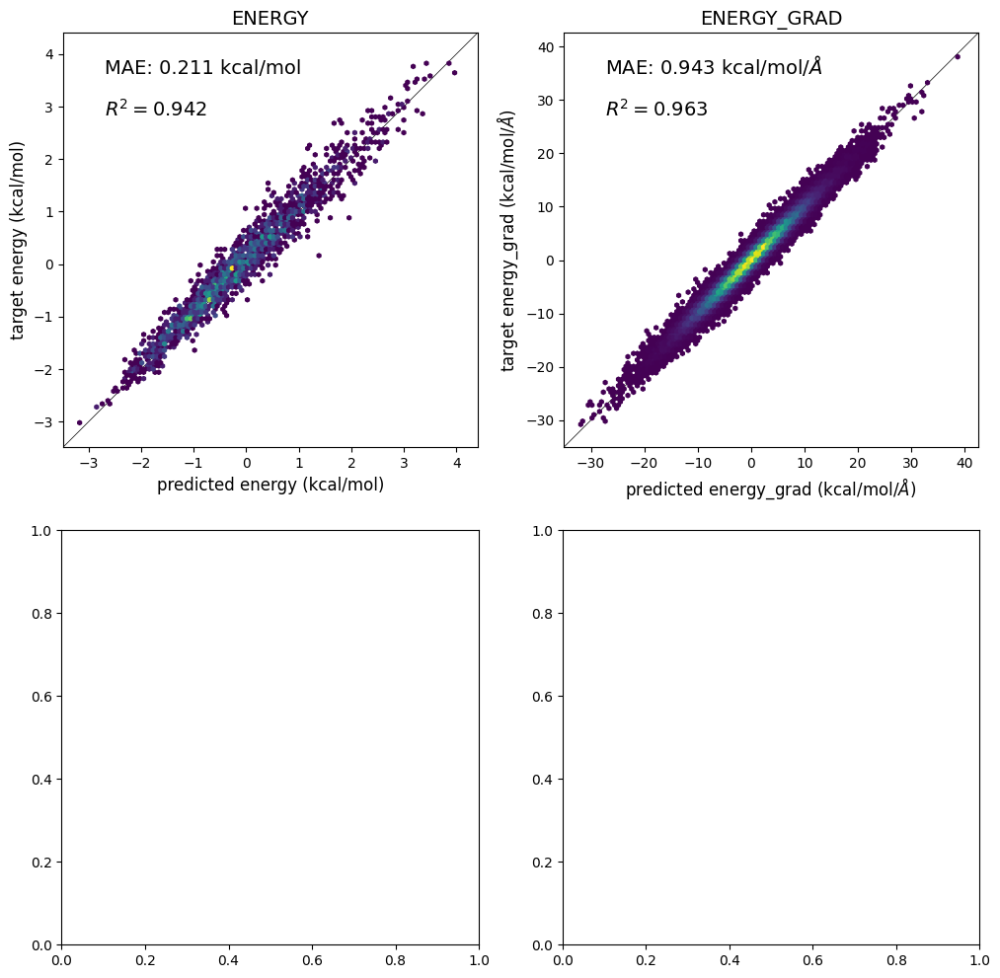

In [12]:
from sklearn.metrics import r2_score

best_model = load_model(OUTDIR, modelparams, 'RealSpookyNet')
results, targets, val_loss = evaluate(best_model,
                                      val_loader, 
                                      loss_fn, 
                                      device=DEVICE)

units = {
    'energy': 'kcal/mol',
    'energy_grad': r'kcal/mol/$\AA$',
    'q': '$e$'
}

fig, ax_figs = plt.subplots(2, 2, figsize=(12, 12))
all_units = list(units.keys())

for i, ax_fig in enumerate(ax_figs):
    
    keys = all_units[i * 2: i * 2 + 2]
    
    for ax, key in zip(ax_fig, keys):
        pred_fn = torch.cat
        targ_fn = torch.cat
        if all([len(i.shape) == 0 for i in results[key]]):
            pred_fn = torch.stack
        if all([len(i.shape) == 0 for i in targets[key]]):
            targ_fn = torch.stack

        pred = pred_fn(results[key], dim=0).view(-1).detach().cpu().numpy()
        targ = targ_fn(targets[key], dim=0).view(-1).detach().cpu().numpy()

        mae = abs(pred-targ).mean()

        ax.hexbin(pred, targ, mincnt=1)

        lim_min = min(np.min(pred), np.min(targ)) * 1.1
        lim_max = max(np.max(pred), np.max(targ)) * 1.1

        ax.set_xlim(lim_min, lim_max)
        ax.set_ylim(lim_min, lim_max)
        ax.set_aspect('equal')

        ax.plot((lim_min, lim_max),
                (lim_min, lim_max),
                color='#000000',
                zorder=-1,
                linewidth=0.5)
    
        r2 = r2_score(pred, targ)
        
        ax.set_title(key.upper(), fontsize=14)
        ax.set_xlabel('predicted %s (%s)' % (key, units[key]), fontsize=12)
        ax.set_ylabel('target %s (%s)' % (key, units[key]), fontsize=12)
        ax.text(0.1, 0.9, 'MAE: %.3f %s' % (mae, units[key]), 
               transform=ax.transAxes, fontsize=14)
        ax.text(0.1, 0.8, '$R^2=%.3f$' % r2, 
               transform=ax.transAxes, fontsize=14)
    
plt.show()

KeyError: 'q'

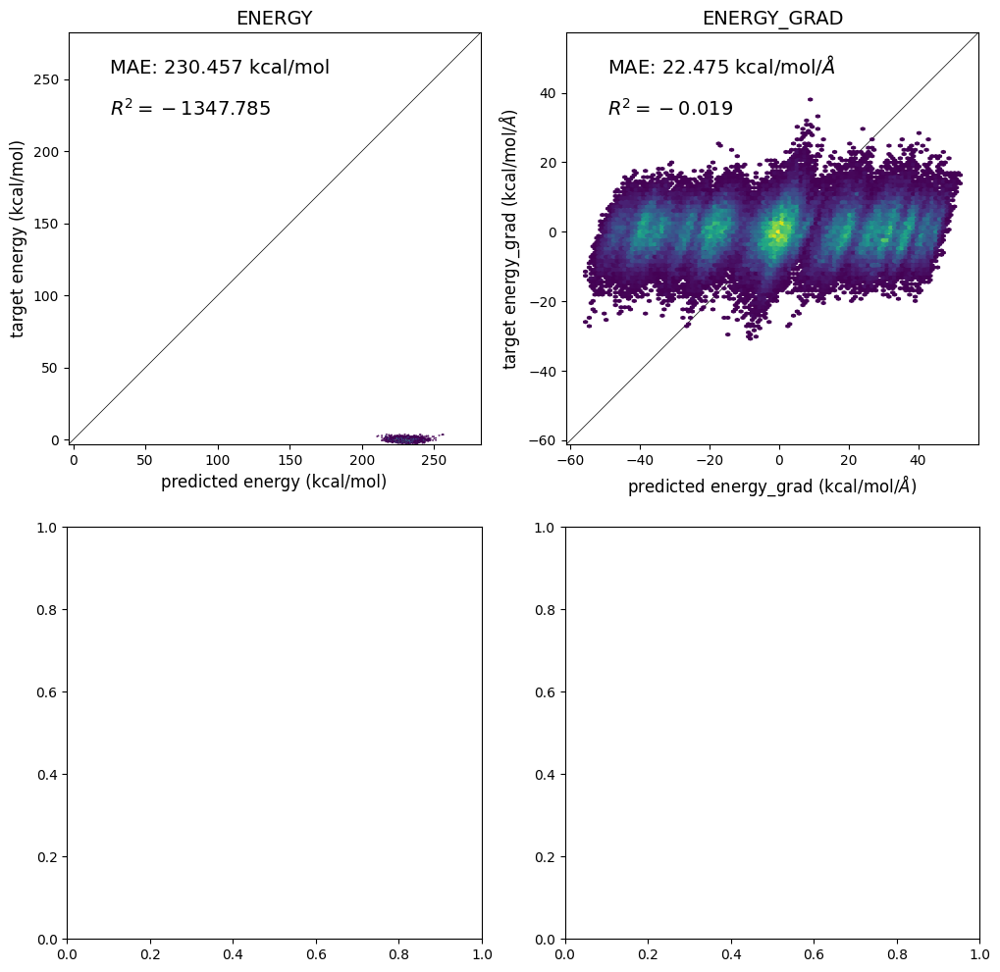

In [22]:

units = {
    'energy': 'kcal/mol',
    'energy_grad': r'kcal/mol/$\AA$',
    'q': '$e$'
}

fig, ax_figs = plt.subplots(2, 2, figsize=(12, 12))
all_units = list(units.keys())

for i, ax_fig in enumerate(ax_figs):
    
    keys = all_units[i * 2: i * 2 + 2]
    
    for ax, key in zip(ax_fig, keys):
        pred_fn = torch.cat
        targ_fn = torch.cat
        if all([len(i.shape) == 0 for i in results[key]]):
            pred_fn = torch.stack
        if all([len(i.shape) == 0 for i in targets[key]]):
            targ_fn = torch.stack

        pred = pred_fn(results[key], dim=0).view(-1).detach().cpu().numpy()
        targ = targ_fn(targets[key], dim=0).view(-1).detach().cpu().numpy()

        mae = abs(pred-targ).mean()

        ax.hexbin(pred, targ, mincnt=1)

        lim_min = min(np.min(pred), np.min(targ)) * 1.1
        lim_max = max(np.max(pred), np.max(targ)) * 1.1

        ax.set_xlim(lim_min, lim_max)
        ax.set_ylim(lim_min, lim_max)
        ax.set_aspect('equal')

        ax.plot((lim_min, lim_max),
                (lim_min, lim_max),
                color='#000000',
                zorder=-1,
                linewidth=0.5)
    
        r2 = r2_score(pred, targ)
        
        ax.set_title(key.upper(), fontsize=14)
        ax.set_xlabel('predicted %s (%s)' % (key, units[key]), fontsize=12)
        ax.set_ylabel('target %s (%s)' % (key, units[key]), fontsize=12)
        ax.text(0.1, 0.9, 'MAE: %.3f %s' % (mae, units[key]), 
               transform=ax.transAxes, fontsize=14)
        ax.text(0.1, 0.8, '$R^2=%.3f$' % r2, 
               transform=ax.transAxes, fontsize=14)
    
